# Theta Darshan + Composite traces analysis and extraction

In [1]:
# Initially developped with Python 3.10.1
import platform
if platform.python_version() != "3.10.1":
    print(platform.python_version())

from IPython.display import Markdown, display

def printmd(string):
    display(Markdown(string))


# Some imports. Not that much really 0.o
import sys
import yaml
from yaml import dump, CDumper
import datetime as dt
from datetime import date
from dateutil.relativedelta import relativedelta

from jinja2 import Environment, DictLoader, select_autoescape

import pandas as pd
pd.set_option('display.max_rows', 500)
pd.options.mode.copy_on_write = True # Pandas is the most f*****-up Python library ever.

import numpy as np

import seaborn as sns
import matplotlib  as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

from scipy.cluster.vq import vq, kmeans2, whiten

import drawsvg as draw

## Load dataset

In [2]:
# A few constants
YEAR = 2022
TRACES_PATH = "/home/hazrael/Documents/RawData/Theta"
DARSHAN_FILENAME = f"ANL-ALCF-DARSHAN-THETA_{YEAR}0101_{YEAR}1231.csv"
COMP_FILENAME = f"ANL-ALCF-DJC-THETA_{YEAR}0101_{YEAR}1231.csv"

# TRIGGERS FOR THE EXECUTION OF SOME THE CELLS
PLOT = True         # Plot SVG of some jobs

# Extracting Torque data into a temporary path
printmd(f"Looking for Theta data in **{TRACES_PATH}**")
printmd(f"Darshan (summarized) file should be **{DARSHAN_FILENAME}**")
printmd(f"Composite (Colbalt) file should be **{COMP_FILENAME}**")
printmd(f"Data should from year > **{YEAR}** <")

Looking for Theta data in **/home/hazrael/Documents/RawData/Theta**

Darshan (summarized) file should be **ANL-ALCF-DARSHAN-THETA_20220101_20221231.csv**

Composite (Colbalt) file should be **ANL-ALCF-DJC-THETA_20220101_20221231.csv**

Data should from year > **2022** <

In [3]:
# Load trace files

# low_memory=False ==> has to be set in order for Pandas to use (mostly) correct types for every column
darshan_traces = pd.read_csv(f"{TRACES_PATH}/{YEAR}/{DARSHAN_FILENAME}", low_memory=False)
comp_traces = pd.read_csv(f"{TRACES_PATH}/{YEAR}/{COMP_FILENAME}", low_memory=False)

printmd(f"Main Darshan dataset shape : {darshan_traces.shape}")
printmd(f"Composite dataset shape : {comp_traces.shape}")

Main Darshan dataset shape : (715553, 187)

Composite dataset shape : (62566, 57)

In [4]:
# Merge datasets together

combined_dt = darshan_traces.merge(comp_traces, on="COBALT_JOBID", how='left')
printmd(f"Combined dataset shape : {combined_dt.shape} (after merge on COBALT_JOBID column)")

# Print columns (temp)
columns = list(combined_dt.columns)
for col in columns:
    print(col)

Combined dataset shape : (715553, 243) (after merge on COBALT_JOBID column)

MACHINE_NAME_x
COBALT_JOBID
RUN_DATE_ID
USER_ID
EXE_NAME_GENID
START_TIME
END_TIME
NPROCS
RUN_TIME
DARSHAN_LOG_VERSION
DARSHAN_LIB_VERSION
TOTAL_POSIX_OPENS
TOTAL_POSIX_READS
TOTAL_POSIX_WRITES
TOTAL_POSIX_SEEKS
TOTAL_POSIX_STATS
TOTAL_POSIX_MMAPS
TOTAL_POSIX_FSYNCS
TOTAL_POSIX_FDSYNCS
TOTAL_POSIX_MODE
TOTAL_POSIX_BYTES_READ
TOTAL_POSIX_BYTES_WRITTEN
TOTAL_POSIX_MAX_BYTE_READ
TOTAL_POSIX_MAX_BYTE_WRITTEN
TOTAL_POSIX_CONSEC_READS
TOTAL_POSIX_CONSEC_WRITES
TOTAL_POSIX_SEQ_READS
TOTAL_POSIX_SEQ_WRITES
TOTAL_POSIX_RW_SWITCHES
TOTAL_POSIX_MEM_NOT_ALIGNED
TOTAL_POSIX_MEM_ALIGNMENT
TOTAL_POSIX_FILE_NOT_ALIGNED
TOTAL_POSIX_FILE_ALIGNMENT
TOTAL_POSIX_MAX_READ_TIME_SIZE
TOTAL_POSIX_MAX_WRITE_TIME_SIZE
TOTAL_POSIX_SIZE_READ_0_100
TOTAL_POSIX_SIZE_READ_100_1K
TOTAL_POSIX_SIZE_READ_1K_10K
TOTAL_POSIX_SIZE_READ_10K_100K
TOTAL_POSIX_SIZE_READ_100K_1M
TOTAL_POSIX_SIZE_READ_1M_4M
TOTAL_POSIX_SIZE_READ_4M_10M
TOTAL_POSIX_SIZE_READ_10M_100M
TOTAL_POSIX_SIZE_READ_100M_1G
TOTAL_POSIX_SIZE_READ_1G_PLUS
TOTA

In [5]:
# Filter out columns that won't be needed for our analysis
# Note: regarding volumes, we choose to use only POSIX (MPIIO values are usually the same as POSIX, and STDIO values are marginal)

reduced_col_list = [
    "COBALT_JOBID", # COBALT
    "RUN_DATE_ID",  # Darshan (?) - YEAR MONTH DAY format
    "START_TIME",   # From Darshan - start timestamp of a record
    "END_TIME",     # From Darshan
    "NPROCS",       # From Darshan - Number of MPI procs in the record's MPI communicator
    "RUN_TIME",     # From Darshan (not necessarily the entire runtime of a job, but rather the runtime of a Darshan record)
    "TOTAL_POSIX_OPENS",          # Darshan
    "TOTAL_STDIO_OPENS",          # Darshan
    "TOTAL_MPIIO_INDEP_OPENS",    # Darshan
    "TOTAL_MPIIO_COLL_OPENS",     # Darshan
    "TOTAL_POSIX_READS",
    "TOTAL_POSIX_WRITES",
    "TOTAL_STDIO_READS",
    "TOTAL_STDIO_WRITES",
    "TOTAL_MPIIO_INDEP_READS",
    "TOTAL_MPIIO_INDEP_WRITES",
    "TOTAL_MPIIO_COLL_READS",
    "TOTAL_MPIIO_COLL_WRITES",
    "TOTAL_POSIX_BYTES_READ",     # Darshan
    "TOTAL_POSIX_BYTES_WRITTEN",  # Darshan
    "TOTAL_POSIX_F_READ_TIME",    # Darshan
    "TOTAL_POSIX_F_WRITE_TIME",   # Darshan 
    "TOTAL_POSIX_F_META_TIME",    # Darshan
    "TOTAL_MPIIO_BYTES_READ",     # Darshan
    "TOTAL_MPIIO_BYTES_WRITTEN",  # Darshan
    "TOTAL_MPIIO_F_READ_TIME",    # Darshan
    "TOTAL_MPIIO_F_WRITE_TIME",   # Darshan 
    "TOTAL_MPIIO_F_META_TIME",    # Darshan
    "QUEUED_TIMESTAMP",           # COBALT 
    "START_TIMESTAMP",            #  |
    "END_TIMESTAMP",              #  V
    "QUEUED_DATE_ID",
    "START_DATE_ID",
    "END_DATE_ID",
    "WALLTIME_SECONDS",   # COBALT log for the entire job duration
    "RUNTIME_SECONDS",    # COBALT log for the entire job duration
    "NODES_USED",
    "NODES_REQUESTED",
    "CORES_USED",
    "CORES_REQUESTED",
    "QUEUED_WAIT_SECONDS",        #   ^
    "REQUESTED_CORE_HOURS",       #   |
    "USED_CORE_HOURS",            # COBALT 
]

reduced_traces = combined_dt[reduced_col_list]
pd.options.display.max_columns = 100
reduced_traces.sort_values(by="COBALT_JOBID")

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,TOTAL_POSIX_BYTES_READ,TOTAL_POSIX_BYTES_WRITTEN,TOTAL_POSIX_F_READ_TIME,TOTAL_POSIX_F_WRITE_TIME,TOTAL_POSIX_F_META_TIME,TOTAL_MPIIO_BYTES_READ,TOTAL_MPIIO_BYTES_WRITTEN,TOTAL_MPIIO_F_READ_TIME,TOTAL_MPIIO_F_WRITE_TIME,TOTAL_MPIIO_F_META_TIME,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS
2595,570006,20220103,1641170699,1641170717,256,19,361240,256,0,0,360960,3251,256,0,0,0,0,0,645303040,154094,37.033654,0.179090,29.560484,0,0,0.0,0.0,0.0,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.0,530340.975800
2175,570006,20220103,1641170697,1641170724,448,28,626328,448,0,0,626752,4933,448,0,0,0,0,0,1088009216,243544,58.495281,0.274141,60.172117,0,0,0.0,0.0,0.0,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.0,530340.975800
1384,570006,20220103,1641170698,1641170725,448,28,626328,448,0,0,626752,4924,448,0,0,0,0,0,1088009216,242077,70.254335,0.234766,72.412492,0,0,0.0,0.0,0.0,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.0,530340.975800
7786,571226,20220107,1641546734,1641567645,1024,20912,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090614509,40394424,4682.036698,3.627704,28.630000,0,0,0.0,0.0,0.0,2021-12-27 18:56:33,2022-01-07 09:12:05,2022-01-07 15:01:46,20211227,20220107,20220107,21600.0,20980.26,1024.0,1024.0,65536.0,65536.0,915332,393216.0,382894.080000
2467,571227,20220103,1641213614,1641234364,1024,20751,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090614509,40394432,8963.559951,21.309396,121.921296,0,0,0.0,0.0,0.0,2021-12-27 18:56:34,2022-01-03 12:40:03,2022-01-03 18:26:57,20211227,20220103,20220103,21600.0,20813.84,1024.0,1024.0,65536.0,65536.0,582209,393216.0,404466.342200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715497,639477,20221231,1672521296,1672521571,72,276,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0.0,0.0,0.0,2022-12-31 21:13:42,2022-12-31 21:14:42,2022-12-31 21:20:23,20221231,20221231,20221231,480.0,341.74,6.0,6.0,384.0,384.0,60,51.2,42.133312
715545,639478,20221231,1672521800,1672522082,72,283,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0.0,0.0,0.0,2022-12-31 21:21:46,2022-12-31 21:23:05,2022-12-31 21:29:32,20221231,20221231,20221231,480.0,386.42,6.0,6.0,384.0,384.0,79,51.2,47.893312
715535,639479,20221231,1672522270,1672522544,72,275,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0.0,0.0,0.0,2022-12-31 21:29:53,2022-12-31 21:30:56,2022-12-31 21:36:34,20221231,20221231,20221231,480.0,337.72,6.0,6.0,384.0,384.0,63,51.2,42.240000
715481,639480,20221231,1672522794,1672523087,72,294,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0,0,0.0,0.0,0.0,2022-12-31 21:37:56,2022-12-31 21:39:34,2022-12-31 21:45:36,20221231,20221231,20221231,480.0,361.46,6.0,6.0,384.0,384.0,98,51.2,45.120000


In [6]:
# Print shape of reduced traces
rtraces_rows, rtraces_cols = reduced_traces.shape
printmd(f"**{rtraces_rows}** rows and **{rtraces_cols}** columns in reduced_traces\n")

# Print dtypes for all columns (DEBUG is needed)
# print("# DTYPES : \n")
# rtraces_dtypes = reduced_traces.dtypes
# print(rtraces_dtypes)

**715553** rows and **43** columns in reduced_traces


## Update types in datetime columns

In [7]:
# Check whether or not we have null values in timestamps columns

listNoNullData = reduced_traces[['QUEUED_TIMESTAMP', 'START_TIMESTAMP', 'END_TIMESTAMP']].isna().any(axis='columns').to_list()
printmd(f"\nFound >> **{listNoNullData.count(True)}** << lines with NaN values in timestamps")

# Convert string dates ('2022-01-01 14:19:53') to pandas datetime formats
reduced_traces.loc[:, 'QUEUED_TIMESTAMP'] = pd.to_datetime(reduced_traces['QUEUED_TIMESTAMP'], format="%Y-%m-%d %H:%M:%S")
reduced_traces.loc[:, 'START_TIMESTAMP'] = pd.to_datetime(reduced_traces['START_TIMESTAMP'], format="%Y-%m-%d %H:%M:%S")
reduced_traces.loc[:, 'END_TIMESTAMP'] = pd.to_datetime(reduced_traces['END_TIMESTAMP'], format="%Y-%m-%d %H:%M:%S")


Found >> **0** << lines with NaN values in timestamps

## Creating a read and write mean bandwidth column for each run

**Note**: these bandwidth do not include the meta time (we don't know what part of meta time supports read operations and what part supports write operations)

In [8]:
reduced_traces.loc[:, "MEAN_READ_BW_B"] = reduced_traces["TOTAL_POSIX_BYTES_READ"] / reduced_traces["TOTAL_POSIX_F_READ_TIME"]
reduced_traces.loc[:, "MEAN_WRITE_BW_B"] = reduced_traces["TOTAL_POSIX_BYTES_WRITTEN"] / reduced_traces["TOTAL_POSIX_F_WRITE_TIME"]

reduced_traces.loc[:, 'MEAN_READ_BW_B'] = reduced_traces["MEAN_READ_BW_B"].fillna(0)
reduced_traces.loc[:, 'MEAN_WRITE_BW_B'] = reduced_traces["MEAN_WRITE_BW_B"].fillna(0)

## Stats on the number of Darshan record per Cobalt job

Done prior to doing a groupby on job ID.

In [9]:
# Check how many jobs have multiple Darshan logs tagged with the same job ID
# This is obsverd when multiple independant applications monitored with Darshan are run from within the same Cobalt job

darshan_traces_per_job_id = reduced_traces.groupby(by="COBALT_JOBID", group_keys=True).size()
multi_part_traces_id = darshan_traces_per_job_id[darshan_traces_per_job_id != 1]
single_part_traces_id = darshan_traces_per_job_id[darshan_traces_per_job_id == 1]

printmd(f"- Number of COBALT jobs with MORE THAN one Darshan record : >> **{multi_part_traces_id.shape[0]}** jobs <<\r"+
        f"- Number of COBALT jobs with EXACTLY one Darshan record   : >> **{single_part_traces_id.shape[0]}** jobs <<")

printmd("Details for multi parts jobs:")
print(f" - 95th percentile for number of Darshan records per COBALT job: {darshan_traces_per_job_id.quantile(0.95)} (95% of jobs in the whole dataset have less than {darshan_traces_per_job_id.quantile(0.95)} Darshan records)")
print(f" - 99th percentile for number of Darshan records per COBALT job: {darshan_traces_per_job_id.quantile(0.99)} (99% of jobs in the whole dataset have less than {darshan_traces_per_job_id.quantile(0.99)} Darshan records)")
print(f" - Min. number of Darshan records per COBALT job is: {darshan_traces_per_job_id.min()}")
print(f" - Max. number of Darshan records per COBALT job is: {darshan_traces_per_job_id.max()}")
print(f" - Mean number of Darshan records per COBALT job is: {darshan_traces_per_job_id.mean()}")
print(f" - Median number of Darshan records per COBALT job is: {darshan_traces_per_job_id.median()}")
print(f" - {multi_part_traces_id[multi_part_traces_id < 10].shape[0]} COBALT jobs have strictly less than 10 associated Darshan records")

# List jobs with abnormal / problematic number of Darshan record
problematic_jobs_5k =  multi_part_traces_id[multi_part_traces_id > 5000].index
problematic_jobs_10k = multi_part_traces_id[multi_part_traces_id > 10000].index

printmd(f"There are **{problematic_jobs_5k.shape[0]}** jobs with more than 5K associated Darshan records, and they are : {list(problematic_jobs_5k)}")
printmd(f"There are **{problematic_jobs_10k.shape[0]}** jobs with more than 10K associated Darshan records, and they are : {list(problematic_jobs_10k)}")

- Number of COBALT jobs with MORE THAN one Darshan record : >> **8530** jobs <<- Number of COBALT jobs with EXACTLY one Darshan record   : >> **9556** jobs <<

Details for multi parts jobs:

 - 95th percentile for number of Darshan records per COBALT job: 60.0 (95% of jobs in the whole dataset have less than 60.0 Darshan records)
 - 99th percentile for number of Darshan records per COBALT job: 840.300000000032 (99% of jobs in the whole dataset have less than 840.300000000032 Darshan records)
 - Min. number of Darshan records per COBALT job is: 1
 - Max. number of Darshan records per COBALT job is: 50027
 - Mean number of Darshan records per COBALT job is: 39.563916841756054
 - Median number of Darshan records per COBALT job is: 1.0
 - 4261 COBALT jobs have strictly less than 10 associated Darshan records


There are **18** jobs with more than 5K associated Darshan records, and they are : [581661, 595998, 595999, 596000, 596001, 596002, 596003, 597363, 597364, 597365, 597366, 597367, 600864, 600908, 601499, 601500, 609309, 620615]

There are **3** jobs with more than 10K associated Darshan records, and they are : [581661, 595998, 600908]

In [10]:
# Display some records where the job id is part of the 'multi_part_traces'
pd.set_option("display.min_rows", 500) 
reduced_traces[reduced_traces["COBALT_JOBID"].isin(multi_part_traces_id.index)].sort_values(by="COBALT_JOBID")

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,TOTAL_POSIX_BYTES_READ,TOTAL_POSIX_BYTES_WRITTEN,TOTAL_POSIX_F_READ_TIME,TOTAL_POSIX_F_WRITE_TIME,TOTAL_POSIX_F_META_TIME,TOTAL_MPIIO_BYTES_READ,TOTAL_MPIIO_BYTES_WRITTEN,TOTAL_MPIIO_F_READ_TIME,TOTAL_MPIIO_F_WRITE_TIME,TOTAL_MPIIO_F_META_TIME,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS,MEAN_READ_BW_B,MEAN_WRITE_BW_B
2595,570006,20220103,1641170699,1641170717,256,19,361240,256,0,0,360960,3251,256,0,0,0,0,0,645303040,154094,37.033654,0.179090,29.560484,0,0,0.0,0.000000,0.000000,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.000000,530340.975800,1.742477e+07,8.604277e+05
1384,570006,20220103,1641170698,1641170725,448,28,626328,448,0,0,626752,4924,448,0,0,0,0,0,1088009216,242077,70.254335,0.234766,72.412492,0,0,0.0,0.000000,0.000000,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.000000,530340.975800,1.548672e+07,1.031142e+06
2175,570006,20220103,1641170697,1641170724,448,28,626328,448,0,0,626752,4933,448,0,0,0,0,0,1088009216,243544,58.495281,0.274141,60.172117,0,0,0.0,0.000000,0.000000,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,528384.000000,530340.975800,1.859995e+07,8.883896e+05
64,571472,20220101,1641014603,1641015038,1024,436,1718874,1024,0,0,1442892,564345,1024,0,0,0,0,0,1154072360,45125261,134.210562,8.944735,746.697447,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,65536.000000,65881.882600,8.598968e+06,5.044896e+06
70,571472,20220101,1641014603,1641015050,1024,448,1739354,1024,0,0,1442892,611138,1024,0,0,0,0,0,1148008232,50042912,355.646890,9.523611,674.808239,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,65536.000000,65881.882600,3.227944e+06,5.254615e+06
75,571472,20220101,1641014604,1641015091,1024,488,1735258,1024,0,0,1442892,660388,1024,0,0,0,0,0,1150652200,56094488,180.356455,10.605594,1370.228483,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,65536.000000,65881.882600,6.379878e+06,5.289142e+06
137,571472,20220101,1641020025,1641020538,1024,514,1643098,1024,0,0,1442892,815496,1024,0,0,0,0,0,1148008232,75190834,165.325294,13.599807,299.907309,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,65536.000000,65881.882600,6.943936e+06,5.528816e+06
166,571472,20220101,1641019536,1641020012,1024,477,1743450,1024,0,0,1442892,611272,1024,0,0,0,0,0,1148008232,50048380,137.430988,9.884887,811.562834,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,65536.000000,65881.882600,8.353343e+06,5.063121e+06
186,571472,20220101,1641014603,1641015034,1024,432,1722970,1024,0,0,1442892,610595,1024,0,0,0,0,0,1148008232,50019871,731.193468,9.521952,1414.118009,0,0,0.0,0.000000,0.000000,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,5

## Dropping Darshan records where 'nprocs' is > to the number of requested cores

This seems to indicate jobs where the MPI communicator was running on threads (multiple per core) rather than per-core processes.

As we have no way to be sure about this and it could potentially have consequences for the job models, we resort to dropping these jobs.

In [11]:
# Find out how many Darshan records have an 'nprocs' greater than the actual number of requested physical cores.
# We may want to remove them, as they will likely not conform at all to the rest of the dataset :/

nprocs_larger_than_phys_core = reduced_traces[reduced_traces["NPROCS"] > reduced_traces["CORES_REQUESTED"]]
print(f"There are >> {nprocs_larger_than_phys_core.shape[0]} << darshan records where the recorded 'nprocs' is larger than the requested cores count")

nprocs_larger_per_job_id = nprocs_larger_than_phys_core.groupby(by="COBALT_JOBID", group_keys=True).size()
print(f" -> It concerns >> {nprocs_larger_per_job_id.shape[0]} << unique Cobalt jobs")

print("Dropping these rows...")
reduced_traces = reduced_traces.drop(nprocs_larger_than_phys_core.index)

There are >> 349 << darshan records where the recorded 'nprocs' is larger than the requested cores count
 -> It concerns >> 211 << unique Cobalt jobs
Dropping these rows...


## Temporary cell for keeping trace of 'debugs' on individual jobs

In [12]:
# DEBUG on single jobs

# job_id = 570006
# job_id = 572665
# job_id = 571582
# job_id = 571472
# job_id = 571686
# job_id = 572613
# job_id = 595998
# job_id = 612416
# job_id = 571862
# job_id = 637536
# job_id = 622683
# job_id = 623565
# job_id = 575494
# job_id = 626023  # low w MPIIO bw / "normal" POSIX BW
# job_id = 626672 # Weird outlier in week 41 (simulation way too slow)
# job_id = 626756  # Another outlier in week41, when the IO filters are less strict
job_id = 572220  # causing error with categories

job = reduced_traces[(reduced_traces["COBALT_JOBID"] == job_id)]
job = job.sort_values(by="START_TIME", axis=0)
job

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,TOTAL_POSIX_BYTES_READ,TOTAL_POSIX_BYTES_WRITTEN,TOTAL_POSIX_F_READ_TIME,TOTAL_POSIX_F_WRITE_TIME,TOTAL_POSIX_F_META_TIME,TOTAL_MPIIO_BYTES_READ,TOTAL_MPIIO_BYTES_WRITTEN,TOTAL_MPIIO_F_READ_TIME,TOTAL_MPIIO_F_WRITE_TIME,TOTAL_MPIIO_F_META_TIME,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS,MEAN_READ_BW_B,MEAN_WRITE_BW_B
2682,572220,20220103,1641232645,1641234534,1,1890,2802776,8,0,0,8404,2794370,0,31,0,0,0,0,68776736,31310538,1.696763,237.843734,1.113841,0,0,0.0,0.0,0.0,2022-01-03 17:56:25,2022-01-03 17:57:03,2022-01-03 18:29:31,20220103,20220103,20220103,3600.0,1947.7,1.0,1.0,64.0,64.0,38,64.0,35.5911,4.053409e+07,131643.3167


In [13]:
reduced_traces[reduced_traces["COBALT_JOBID"] == 598565]

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,TOTAL_POSIX_BYTES_READ,TOTAL_POSIX_BYTES_WRITTEN,TOTAL_POSIX_F_READ_TIME,TOTAL_POSIX_F_WRITE_TIME,TOTAL_POSIX_F_META_TIME,TOTAL_MPIIO_BYTES_READ,TOTAL_MPIIO_BYTES_WRITTEN,TOTAL_MPIIO_F_READ_TIME,TOTAL_MPIIO_F_WRITE_TIME,TOTAL_MPIIO_F_META_TIME,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS,MEAN_READ_BW_B,MEAN_WRITE_BW_B
211763,598565,20220511,1652227249,1652234848,8576,7600,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962680,453.980684,61.832489,3270.092031,5329373920,8373348348,431.341578,276.035461,608.365771,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,7.987047e+07,1.357371e+08
211858,598565,20220511,1652227249,1652234853,8576,7605,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962682,169.150912,52.708167,2674.411842,5329373920,8373348348,452.605743,275.670991,605.847856,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,2.143627e+08,1.592346e+08
212013,598565,20220511,1652227249,1652234823,8576,7575,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962686,128.653747,54.741768,2619.089952,5329373920,8373348348,465.070138,275.595660,630.292950,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,2.818391e+08,1.533192e+08
212105,598565,20220511,1652227248,1652234907,8576,7660,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962692,509.525529,58.155339,2354.005833,5329373920,8373348348,526.954635,275.775822,513.139418,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,7.116356e+07,1.443197e+08
212344,598565,20220511,1652227249,1652234861,8576,7613,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962684,237.072663,54.006904,3813.164506,5329373920,8373348348,473.207941,274.084443,612.024446,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,1.529474e+08,1.554054e+08
212482,598565,20220511,1652227249,1652234868,8576,7620,244079,7318,5480,10548,1244676,314639,7269,1487638,1888,46,14822,5916,36259651647,8392962684,3896.506218,58.889416,3569.712677,5329373920,8373348348,457.529599,284.367544,626.602004,2022-05-09 15:19:56,2022-05-11 00:00:22,2022-05-11 02:09:57,20220509,20220511,20220511,10800.0,7775.27,804.0,804.0,51456.0,51456.0,117626,154368.0,111831.0382,9.305683e+06,1.425207e+08


TOTAL_POSIX_OPENS : [ 39156   8967   3086   9532   1430   5919    758    708    507    417
    550    977   1185    906    444    303    191    174    156    158
    389    113    413     51     30   8498    215     38     51    517
  20332    154    581    251     37     66     43     21  48531      7
  10264     49     22     46     27    576    144    207     64     86
     19 199542     87     48    110   2261    855    531   1999    641
    173    420    250    157    134    150     40     29     42     53
     26     42     40     67     34     45     53     52     58     41
     49  11294     93     53     95     50     44     53     59     61
     57     56     85    111     89     79    131    107    115     82]


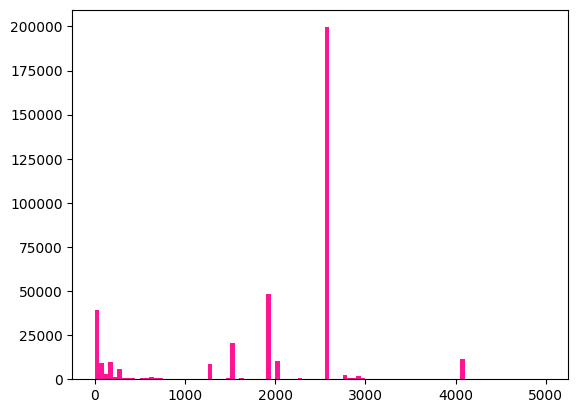

TOTAL_STDIO_OPENS : [512577  19701  48986   1284    491  37935   1165  32427    957    713
   2697    763    467   2306     53   5443    480   1213     30  10036
   4381    115     11    252    185     46     32     21    309   1835
    276    280      9      7     15      2     15    254     96   3983
   1405    209     24     18     46      5    196    192      0      0
      0     52      5     28    180    301     24      0     14     17
     26    243      6      0     21      5      0    260      0     52
      4      3    184     71      0      1     66      9      9      5
      6    452    124     34      2      3      0     12      7     66
      1      0     80      2      1      0      1     10      0      0]
Bins : [   0.   50.  100.  150.  200.  250.  300.  350.  400.  450.  500.  550.
  600.  650.  700.  750.  800.  850.  900.  950. 1000. 1050. 1100. 1150.
 1200. 1250. 1300. 1350. 1400. 1450. 1500. 1550. 1600. 1650. 1700. 1750.
 1800. 1850. 1900. 1950. 2000. 2050. 2100. 

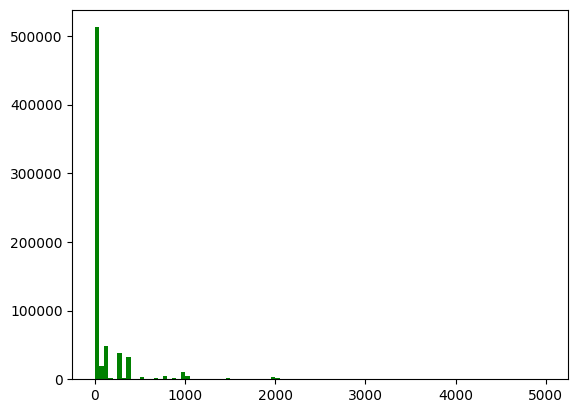

TOTAL_MPIIO_INDEP_OPENS : [713808      8     32      0      5     15     11      1      2     11
      0      0      0      4      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      9      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0]
Bins : [   0.   50.  100.  150.  200.  250.  300.  350.  400.  450.  500.  550.
  600.  650.  700.  750.  800.  850.  900.  950. 1000. 1050. 1100. 1150.
 1200. 1250. 1300. 1350. 1400. 1450. 1500. 1550. 1600. 1650. 1700. 1750.
 1800. 1850. 1900. 1950. 2000. 2050. 

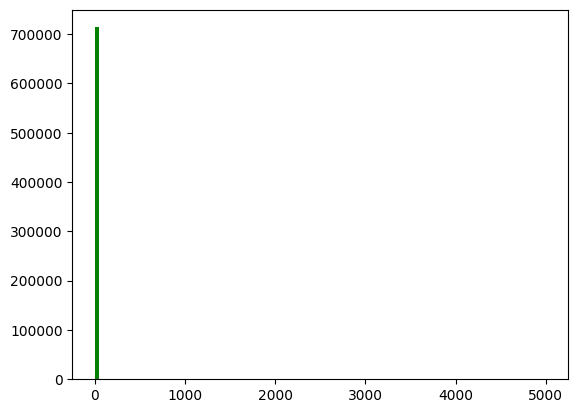

TOTAL_MPIIO_COLL_OPENS : [545454    309    366     79      9   5482     19     50      5      1
    429      4      6      5      0    234      4      2      0     26
    191      0      0      6      6     90      0      0      1      1
     48    145      2      2      0     22      0      1      2      0
    168      0      2      0      0      0      9      1      1      0
      0     49      1      3      0      0      6      0      0      2
      0     19     36      0      0      6      0      3      1      1
      0     21      0      0      1      0  46395      0      0      0
      0  11216      0      0      0      0      0      0      0      0
      0      1      8      0      0      0      0      0      0      0]
Bins : [   0.   50.  100.  150.  200.  250.  300.  350.  400.  450.  500.  550.
  600.  650.  700.  750.  800.  850.  900.  950. 1000. 1050. 1100. 1150.
 1200. 1250. 1300. 1350. 1400. 1450. 1500. 1550. 1600. 1650. 1700. 1750.
 1800. 1850. 1900. 1950. 2000. 2050. 2

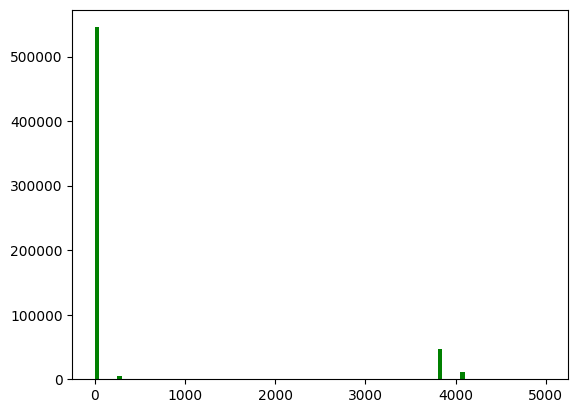

In [14]:
hist_data, bins = np.histogram(reduced_traces['TOTAL_POSIX_OPENS'], bins=100, range=(0, 5000))
print(f"TOTAL_POSIX_OPENS : {hist_data}")
# print(f"Bins : {bins}")

g = plt.stairs(
    hist_data, 
    bins,
    color="deeppink",
    fill=True,
)
plt.show()

hist_data, bins = np.histogram(reduced_traces['TOTAL_STDIO_OPENS'], bins=100, range=(0, 5000))
print(f"TOTAL_STDIO_OPENS : {hist_data}")
print(f"Bins : {bins}")

g = plt.stairs(
    hist_data, 
    bins,
    color="green",
    fill=True
)
plt.show()


hist_data, bins = np.histogram(reduced_traces['TOTAL_MPIIO_INDEP_OPENS'], bins=100, range=(0, 5000))
print(f"TOTAL_MPIIO_INDEP_OPENS : {hist_data}")
print(f"Bins : {bins}")

g = plt.stairs(
    hist_data, 
    bins,
    color="green",
    fill=True
)
plt.show()

hist_data, bins = np.histogram(reduced_traces['TOTAL_MPIIO_COLL_OPENS'], bins=100, range=(0, 5000))
print(f"TOTAL_MPIIO_COLL_OPENS : {hist_data}")
print(f"Bins : {bins}")

g = plt.stairs(
    hist_data, 
    bins,
    color="green",
    fill=True
)
plt.show()

## Plot of job records on SVG (needs to be activated in notebook's constants)

In [15]:
### PLOT SVG OF JOB's RECORDs for each multi records jobs (! quite long)

if PLOT:

    weird_month5_6_jobs = [598565, 598598, 601720, 602201]
    
    Y_OFFSET = 6
    WIDTH = 1800
    PAD = 30
    
    cmap = mpl.colormaps['nipy_spectral']
    cmap_core_hours = mpl.colormaps['turbo']
    
    norm = mpl.colors.LogNorm(vmin=1, vmax=804018281)
    norm_core_hours = mpl.colors.Normalize(vmin=0, vmax=1)
    
    all_svg_names = []
    overprovisionned_svg = []
    time_diff = {}

    # for job_id in multi_part_traces_id.index:
    for job_id in weird_month5_6_jobs:
        job = reduced_traces[reduced_traces["COBALT_JOBID"] == job_id]
        job = job.sort_values(by="START_TIME")
        
        rows, columns = job.shape
        HEIGHT = (rows + 10) * (Y_OFFSET)
        
        # print(f"{rows} rows and {columns} columns for job")
    
        REQ_CORE_HOURS = job.iloc[0]["REQUESTED_CORE_HOURS"]
        USED_CORE_HOURS = job.iloc[0]["USED_CORE_HOURS"]
    
        percent_used_core_hours = (USED_CORE_HOURS / REQ_CORE_HOURS)
        core_hours_color = cmap_core_hours(norm_core_hours(percent_used_core_hours))
        svg_core_hours_color = f"rgb({core_hours_color[0] * 100}%,{core_hours_color[1] * 100}%,{core_hours_color[2] * 100}%)"
        percent_used_core_hours_width = (WIDTH - PAD) * percent_used_core_hours
        
        d = draw.Drawing(WIDTH, HEIGHT, origin=(0,0))
        d.append(draw.Rectangle(0, 0, WIDTH + 2*PAD, HEIGHT, fill="#444444ff"))
        
        # Job total runtime
        d.append(draw.Lines(PAD, Y_OFFSET * 6, WIDTH - PAD, Y_OFFSET * 6, close=False, stroke="white", stroke_width=8))
        # Percentage of used core hours 
        d.append(draw.Lines(PAD, Y_OFFSET * 6, percent_used_core_hours_width, Y_OFFSET * 6, close=False, stroke=svg_core_hours_color, stroke_width=6))
        
        # Vertical boundaries
        d.append(draw.Lines(PAD + 1, Y_OFFSET * 6, PAD + 1, HEIGHT - Y_OFFSET, close=False, stroke="white", stroke_width=1, fill="white"))
        d.append(draw.Lines(WIDTH - PAD -1, Y_OFFSET * 6, WIDTH - PAD-1, HEIGHT - Y_OFFSET, close=False, stroke="white", stroke_width=1))
        
        label = f"{job.iloc[0]['COBALT_JOBID']} - Run from {job.iloc[0]['START_TIMESTAMP']} to {job.iloc[0]['END_TIMESTAMP']} ({job.iloc[0]['RUNTIME_SECONDS']}s) on {job.iloc[0]['NODES_USED']} nodes -- {rows} darshan logs lines -- {USED_CORE_HOURS} / {REQ_CORE_HOURS} core hours used"
        d.append(draw.Text(label, font_size=16, x=PAD, y=Y_OFFSET * 4, font_family='Roboto', fill='#ddddddff' ))
        
        COBALT_START = job.iloc[0]["START_TIMESTAMP"].timestamp()
        COBALT_END = job.iloc[0]["END_TIMESTAMP"].timestamp()
        
        def D_to_C(timestamp, job_id):
            if timestamp - 1 > COBALT_END:
                #print(f"WARNING : Timestamp > COBALT_END for this job {job_id} :: TS: {timestamp} vs {COBALT_END} : DIFF = {abs(timestamp - COBALT_END)}")
                if job_id not in time_diff:
                    time_diff[job_id] = abs(timestamp - COBALT_END)
            #if timestamp < COBALT_START:
            #    print(f"WARNING : Timestamp < COBALT_START for this job {job_id}")
            return timestamp * ((WIDTH - 2*PAD) / (COBALT_END - COBALT_START)) + PAD - ((WIDTH - 2*PAD) / (COBALT_END - COBALT_START)) * COBALT_START
        
        current_y = Y_OFFSET * 8
        total_nprocs = 0
        for index, row in job.iterrows():
    
            # if row["COBALT_JOBID"] == 571686:
                # print(f"Start time : {row['START_TIME']}  -> {D_to_C(row['START_TIME'])}  && end time : {row['END_TIME'] + 1}  -> {D_to_C(row['END_TIME'] + 1)}")
    
            total_nprocs += row["NPROCS"]
            
            
            io_vol = row["TOTAL_POSIX_BYTES_READ"] + row["TOTAL_POSIX_BYTES_WRITTEN"]
            io_vol = io_vol / 1000 / 1000
            color = cmap(norm(io_vol))
            svg_color=f"rgb({color[0] * 100}%,{color[1] * 100}%,{color[2] * 100}%)"
            # print(svg_color)
            x1 = D_to_C(row["START_TIME"], row['COBALT_JOBID'])
            x2 = D_to_C(row["END_TIME"] + 1, row['COBALT_JOBID'])
            d.append(draw.Lines(x1,
                                current_y, 
                                x2, 
                                current_y, close=False, 
                                stroke=svg_color, 
                                stroke_width=Y_OFFSET - 2, 
                                stroke_opacity=0.8))
            #if job.iloc[0]['COBALT_JOBID'] == 571626:
            #    d.append(draw.Lines(x2, current_y, x2, HEIGHT - Y_OFFSET, close=False, stroke="white", stroke_width=1, fill="white"))
            
            current_y += Y_OFFSET
    
        # if total_nprocs >= job.iloc[0]["CORES_USED"]:
            # print(f"job {job.iloc[0]['COBALT_JOBID']} has a cumulative nprocs sum ({total_nprocs}) >=  to cores_used ({job.iloc[0]['CORES_USED']})") 
    
        path = f"./time_plots/{job.iloc[0]['COBALT_JOBID']}.svg"
        all_svg_names.append(path)
    
        if job.iloc[0]['NPROCS'] > job.iloc[0]['CORES_REQUESTED']:
            overprovisionned_svg.append(path)
            
        with open(path, "w") as plot:
            plot.write(d.as_svg())
        #d.save_png(f"./time_plots/{job.iloc[0]['COBALT_JOBID']}.png")
    
        #if len(all_svg_names) > 30:
        #    break

In [16]:
# Display svg plots in a basic web page

if PLOT:
    HTML_TPLT = """
    <!DOCTYPE html>
    <html lang="en" data-theme="white">
        <head>
            <meta charset="utf-8" />
            <meta name="viewport" content="width=device-width, initial-scale=1" />
            <title>Darshan Theta Grid View</title>
            <meta name="description" content="A grid view of timelines from Darshan job traces" />
            <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@picocss/pico@1/css/pico.min.css" />
        </head>
    
        <body>
            <main class="container-fluid" style="padding-top:0.5em;">
            {% for svg_path in svgs %}
                <article style="padding:0.2em; margin-top:0.5em; margin-bottom:0.5em;">
                    <img src="{{svg_path}}" />
                </article>
            {% endfor %}
            <p>The End.</p>
            </main>
        </body>
    </html>
    """
    
    env = Environment(
        loader=DictLoader({'index.html': HTML_TPLT}),
        autoescape=select_autoescape()
    )
    template = env.get_template("index.html")
    with open("index.html", "w", encoding="utf-8") as page:
        page.write(template.render(svgs=all_svg_names))

## Groupby Darshan and Cobalt traces on the COBALT job ID 

In [17]:
# Group traces by COBALT_JOBID (multiple Darshan traces for the same JOB ID)

# First, drop the Darshan NPROCS and RUN_TIME columns, because their values are not helpful after aggregation.
# reduced_traces = reduced_traces.drop("NPROCS", axis=1)
# reduced_traces = reduced_traces.drop("RUN_TIME", axis=1)


grp_traces = reduced_traces.groupby(by="COBALT_JOBID", group_keys=True).agg({
    "COBALT_JOBID": "first",
    "RUN_DATE_ID": "first",
    "START_TIME": "min",      # min start timestamp among any Darshan trace
    "END_TIME": "max",        # max end timestamp among any Darshan trace
    "NPROCS": "sum",          # Sum nprocs from all traced executions
    "RUN_TIME": "sum",        # Sum darshan runtimes over all executionss
    "TOTAL_POSIX_OPENS": "sum",          # Darshan
    "TOTAL_STDIO_OPENS": "sum",          # Darshan
    "TOTAL_MPIIO_INDEP_OPENS": "sum",    # Darshan
    "TOTAL_MPIIO_COLL_OPENS": "sum",     # Darshan
    "TOTAL_POSIX_READS": "sum",
    "TOTAL_POSIX_WRITES": "sum",
    "TOTAL_STDIO_READS": "sum",
    "TOTAL_STDIO_WRITES": "sum",
    "TOTAL_MPIIO_INDEP_READS": "sum",
    "TOTAL_MPIIO_INDEP_WRITES": "sum",
    "TOTAL_MPIIO_COLL_READS": "sum",
    "TOTAL_MPIIO_COLL_WRITES": "sum",
    "TOTAL_POSIX_BYTES_READ": "sum",
    "TOTAL_POSIX_BYTES_WRITTEN": "sum",
    "TOTAL_POSIX_F_READ_TIME": "sum",
    "TOTAL_POSIX_F_WRITE_TIME": "sum", 
    "TOTAL_POSIX_F_META_TIME": "sum",
    "QUEUED_TIMESTAMP": "first",
    "START_TIMESTAMP": "first",
    "END_TIMESTAMP": "first",
    "QUEUED_DATE_ID": "first",
    "START_DATE_ID": "first",
    "END_DATE_ID": "first",
    "WALLTIME_SECONDS": "first",
    "RUNTIME_SECONDS": "first",
    "NODES_USED": "first",
    "NODES_REQUESTED": "first",
    "CORES_USED": "first",
    "CORES_REQUESTED": "first",
    "QUEUED_WAIT_SECONDS": "first",
    "REQUESTED_CORE_HOURS": "first",
    "USED_CORE_HOURS": "first",
})

grp_traces

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,TOTAL_POSIX_BYTES_READ,TOTAL_POSIX_BYTES_WRITTEN,TOTAL_POSIX_F_READ_TIME,TOTAL_POSIX_F_WRITE_TIME,TOTAL_POSIX_F_META_TIME,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS
COBALT_JOBID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
570006,570006,20220103,1641170697,1641170725,1152,75,1613896,1152,0,0,1614464,13108,1152,0,0,0,0,0,2821321472,639715,165.783270,6.879970e-01,1.621451e+02,2021-12-20 16:25:12,2022-01-03 00:43:18,2022-01-03 06:44:38,20211220,20220103,20220103,21600.0,21680.00,1376.0,1376.0,88064.0,88064.0,1153086,5.283840e+05,5.303410e+05
571226,571226,20220107,1641546734,1641567645,1024,20912,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090614509,40394424,4682.036698,3.627704e+00,2.863000e+01,2021-12-27 18:56:33,2022-01-07 09:12:05,2022-01-07 15:01:46,20211227,20220107,20220107,21600.0,20980.26,1024.0,1024.0,65536.0,65536.0,915332,3.932160e+05,3.828941e+05
571227,571227,20220103,1641213614,1641234364,1024,20751,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090614509,40394432,8963.559951,2.130940e+01,1.219213e+02,2021-12-27 18:56:34,2022-01-03 12:40:03,2022-01-03 18:26:57,20211227,20220103,20220103,21600.0,20813.84,1024.0,1024.0,65536.0,65536.0,582209,3.932160e+05,4.044663e+05
571228,571228,20220103,1641214136,1641235093,1024,20958,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090625773,40394424,7820.385254,4.982672e+01,3.241384e+02,2021-12-27 18:56:37,2022-01-03 12:48:39,2022-01-03 18:39:32,20211227,20220103,20220103,21600.0,21053.25,1024.0,1024.0,65536.0,65536.0,582722,3.932160e+05,3.842776e+05
571229,571229,20220103,1641200284,1641221196,1024,20913,12769,2072,0,0,31938,37290,0,6438,0,0,0,0,20090625773,40394432,6757.979777,2.661983e+01,8.809016e+02,2021-12-27 18:56:39,2022-01-03 08:57:48,2022-01-03 14:47:28,20211227,20220103,20220103,21600.0,20979.75,1024.0,1024.0,65536.0,65536.0,568869,3.932160e+05,3.828759e+05
571231,571231,20220109,1641722303,1641743255,1024,20953,12765,2072,0,0,31818,37290,0,6438,0,0,0,0,20008800109,40393602,4177.163864,3.573891e+00,4.766706e+01,2021-12-27 18:56:51,2022-01-09 09:58:13,2022-01-09 15:48:54,20211227,20220109,20220109,21600.0,21040.75,1024.0,1024.0,65536.0,65536.0,1090882,3.932160e+05,3.840228e+05
571472,571472,20220101,1641014602,1641021099,28672,14569,49195658,28672,0,0,40575056,19549768,28672,0,0,0,0,0,32271421664,1657791795,7218.001666,3.262503e+02,3.424294e+04,2021-12-29 06:08:46,2022-01-01 05:21:55,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7238.00,512.0,512.0,32768.0,32768.0,256389,6.553600e+04,6.588188e+04
571484,571484,20220101,1641014606,1641021333,22528,16858,41429814,22528,0,0,32657032,22035498,22528,0,0,0,0,0,25485950428,1888021498,4904.443955,3.774505e+02,7.056338e+04,2021-12-29 06:50:51,2022-01-01 05:22:10,2022-01-01 07:22:33,20211229,20220101,20220101,7200.0,7223.00,256.0,256.0,16384.0,16384.0,253879,3.276800e+04,3.287267e+04
571485,571485,20220101,1641014628,1641021606,25600,16886,46271237,25600,0,0,36830060,21331069,25600,0,0,0,0,0,28911485776,1745143912,5423.483264,3.578349e+02,1.848803e+04,2021-12-29 06:50:53,2022-01-01 05:22:16,2022-01-01 07:22:51,20211229,20220101,20220101,7200.0,7235.00,256.0,256.0,16384.0,16384.0,253883,3.276800e+04,3.292729e+04


## Create 'TOTAL' columns for byte volumes and IO times and BW columns

We used to sum volumes from MPI-IO, POSIX, STDIO, until we understood that MPI-IO values are essentially a superset of POSIX values for this dataset, and that for the kind of I/O activities we want to model, STDIO values can reasonnably be excluded as not relevant.
In here we also create special columns for the cumulated mean bandwidth (that is, mean bandwidth of the different I/O phases in the aggregated Darshan records for each Cobalt reservation, for R/W, R & W), and the same data for R and W but divided by the number of nodes used in a reservation.


In [18]:
# Sum IO volume on all IO columns -> ACTUALLY USING POSIX ONLY RIGHT NOW (MPI-IO is a redundant superset of POSIX and 
# STDIO is mostly useless)
# /!\ a bit of legacy code in here, most of the cell is now basically renaming columns...

grp_traces['TOTAL_BYTES_READ'] = grp_traces.loc[:, "TOTAL_POSIX_BYTES_READ"]
grp_traces['TOTAL_BYTES_WRITTEN'] = grp_traces.loc[:, "TOTAL_POSIX_BYTES_WRITTEN"]
grp_traces['TOTAL_IO_VOLUME'] = grp_traces.loc[:, ("TOTAL_BYTES_READ", "TOTAL_BYTES_WRITTEN")].sum(axis=1)
# Drop unused IO volume columns
grp_traces = grp_traces.drop(["TOTAL_POSIX_BYTES_READ", "TOTAL_POSIX_BYTES_WRITTEN"], axis=1)

# Sum cumulated IO durations on all IO columns (POSIX / MPI / STD) -> EDIT : actually using only POSIX, same reasons as for I/O volume.
grp_traces['TOTAL_READ_TIME'] = grp_traces.loc[:, ("TOTAL_POSIX_F_READ_TIME")]
grp_traces['TOTAL_WRITE_TIME'] = grp_traces.loc[:, ("TOTAL_POSIX_F_WRITE_TIME")]
grp_traces['TOTAL_META_TIME'] = grp_traces.loc[:, ("TOTAL_POSIX_F_META_TIME")]

# Add a 'TOTAL_IO_TIME' column (including ALL runs for any single reservation)
# !!! This includes META Time 
grp_traces['TOTAL_IO_TIME_wMETA'] = grp_traces.loc[:, ("TOTAL_READ_TIME", "TOTAL_WRITE_TIME", "TOTAL_META_TIME")].sum(axis=1)
# !!! This DOES NOT include META Time 
grp_traces['TOTAL_IO_TIME'] = grp_traces.loc[:, ("TOTAL_READ_TIME", "TOTAL_WRITE_TIME")].sum(axis=1)

# Drop unused io time columns
grp_traces = grp_traces.drop(["TOTAL_POSIX_F_READ_TIME",
                              "TOTAL_POSIX_F_WRITE_TIME", 
                              "TOTAL_POSIX_F_META_TIME", ], axis=1)

## Cumul read/write BW (including ALL runs for any single reservation)
grp_traces["CUMUL_READ_BW"] = grp_traces["TOTAL_BYTES_READ"] / grp_traces["TOTAL_READ_TIME"]
grp_traces["CUMUL_READ_BW"] = grp_traces["CUMUL_READ_BW"].fillna(0)
grp_traces["CUMUL_READ_BW_MB"] = grp_traces.loc[:, "CUMUL_READ_BW"].apply(lambda x: x/1000000) # For plots
grp_traces["CUMUL_WRITE_BW"] = grp_traces["TOTAL_BYTES_WRITTEN"] / grp_traces["TOTAL_WRITE_TIME"]
grp_traces["CUMUL_WRITE_BW"] = grp_traces["CUMUL_WRITE_BW"].fillna(0)
grp_traces["CUMUL_WRITE_BW_MB"] = grp_traces.loc[:, "CUMUL_WRITE_BW"].apply(lambda x: x/1000000) # For plots


# Cumul IO BW (READ + WRITE) (including ALL runs for any single reservation)  --> !! IO time NOT including meta time !!
grp_traces["CUMUL_IO_BW"] = (grp_traces["TOTAL_BYTES_WRITTEN"] + grp_traces["TOTAL_BYTES_READ"]) / grp_traces["TOTAL_IO_TIME"]
grp_traces["CUMUL_IO_BW"] = grp_traces["CUMUL_IO_BW"].fillna(0)
grp_traces["CUMUL_IO_BW_MB"] = grp_traces.loc[:, "CUMUL_IO_BW"].apply(lambda x: x/1_000_000) # For plots

## Cumul read/write bw per node ((including ALL runs for any single reservation)
grp_traces["READ_BW_PER_NODES"] =  grp_traces["CUMUL_READ_BW"] / grp_traces["NODES_USED"]
grp_traces["WRITE_BW_PER_NODES"] =  grp_traces["CUMUL_WRITE_BW"] / grp_traces["NODES_USED"]

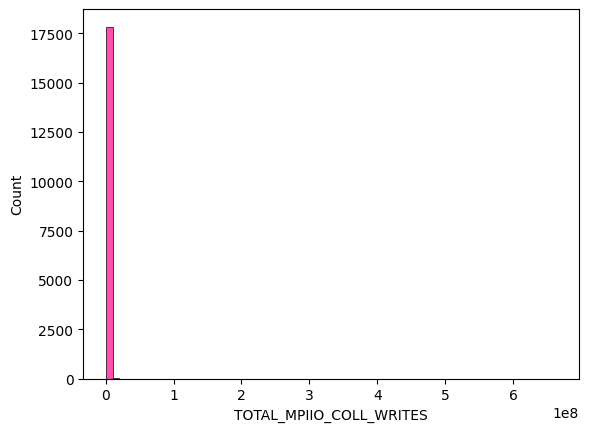

In [19]:
### DRAFT

# Things to draw histograms on:
# - TOTAL_MPIIO_COLL_WRITES
# - TOTAL_MPIIO_COLL_READS
# - TOTAL_MPIIO_COLL_OPENS
# - TOTAL_POSIX_WRITES
# - TOTAL_POSIX_READS (?)

binwidth = 10000000
g = sns.histplot(
    x=grp_traces['TOTAL_MPIIO_COLL_WRITES'], 
    binwidth=binwidth, 
    #discrete=False,
    #log_scale=[False, True],
    color="deeppink"
)

## Remove everything above 1e8 TOTAL_MPIIO_COLL_WRITES ?
## Remove everything above 5e6 TOTAL_MPIIO_COLL_READS ?
## Remove everything above 9e7 TOTAL_MPIIO_COLL_OPENS ? 
## Remove everything above 1.3e10 TOTAL_POSIX_WRITES ? 
## Remove everything above XX TOTAL_POSIX_READS ? 

In [20]:
non_zero_cumul_io_bw = grp_traces[grp_traces["CUMUL_IO_BW"] != 0]["CUMUL_IO_BW"]

print("## SHORT STATS on cumulated IO BW (helps for the job classes drawn on top of the scatter plot of jobs) ::\n")
print(f"The mean cumulative IO bandwidth of jobs is : {non_zero_cumul_io_bw.mean() / 1e6} MB/s")
print(f"The median of cumulative IO bandwidth of jobs is : {non_zero_cumul_io_bw.median() / 1e6} MB/s")
print(f"The std. deviation of cumulative IO bandwidth of jobs is : {non_zero_cumul_io_bw.std() / 1e6} MB/s")
print(f"The variance of cumulative IO bandwidth of jobs is : {non_zero_cumul_io_bw.var()}")
max_io_bw = non_zero_cumul_io_bw.max()
print(f"The max. cumulative IO bandwidth of jobs is : {max_io_bw / 1e6} MB/s")

coef_io_bw = max_io_bw * 0.2

grp_traces["FAST_JOBS"] = np.where((grp_traces.CUMUL_IO_BW >= coef_io_bw * 0.90) & (grp_traces.CUMUL_IO_BW < coef_io_bw), True, False)
print(f"{grp_traces[grp_traces.FAST_JOBS == True].shape[0]} jobs isolated for bandwidth classes coefficient computation")

## SHORT STATS on cumulated IO BW (helps for the job classes drawn on top of the scatter plot of jobs) ::

The mean cumulative IO bandwidth of jobs is : 79.99563887698426 MB/s
The median of cumulative IO bandwidth of jobs is : 15.74874297415638 MB/s
The std. deviation of cumulative IO bandwidth of jobs is : 123.39801517029173 MB/s
The variance of cumulative IO bandwidth of jobs is : 1.5227070147967546e+16
The max. cumulative IO bandwidth of jobs is : 2931.506053418177 MB/s
7 jobs isolated for bandwidth classes coefficient computation


### Compute line equations for 25th and 75th percentile of I/O bw

In [21]:
points = []

def compute_m(p0, p1):
    x0, x1 = p0[0], p1[0]
    y0, y1 = p0[1], p1[1]

    m = (np.log(y1 / y0) / np.log(x1 / x0))
    return m


def compute_b(m, p0):
    x0, y0 = p0[0], p0[1]
    b = y0 / ((x0)**m)
    return b


for _, row in grp_traces[grp_traces.FAST_JOBS == True].iterrows():

    print(f"X={row['TOTAL_IO_TIME']}, Y={row['TOTAL_IO_VOLUME']}")
    points.append((row['TOTAL_IO_TIME'], row['TOTAL_IO_VOLUME']))

m_values = []
for point in points:
    for other_point in points:
        if (abs(point[0] - other_point[0]) >= point[0] * 0.5) and (abs(point[1] - other_point[1]) >= point[1] * 0.5):
            m_values.append(compute_m(point, other_point))
            
m_mean = np.array(m_values).mean()    
m_mean 


b_values = []
for point in points:
    b_values.append(compute_b(m_mean, point))

b_mean = np.array(b_values).mean()  
b_mean

print(f"\n## We have m={m_mean} and b={b_mean}")

X=0.7969999999999999, Y=452729849
X=3.165948, Y=1743005134
X=3.1173309999999996, Y=1743005135
X=3.203169, Y=1743005101
X=3.116725, Y=1743004969
X=4.183361, Y=2296654040
X=16379.875209, Y=8670734015879

## We have m=0.9882449264978643 and b=565897443.4797307


In [22]:
## Compute a few main markers using these line coeffficients

non_zero_cumul_io_bw = grp_traces[grp_traces["CUMUL_IO_BW"] != 0]["CUMUL_IO_BW"]


r_75percentile = non_zero_cumul_io_bw.quantile(0.75)
print(f" - 75th percentile of cumulative IO bandwidth of jobs is : {r_75percentile / 1e6} MB/s")

job_75th_percentile = grp_traces[abs(grp_traces["CUMUL_IO_BW"] - r_75percentile) <= 10000].head(1)
non0_percentile75__b = compute_b(m_mean, (job_75th_percentile['TOTAL_IO_TIME'].iloc[0], job_75th_percentile['TOTAL_IO_VOLUME'].iloc[0]))
print(non0_percentile75__b)

# line_75 = [{"x":1e-1, "y": non0_percentile75__b * (1e-1)**m_mean}, {"x": 10e5, "y": non0_percentile75__b * (10e5)**m_mean}]
line_75 = {"x": [1e-1, 10e5], "y": [non0_percentile75__b * (1e-1)**m_mean, non0_percentile75__b * (10e5)**m_mean]}
print(line_75)

                                 
r_25percentile = non_zero_cumul_io_bw.quantile(0.25)
print(f" - 25th percentile of cumulative IO bandwidth of jobs is : {r_25percentile / 1e6} MB/s")

job_25th_percentile = grp_traces[abs(grp_traces["CUMUL_IO_BW"] - r_25percentile) <= 10000].head(1)
non0_percentile25__b = compute_b(m_mean, (job_25th_percentile['TOTAL_IO_TIME'].iloc[0], job_25th_percentile['TOTAL_IO_VOLUME'].iloc[0]))
print(non0_percentile25__b)
# line_25 = [{"x":1e-1, "y": non0_percentile25__b * (1e-1)**m_mean}, {"x": 10e5, "y": non0_percentile25__b * (10e5)**m_mean}]
line_25 = {"x": [1e-1, 10e5], "y": [non0_percentile25__b * (1e-1)**m_mean, non0_percentile25__b * (10e5)**m_mean]}
print(line_25)

 - 75th percentile of cumulative IO bandwidth of jobs is : 114.95656559375918 MB/s
117271339.51282004
{'x': [0.1, 1000000.0], 'y': [12048887.77557755, 99692260771798.42]}
 - 25th percentile of cumulative IO bandwidth of jobs is : 5.993329451743312 MB/s
6486074.276677784
{'x': [0.1, 1000000.0], 'y': [666403.0733204649, 5513805938109.2705]}


## Plot unfiltered dataset with 25th & 75th BW percentiles

(Well, mostly unfiltered, we did remove jobs where nprocs is superior to the actual number of cores already)

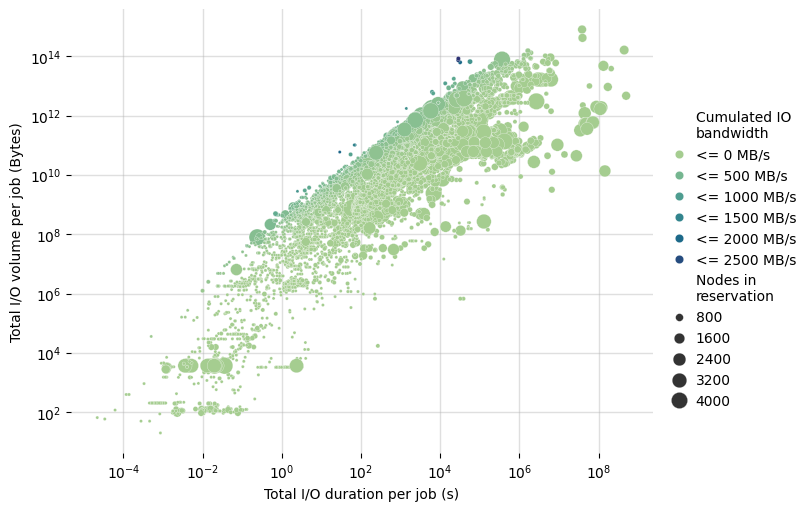

In [23]:
def plotDataset(traces: pd.DataFrame, filename: str, hue_col: str = "", size_col: str = "", quartile_lines: bool = True, xlimit: float = 0):
    """Plot the whole dataset in its current state (this function will be used throughout the notebook, after various filtering steps)"""   

    fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')
    
    g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                        hue=hue_col, 
                        palette=sns.color_palette("crest", as_cmap=True),
                        size=size_col,
                        sizes=(5, 150), 
                        data=traces, 
                        ax=ax, 
                        zorder=10)
    g.set(xscale='log', yscale='log')
    g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")

    if quartile_lines:
        sns.lineplot(x="x", y="y", data=line_75, legend=None, color="#e91140", zorder=20, label="Q3 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
        sns.lineplot(x="x", y="y", data=line_25, legend=None, color="#2b54a5", zorder=20, label="Q1 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
    
    ax.minorticks_on()
    ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
    ax.set_frame_on(False)
    
    if xlimit:
        ax.set_xlim(xlimit)
    
    legend = ax.legend(loc="best", bbox_to_anchor=(1, 0.5, 0, 0.3), fontsize=10, frameon=False, handletextpad=0.2)
    texts = legend.get_texts()
    for text in texts:
        if text.get_text() == hue_col:
            text.set_text("Cumulated IO\nbandwidth")
        if text.get_text() == size_col:
            text.set_text("Nodes in\nreservation")
            break
        try:
            int(text.get_text())
        except ValueError:
            continue
        else:
            text.set_text(f"<= {int(text.get_text())} MB/s")
    
    plt.savefig(filename, dpi=300)

plotDataset(grp_traces, "1_allJobs_noFilter.pdf", "CUMUL_IO_BW_MB", "NODES_USED", False)

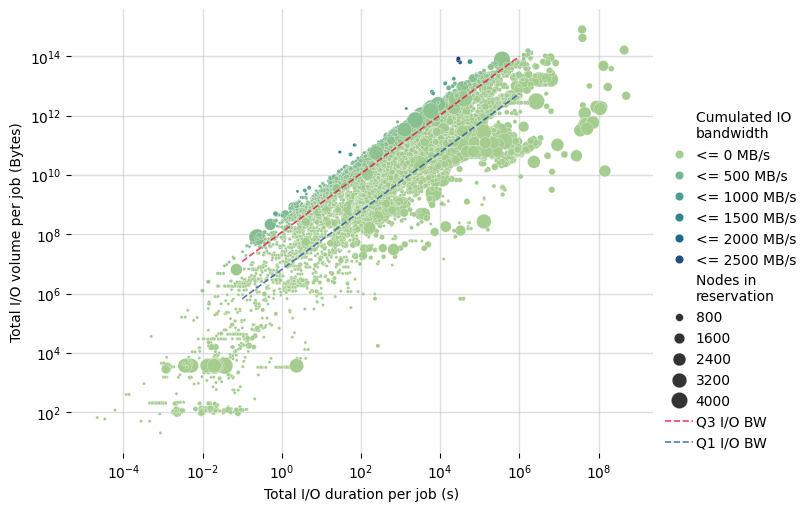

In [24]:
plotDataset(grp_traces, "2_allJobs_noFIlters_quartiles.png", "CUMUL_IO_BW_MB", "NODES_USED")

## Stats on R/W volume and times before filter

In [25]:
# Some stats on sums in groupby dataset 

print("# CUMULATED over all processes and all runs of every job:")

max_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].max()
max_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].max()
min_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].min()
min_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].min()

print(f"Max. sum of READ bytes: {max_sum_bytes_read / 1e12} TB")
highest_read_vol = grp_traces[grp_traces["TOTAL_BYTES_READ"] == grp_traces["TOTAL_BYTES_READ"].max()]
print(f"  - Corresponding job has a WRITTEN bytes sum of {highest_read_vol.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {highest_read_vol.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {highest_read_vol.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITTEN bytes : {max_sum_bytes_written / 1e12} TB")
highest_write_vol = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == grp_traces["TOTAL_BYTES_WRITTEN"].max()]
print(f"  - Corresponding job has a READ bytes sum of {highest_write_vol.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {highest_write_vol.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {highest_write_vol.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ bytes : {min_sum_bytes_read / 1e3} KB")
print(f"Min. sum of WRITTEN bytes : {min_sum_bytes_written / 1e3} KB")
print("---")

max_sum_read_time = grp_traces["TOTAL_READ_TIME"].max()
max_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].max()
min_sum_read_time = grp_traces["TOTAL_READ_TIME"].min()
min_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].min()
max_io_time = grp_traces["TOTAL_IO_TIME"].max()
min_io_time = grp_traces["TOTAL_IO_TIME"].min()

# Std. deviation
std_read_time = grp_traces["TOTAL_READ_TIME"].std()
std_write_time = grp_traces["TOTAL_WRITE_TIME"].std()
std_read_vol = grp_traces["TOTAL_BYTES_READ"].std()
std_write_vol = grp_traces["TOTAL_BYTES_WRITTEN"].std()
print(f"Read time standard deviation {std_read_time / 3600:.2f} hours")
print(f"Write time standard deviation {std_write_time / 3600:.2f} hours")
print(f"Read volumue standard deviation {std_read_vol / 1e12} TB")
print(f"Write volume standard deviation {std_write_vol / 1e12} TB")
print("---")

print(f"Max. sum of READ time : {max_sum_read_time / 3600} hours")
longest_read_job = grp_traces[grp_traces["TOTAL_READ_TIME"] == grp_traces["TOTAL_READ_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_read_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ bytes sum of {longest_read_job.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE bytes sum of {longest_read_job.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {longest_read_job.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {longest_read_job.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITE time : {max_sum_write_time / 3600} hours")
longest_write_job = grp_traces[grp_traces["TOTAL_WRITE_TIME"] == grp_traces["TOTAL_WRITE_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_write_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_write_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ bytes sum of {longest_write_job.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE bytes sum of {longest_write_job.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {longest_write_job.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {longest_write_job.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ time : {min_sum_read_time} s")
print(f"Min. sum of WRITE time : {min_sum_write_time} s")
print(f"Max. sum of IO time : {max_io_time / 3600} hours")
print(f"Min. sum of IO time : {min_io_time} s")

# TOTAL OVER THE YEAR (VOLUME & IO TIME)

total_io_read_volume_bytes = grp_traces["TOTAL_BYTES_READ"].sum()
total_io_write_volume_bytes = grp_traces["TOTAL_BYTES_WRITTEN"].sum()

print(f"Over the entire dataset, {total_io_read_volume_bytes / 1e12} read TB and {total_io_write_volume_bytes / 1e12} written TB")
print(f"That's a total IO volume of {total_io_read_volume_bytes / 1e12 + total_io_write_volume_bytes / 1e12} TB")

# CUMULATED over all processes and all runs of every job:
Max. sum of READ bytes: 84.323072433556 TB
  - Corresponding job has a WRITTEN bytes sum of 0.048253130269 TB / ID : 637536
  - Corresponding job has a READ duration sum of 7.07 hours / ID : 637536
  - Corresponding job has a WRITE duration sum of 0.92 hours / ID : 637536
Max. sum of WRITTEN bytes : 804.01789271699 TB
  - Corresponding job has a READ bytes sum of 0.0 TB / ID : 613806
  - Corresponding job has a READ duration sum of 0.00 hours / ID : 613806
  - Corresponding job has a WRITE duration sum of 10630.63 hours / ID : 613806
Min. sum of READ bytes : 0.0 KB
Min. sum of WRITTEN bytes : 0.0 KB
---
Read time standard deviation 133.30 hours
Write time standard deviation 1588.20 hours
Read volumue standard deviation 1.8937032383564045 TB
Write volume standard deviation 8.06559153619331 TB
---
Max. sum of READ time : 11114.485623489445 hours
  - Corresponding job has a runtime of 5.17 hours / ID : 595099
  - Corresponding job 

In [26]:
job_id_table = 637536

read_time_cumul = grp_traces[grp_traces["COBALT_JOBID"] == job_id_table]["TOTAL_READ_TIME"].values[0]
write_time_cumul = grp_traces[grp_traces["COBALT_JOBID"] == job_id_table]["TOTAL_WRITE_TIME"].values[0]
nprocs_cumul = grp_traces[grp_traces["COBALT_JOBID"] == job_id_table]["NPROCS"].values[0]

print(f"READ_TIME : {read_time_cumul}")
print(f"WRITE_TIME : {write_time_cumul}")
print(f"NPROCS : {nprocs_cumul}")
print(f"Read time avg. by nprocs: {read_time_cumul/nprocs_cumul}")
print(f"Write time avg. by nprocs: {write_time_cumul/nprocs_cumul}")

READ_TIME : 25465.732166
WRITE_TIME : 3315.148387
NPROCS : 2048
Read time avg. by nprocs: 12.434439534179688
Write time avg. by nprocs: 1.6187247983398438


## Stats on mean cumulated BW before filters

## READ ::
The mean cumulative read bandwidth of jobs is : 86.04216378523638 MB/s
The max cumulative read bandwidth of jobs is : 3565.366667314904 MB/s
The median of cumulative read bandwidth of jobs is : 10.961913958231918 MB/s
The std. deviation of cumulative read bandwidth of jobs is : 218.33591061472308 MB/s
The variance of cumulative read bandwidth of jobs is : 4.7670569863960344e+16
 - 90th percentile of cumulative read bandwidth of jobs is : 294.7301979399665 MB/s
 - 95th percentile of cumulative read bandwidth of jobs is : 443.9376990490384 MB/s
 - 99th percentile of cumulative read bandwidth of jobs is : 768.6722953222863 MB/s
 - 10th percentile of cumulative read bandwidth of jobs is : 0.8581767496716434 MB/s
 - 5th percentile of cumulative read bandwidth of jobs is : 0.1661363852532635 MB/s
 - 1st percentile of cumulative read bandwidth of jobs is : 0.006427922074510117 MB/s

## WRITE ::
The mean cumulative write bandwidth of jobs is : 73.19473837468009 MB/s
The max cumulati

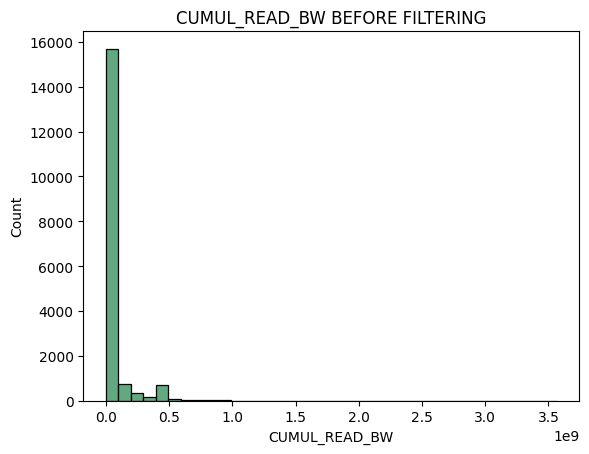

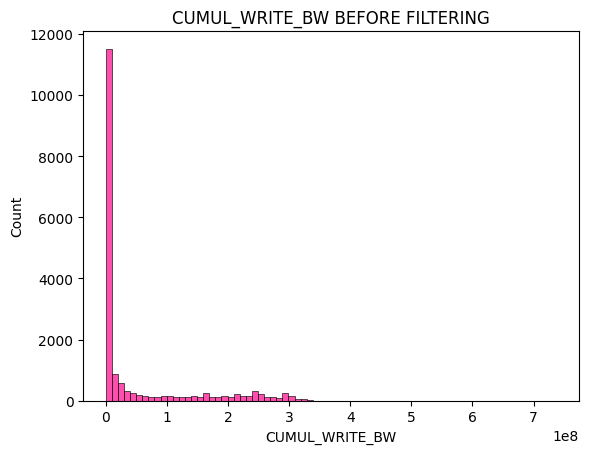

In [27]:
## Compute global bandwidth for READ and WRITE I/Os for every job and REMOVE bw outliers

non_zero_cumul_read = grp_traces[grp_traces["CUMUL_READ_BW"] != 0]["CUMUL_READ_BW"]

print("## READ ::")
print(f"The mean cumulative read bandwidth of jobs is : {non_zero_cumul_read.mean() / 1e6} MB/s")
print(f"The max cumulative read bandwidth of jobs is : {non_zero_cumul_read.max() / 1e6} MB/s")
print(f"The median of cumulative read bandwidth of jobs is : {non_zero_cumul_read.median() / 1e6} MB/s")
print(f"The std. deviation of cumulative read bandwidth of jobs is : {non_zero_cumul_read.std() / 1e6} MB/s")
print(f"The variance of cumulative read bandwidth of jobs is : {non_zero_cumul_read.var()}")
r_90percentile = non_zero_cumul_read.quantile(0.90)
print(f" - 90th percentile of cumulative read bandwidth of jobs is : {r_90percentile / 1e6} MB/s")
r_95percentile = non_zero_cumul_read.quantile(0.95)
print(f" - 95th percentile of cumulative read bandwidth of jobs is : {r_95percentile / 1e6} MB/s")
r_99percentile = non_zero_cumul_read.quantile(0.99)
print(f" - 99th percentile of cumulative read bandwidth of jobs is : {r_99percentile / 1e6} MB/s")
r_10percentile = non_zero_cumul_read.quantile(0.1)
print(f" - 10th percentile of cumulative read bandwidth of jobs is : {r_10percentile / 1e6} MB/s")
r_5percentile = non_zero_cumul_read.quantile(0.05)
print(f" - 5th percentile of cumulative read bandwidth of jobs is : {r_5percentile / 1e6} MB/s")
r_1percentile = non_zero_cumul_read.quantile(0.01)
print(f" - 1st percentile of cumulative read bandwidth of jobs is : {r_1percentile / 1e6} MB/s")


non_zero_cumul_write = grp_traces[grp_traces["CUMUL_WRITE_BW"] != 0]["CUMUL_WRITE_BW"]

print("\n## WRITE ::")
print(f"The mean cumulative write bandwidth of jobs is : {non_zero_cumul_write.mean() / 1e6} MB/s")
print(f"The max cumulative write bandwidth of jobs is : {non_zero_cumul_write.max() / 1e6} MB/s")
print(f"The median of cumulative write bandwidth of jobs is : {non_zero_cumul_write.median() / 1e6} MB/s")
print(f"The std. deviation of cumulative write bandwidth of jobs is : {non_zero_cumul_write.std() / 1e6} MB/s")
print(f"The variance of cumulative write bandwidth of jobs is : {non_zero_cumul_write.var()}")
w_90percentile = non_zero_cumul_write.quantile(0.90)
print(f" - 90th percentile of cumulative write bandwidth of jobs is : {w_90percentile / 1e6} MB/s")
w_95percentile = non_zero_cumul_write.quantile(0.95)
print(f" - 95th percentile of cumulative write bandwidth of jobs is : {w_95percentile / 1e6} MB/s")
w_99percentile = non_zero_cumul_write.quantile(0.99)
print(f" - 99th percentile of cumulative write bandwidth of jobs is : {w_99percentile / 1e6} MB/s")
w_10percentile = non_zero_cumul_write.quantile(0.1)
print(f" - 10th percentile of cumulative write bandwidth of jobs is : {w_10percentile / 1e6} MB/s")
w_5percentile = non_zero_cumul_write.quantile(0.05)
print(f" - 5th percentile of cumulative write bandwidth of jobs is : {w_5percentile / 1e6} MB/s")
w_1percentile = non_zero_cumul_write.quantile(0.01)
print(f" - 1st percentile of cumulative write bandwidth of jobs is : {w_1percentile / 1e6} MB/s")

binwidth = 100000000
g = sns.histplot(
    x=grp_traces['CUMUL_READ_BW'], 
    binwidth=binwidth, 
    color="seagreen",
)
g.set_title('CUMUL_READ_BW BEFORE FILTERING')
plt.show()

binwidth = 10000000
g = sns.histplot(
    x=grp_traces['CUMUL_WRITE_BW'], 
    binwidth=binwidth, 
    color="deeppink"
)
g.set_title('CUMUL_WRITE_BW BEFORE FILTERING')
plt.show()

# Filter on plain IO criteria:¶

First filter is only about volumes and duration:

- TOTAL IO TIME must be at least 1s
- TOTAL IO volume can't be over 1^13 Bytes (10000000000000 bytes -> 10 TB (still quite high))
- TOTAL IO volume is at least 1^8 Bytes (100000000.0 -> 100MB)

**FROM NOW ON, ANY STATISTIC IS ON A FILTERED DATASET, AND NOT REPRESENTATIVE OF ANYTHING....**

### I/O time and volume filters

In [28]:
# Some filters on the grouped traces, before altering columns
print("##### FILTERING DATASET !! #####")

total_jobs = grp_traces.shape[0]
print(f"## Total grouped-by jobs (before filtering) : >>> {total_jobs} <<<")
    
filter_threshold_max_bytes = 1e13
filter_threshold_min_bytes = 1e8
filter_threshold_s = 1

huge_jobs = grp_traces[grp_traces.TOTAL_BYTES_READ + grp_traces.TOTAL_BYTES_WRITTEN >= filter_threshold_max_bytes]
total_read_io_huge = huge_jobs["TOTAL_BYTES_READ"].sum()
total_write_io_huge = huge_jobs["TOTAL_BYTES_WRITTEN"].sum()

### Filter out job with a total cumulated IO time of less than 1s
grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_IO_TIME <= filter_threshold_s].index)
iotime_filter = total_jobs - grp_traces.shape[0]
print(f"  - {iotime_filter} jobs removed because their cumulated IO time is <= {filter_threshold_s} s")

### Remove jobs reading and writing too much (impossible to accurately reproduce in simulation)    
print("  - 'Huge' jobs")
print(f"     [In total, huge jobs are responsible for {total_read_io_huge / 1e9} read GB and {total_write_io_huge / 1e9} written GB]")
print(f"     [That a total volume of {(total_read_io_huge + total_write_io_huge) / 1e12} TB]")

# DROOOP huge jobs
grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_BYTES_READ + grp_traces.TOTAL_BYTES_WRITTEN >= filter_threshold_max_bytes].index)

max_bytes_filter = total_jobs - (grp_traces.shape[0] + iotime_filter)
print(f"  - {max_bytes_filter} jobs removed because their cumulated IO volume is >= {filter_threshold_max_bytes / 1e12} TB {(max_bytes_filter * 100) / total_jobs}%")

# If read OR write alone are below the threshold (but not the other), just 0 out read or write (bytes AND time)
grp_traces.loc[(grp_traces["TOTAL_BYTES_READ"] <= filter_threshold_min_bytes), "TOTAL_READ_TIME"] = 0
grp_traces.loc[(grp_traces["TOTAL_BYTES_READ"] <= filter_threshold_min_bytes), "TOTAL_BYTES_READ"] = 0
grp_traces.loc[(grp_traces["TOTAL_BYTES_WRITTEN"] <= filter_threshold_min_bytes), "TOTAL_WRITE_TIME"] = 0
grp_traces.loc[(grp_traces["TOTAL_BYTES_WRITTEN"] <= filter_threshold_min_bytes), "TOTAL_BYTES_WRITTEN"] = 0

### Remove jobs with a total cumulated IO volume <= to a given threshold (they are not interesting for the calibration)
grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_BYTES_READ + grp_traces.TOTAL_BYTES_WRITTEN <= filter_threshold_min_bytes].index)

min_bytes_filter = total_jobs - (grp_traces.shape[0] + iotime_filter + max_bytes_filter)
print(f"  - {min_bytes_filter} jobs removed because their cumulated IO volume is <= {filter_threshold_min_bytes / 1e6} MB")

total_filtered = min_bytes_filter + max_bytes_filter + iotime_filter
print(f"After filtering, a total of {total_filtered} were removed")
print(f"That's {total_filtered * 100 / total_jobs} % of the total number of jobs")
print(f"Current job count is {grp_traces.shape[0]}")

##### FILTERING DATASET !! #####
## Total grouped-by jobs (before filtering) : >>> 17883 <<<
  - 6120 jobs removed because their cumulated IO time is <= 1 s
  - 'Huge' jobs
     [In total, huge jobs are responsible for 1444290.919107061 read GB and 6843236.73886841 written GB]
     [That a total volume of 8287.527657975472 TB]
  - 199 jobs removed because their cumulated IO volume is >= 10.0 TB 1.1127886819884807%
  - 871 jobs removed because their cumulated IO volume is <= 100.0 MB
After filtering, a total of 7190 were removed
That's 40.205782027624004 % of the total number of jobs
Current job count is 10693


### MPI-IO Collectives filters

In [29]:
filter_threshold_max_coll_writes = 1e7
filter_threshold_max_coll_reads = 5e5
filter_threshold_max_coll_opens = 9e6

grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_MPIIO_COLL_WRITES >= filter_threshold_max_coll_writes].index)
grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_MPIIO_COLL_READS >= filter_threshold_max_coll_reads].index)
grp_traces = grp_traces.drop(grp_traces[grp_traces.TOTAL_MPIIO_COLL_OPENS >= filter_threshold_max_coll_opens].index)

print(f"After filtering on MPI-IO outlier behaviour, {grp_traces.shape[0]} jobs left")

After filtering on MPI-IO outlier behaviour, 10265 jobs left


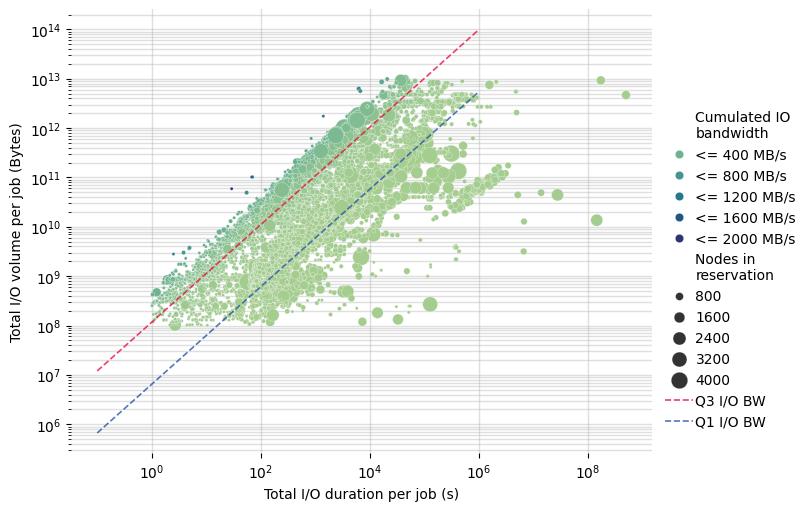

In [30]:
plotDataset(grp_traces, "3_basicIOFilter.pdf", "CUMUL_IO_BW_MB", "NODES_USED")

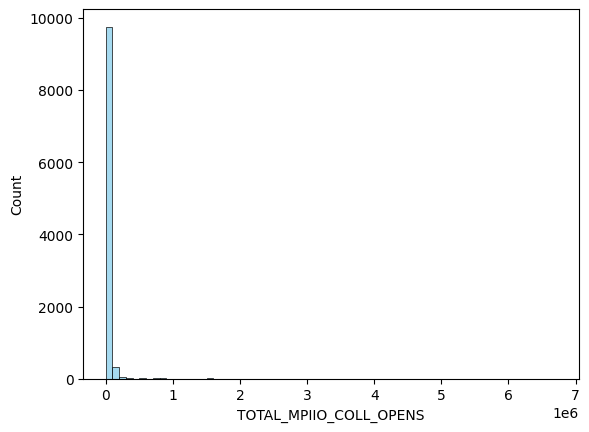

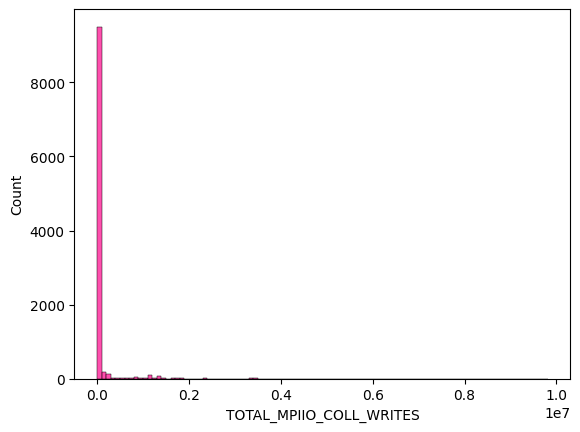

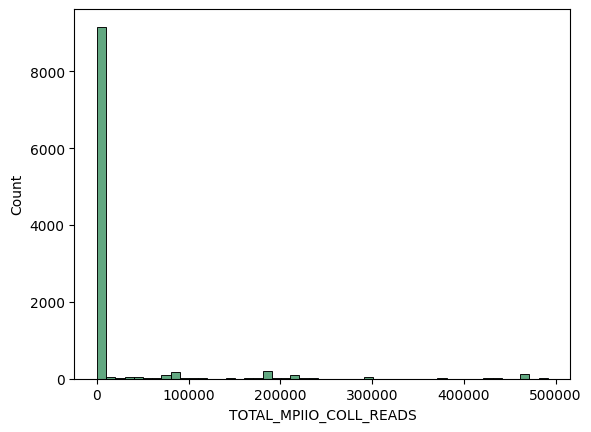

In [31]:
binwidth = 100000
g = sns.histplot(
    x=grp_traces['TOTAL_MPIIO_COLL_OPENS'], 
    binwidth=binwidth, 
    color="skyblue"
)

plt.show()

binwidth = 100000
g = sns.histplot(
    x=grp_traces['TOTAL_MPIIO_COLL_WRITES'], 
    binwidth=binwidth, 
    color="deeppink"
)

plt.show()

binwidth = 10000
g = sns.histplot(
    x=grp_traces['TOTAL_MPIIO_COLL_READS'], 
    binwidth=binwidth, 
    color="seagreen"
)

plt.show()

### Intermediate stats on R/W volume

In [32]:
# Some stats on sums in groupby dataset !!! NOTE THAT MULTIPLE FILTERS WERE ALREADY APPLIED HERE !!!

# Some stats on sums in groupby dataset 

print("# CUMULATED over all processes and all runs of every job:")

max_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].max()
max_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].max()
min_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].min()
min_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].min()

print(f"Max. sum of READ bytes: {max_sum_bytes_read / 1e12} TB")
highest_read_vol = grp_traces[grp_traces["TOTAL_BYTES_READ"] == grp_traces["TOTAL_BYTES_READ"].max()]
print(f"  - Corresponding job has a WRITTEN bytes sum of {highest_read_vol.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {highest_read_vol.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {highest_read_vol.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITTEN bytes : {max_sum_bytes_written / 1e12} TB")
highest_write_vol = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == grp_traces["TOTAL_BYTES_WRITTEN"].max()]
print(f"  - Corresponding job has a READ bytes sum of {highest_write_vol.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {highest_write_vol.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {highest_write_vol.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ bytes : {min_sum_bytes_read / 1e3} KB")
print(f"Min. sum of WRITTEN bytes : {min_sum_bytes_written / 1e3} KB")
print("---")

max_sum_read_time = grp_traces["TOTAL_READ_TIME"].max()
max_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].max()
min_sum_read_time = grp_traces["TOTAL_READ_TIME"].min()
min_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].min()
max_io_time = grp_traces["TOTAL_IO_TIME"].max()
min_io_time = grp_traces["TOTAL_IO_TIME"].min()

# Std. deviation
std_read_time = grp_traces["TOTAL_READ_TIME"].std()
std_write_time = grp_traces["TOTAL_WRITE_TIME"].std()
std_read_vol = grp_traces["TOTAL_BYTES_READ"].std()
std_write_vol = grp_traces["TOTAL_BYTES_WRITTEN"].std()
print(f"Read time standard deviation {std_read_time / 3600:.2f} hours")
print(f"Write time standard deviation {std_write_time / 3600:.2f} hours")
print(f"Read volumue standard deviation {std_read_vol / 1e12} TB")
print(f"Write volume standard deviation {std_write_vol / 1e12} TB")


print(f"Max. sum of READ time : {max_sum_read_time / 3600} hours")
longest_read_job = grp_traces[grp_traces["TOTAL_READ_TIME"] == grp_traces["TOTAL_READ_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_read_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ bytes sum of {longest_read_job.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE bytes sum of {longest_read_job.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {longest_read_job.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {longest_read_job.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITE time : {max_sum_write_time / 3600} hours")
longest_write_job = grp_traces[grp_traces["TOTAL_WRITE_TIME"] == grp_traces["TOTAL_WRITE_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_write_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_write_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ bytes sum of {longest_write_job.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE bytes sum of {longest_write_job.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a READ duration sum of {longest_write_job.iloc[0,:]['TOTAL_READ_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"  - Corresponding job has a WRITE duration sum of {longest_write_job.iloc[0,:]['TOTAL_WRITE_TIME'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ time : {min_sum_read_time} s")
print(f"Min. sum of WRITE time : {min_sum_write_time} s")
print(f"Max. sum of IO time : {max_io_time / 3600} hours")
print(f"Min. sum of IO time : {min_io_time} s")

# TOTAL OVER THE YEAR (VOLUME & IO TIME)

total_io_read_volume_bytes = grp_traces["TOTAL_BYTES_READ"].sum()
total_io_write_volume_bytes = grp_traces["TOTAL_BYTES_WRITTEN"].sum()

print(f"Over the entire dataset, {total_io_read_volume_bytes / 1e12} read TB and {total_io_write_volume_bytes / 1e12} written TB")
print(f"That's a total IO volume of {total_io_read_volume_bytes / 1e12 + total_io_write_volume_bytes / 1e12} TB")

# CUMULATED over all processes and all runs of every job:
Max. sum of READ bytes: 8.6212983192 TB
  - Corresponding job has a WRITTEN bytes sum of 0.049435696679 TB / ID : 626687
  - Corresponding job has a READ duration sum of 4.33 hours / ID : 626687
  - Corresponding job has a WRITE duration sum of 0.22 hours / ID : 626687
Max. sum of WRITTEN bytes : 9.895604832303 TB
  - Corresponding job has a READ bytes sum of 0.0 TB / ID : 633973
  - Corresponding job has a READ duration sum of 0.00 hours / ID : 633973
  - Corresponding job has a WRITE duration sum of 5.75 hours / ID : 633973
Min. sum of READ bytes : 0.0 KB
Min. sum of WRITTEN bytes : 0.0 KB
---
Read time standard deviation 104.41 hours
Write time standard deviation 1467.59 hours
Read volumue standard deviation 0.23677780294826029 TB
Write volume standard deviation 0.8226653068014433 TB
Max. sum of READ time : 10541.984454153888 hours
  - Corresponding job has a runtime of 0.49 hours / ID : 610895
  - Corresponding job has a REA

## I/O BW filters

###  Intermediate stats on R/W cumul. bw

## READ ::
The mean cumulative read bandwidth of jobs is : 81.1521564993105 MB/s
The max cumulative read bandwidth of jobs is : 3565.366667314904 MB/s
The median of cumulative read bandwidth of jobs is : 13.023432220503107 MB/s
The std. deviation of cumulative read bandwidth of jobs is : 192.66479048969927 MB/s
The variance of cumulative read bandwidth of jobs is : 3.711972149443971e+16
 - 90th percentile of cumulative read bandwidth of jobs is : 253.73187996274126 MB/s
 - 95th percentile of cumulative read bandwidth of jobs is : 443.1045458522855 MB/s
 - 99th percentile of cumulative read bandwidth of jobs is : 748.0639597085052 MB/s
 - 10th percentile of cumulative read bandwidth of jobs is : 2.4216847550255576 MB/s
 - 5th percentile of cumulative read bandwidth of jobs is : 1.1213147477391683 MB/s
 - 1st percentile of cumulative read bandwidth of jobs is : 0.06120793306713152 MB/s

## WRITE ::
The mean cumulative write bandwidth of jobs is : 76.4004474696363 MB/s
The max cumulative 

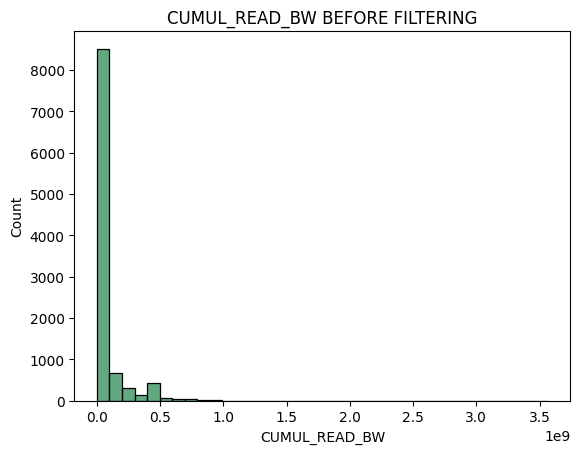

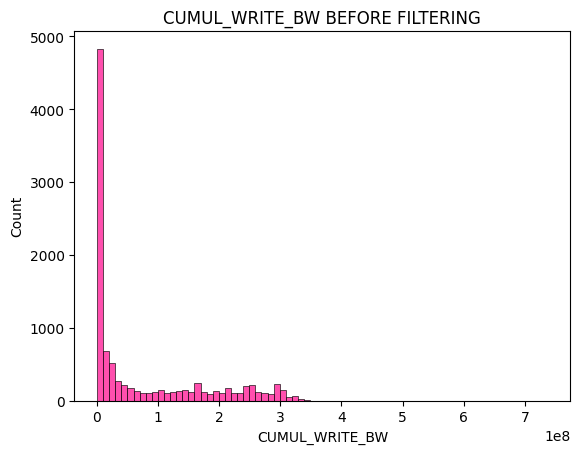

In [33]:
## Compute global bandwidth for READ and WRITE I/Os for every job and REMOVE bw outliers

non_zero_cumul_read = grp_traces[grp_traces["CUMUL_READ_BW"] != 0]["CUMUL_READ_BW"]

print("## READ ::")
print(f"The mean cumulative read bandwidth of jobs is : {non_zero_cumul_read.mean() / 1e6} MB/s")
print(f"The max cumulative read bandwidth of jobs is : {non_zero_cumul_read.max() / 1e6} MB/s")
print(f"The median of cumulative read bandwidth of jobs is : {non_zero_cumul_read.median() / 1e6} MB/s")
print(f"The std. deviation of cumulative read bandwidth of jobs is : {non_zero_cumul_read.std() / 1e6} MB/s")
print(f"The variance of cumulative read bandwidth of jobs is : {non_zero_cumul_read.var()}")
r_90percentile = non_zero_cumul_read.quantile(0.90)
print(f" - 90th percentile of cumulative read bandwidth of jobs is : {r_90percentile / 1e6} MB/s")
r_95percentile = non_zero_cumul_read.quantile(0.95)
print(f" - 95th percentile of cumulative read bandwidth of jobs is : {r_95percentile / 1e6} MB/s")
r_99percentile = non_zero_cumul_read.quantile(0.99)
print(f" - 99th percentile of cumulative read bandwidth of jobs is : {r_99percentile / 1e6} MB/s")
r_10percentile = non_zero_cumul_read.quantile(0.1)
print(f" - 10th percentile of cumulative read bandwidth of jobs is : {r_10percentile / 1e6} MB/s")
r_5percentile = non_zero_cumul_read.quantile(0.05)
print(f" - 5th percentile of cumulative read bandwidth of jobs is : {r_5percentile / 1e6} MB/s")
r_1percentile = non_zero_cumul_read.quantile(0.01)
print(f" - 1st percentile of cumulative read bandwidth of jobs is : {r_1percentile / 1e6} MB/s")


non_zero_cumul_write = grp_traces[grp_traces["CUMUL_WRITE_BW"] != 0]["CUMUL_WRITE_BW"]

print("\n## WRITE ::")
print(f"The mean cumulative write bandwidth of jobs is : {non_zero_cumul_write.mean() / 1e6} MB/s")
print(f"The max cumulative write bandwidth of jobs is : {non_zero_cumul_write.max() / 1e6} MB/s")
print(f"The median of cumulative write bandwidth of jobs is : {non_zero_cumul_write.median() / 1e6} MB/s")
print(f"The std. deviation of cumulative write bandwidth of jobs is : {non_zero_cumul_write.std() / 1e6} MB/s")
print(f"The variance of cumulative write bandwidth of jobs is : {non_zero_cumul_write.var()}")
w_90percentile = non_zero_cumul_write.quantile(0.90)
print(f" - 90th percentile of cumulative write bandwidth of jobs is : {w_90percentile / 1e6} MB/s")
w_95percentile = non_zero_cumul_write.quantile(0.95)
print(f" - 95th percentile of cumulative write bandwidth of jobs is : {w_95percentile / 1e6} MB/s")
w_99percentile = non_zero_cumul_write.quantile(0.99)
print(f" - 99th percentile of cumulative write bandwidth of jobs is : {w_99percentile / 1e6} MB/s")
w_10percentile = non_zero_cumul_write.quantile(0.1)
print(f" - 10th percentile of cumulative write bandwidth of jobs is : {w_10percentile / 1e6} MB/s")
w_5percentile = non_zero_cumul_write.quantile(0.05)
print(f" - 5th percentile of cumulative write bandwidth of jobs is : {w_5percentile / 1e6} MB/s")
w_1percentile = non_zero_cumul_write.quantile(0.01)
print(f" - 1st percentile of cumulative write bandwidth of jobs is : {w_1percentile / 1e6} MB/s")

binwidth = 100000000
g = sns.histplot(
    x=grp_traces['CUMUL_READ_BW'], 
    binwidth=binwidth, 
    color="seagreen",
)
g.set_title('CUMUL_READ_BW BEFORE FILTERING')
plt.show()

binwidth = 10000000
g = sns.histplot(
    x=grp_traces['CUMUL_WRITE_BW'], 
    binwidth=binwidth, 
    color="deeppink"
)
g.set_title('CUMUL_WRITE_BW BEFORE FILTERING')
plt.show()

### Filtering on cumulated BW

In [34]:
# Drop jobs with a read or write bandwidth above the 95th percentile bw (removing bw outliers)

print(f"{total_jobs} jobs before any filtering") 

before_bw_filter = grp_traces.shape[0]
grp_traces = grp_traces.drop(grp_traces[grp_traces.CUMUL_READ_BW >= r_95percentile].index)
grp_traces = grp_traces.drop(grp_traces[grp_traces.CUMUL_WRITE_BW >= w_95percentile].index)
after_bw_filter = grp_traces.shape[0]

high_bw_filter = before_bw_filter - after_bw_filter
print(f"{high_bw_filter} outliers jobs were droped due to bw filtering (bw too high)")

# Drop jobs with a read or write bandwidth above the 10th percentile bw (computed in previous cell) (removing bw outliers)
before_bw_filter = grp_traces.shape[0]
grp_traces = grp_traces.drop(grp_traces[(grp_traces.CUMUL_READ_BW <= r_5percentile) & (grp_traces.CUMUL_READ_BW != 0)].index)
grp_traces = grp_traces.drop(grp_traces[(grp_traces.CUMUL_WRITE_BW <= w_5percentile) & (grp_traces.CUMUL_WRITE_BW != 0)].index)
after_bw_filter = grp_traces.shape[0]
low_bw_filter = before_bw_filter - after_bw_filter

print(f"{low_bw_filter} outliers jobs were droped due to bw filtering (bw too low)")
print(f"We are now left with {after_bw_filter} jobs")
percentage_bw_filtered = ((low_bw_filter + high_bw_filter) * 100) / total_jobs
print(f"{percentage_bw_filtered:.2f}% of all jobs filtered due to the low/high bw filters")

17883 jobs before any filtering
930 outliers jobs were droped due to bw filtering (bw too high)
834 outliers jobs were droped due to bw filtering (bw too low)
We are now left with 8501 jobs
9.86% of all jobs filtered due to the low/high bw filters


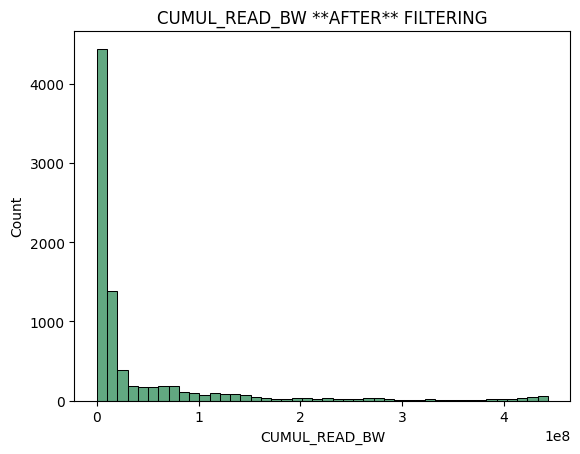

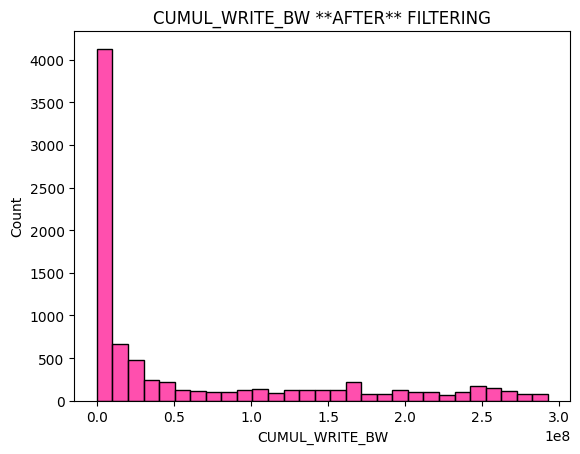

In [35]:
binwidth = 10000000
g = sns.histplot(
    x=grp_traces['CUMUL_READ_BW'], 
    binwidth=binwidth, 
    color="seagreen",
)
g.set_title('CUMUL_READ_BW **AFTER** FILTERING')
plt.show()

binwidth = 10000000
g = sns.histplot(
    x=grp_traces['CUMUL_WRITE_BW'], 
    binwidth=binwidth, 
    color="deeppink"
)
g.set_title('CUMUL_WRITE_BW **AFTER** FILTERING')
plt.show()

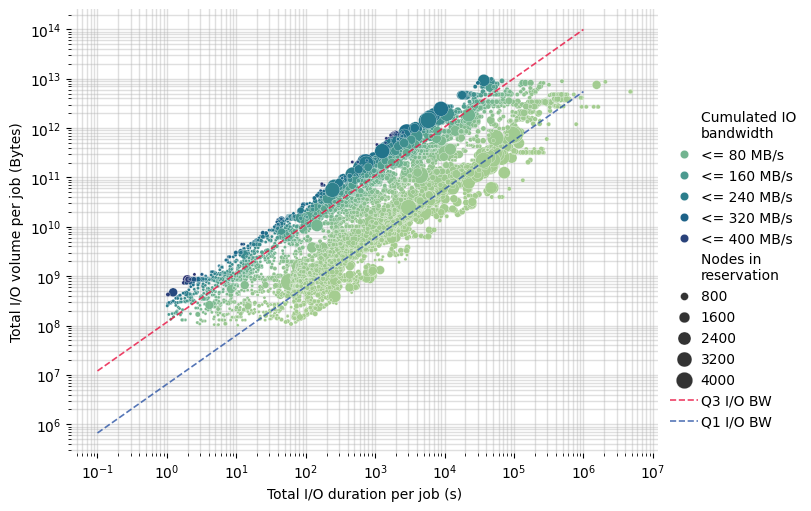

In [36]:
plotDataset(grp_traces, "4_bandwidthFilter.pdf", "CUMUL_IO_BW_MB", "NODES_USED")

### Intermediate stats on R/W cumul. bw per node

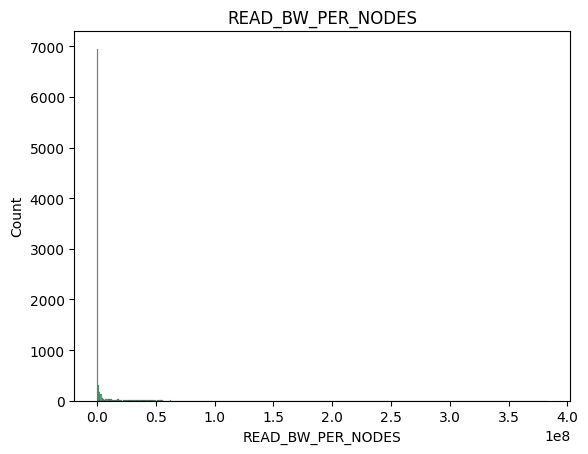

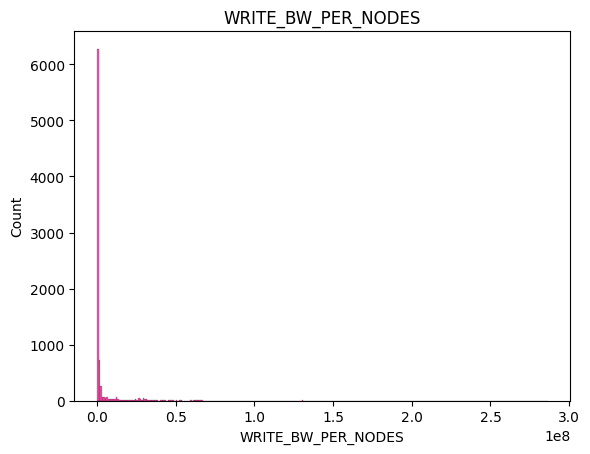

In [37]:
# MEAN BW PER NODE (ASSUMING ALL NODES ARE USED DURING READ/WRITE OPERATIONS (WHICH IS NOT THE CASE MOST OF THE TIME
# BUT THIS VALUE GIVES US AN ESTIMATE OF HOW WELL THE RESSOURCES WERE USED WHEN IT COMES TO IO)

binwidth = 1000000
g = sns.histplot(
    x=grp_traces['READ_BW_PER_NODES'], 
    binwidth=binwidth, 
    color="seagreen"
)
g.set_title('READ_BW_PER_NODES')
plt.show()

binwidth = 1000000
e = sns.histplot(
    x=grp_traces['WRITE_BW_PER_NODES'], 
    binwidth=binwidth,
    color="deeppink"
)
e.set_title('WRITE_BW_PER_NODES')
plt.show()

In [38]:
non_zero_read_bw_node = grp_traces[grp_traces["READ_BW_PER_NODES"] != 0]["READ_BW_PER_NODES"]

print(f"The mean read bandwidth per node of jobs is : {non_zero_read_bw_node.mean() / 1e6} MB/s")
print(f"The median of read bandwidth per node of jobs is : {non_zero_read_bw_node.median() / 1e6} MB/s")
print(f"The std. deviation of read bandwidth per node of jobs is : {non_zero_read_bw_node.std() / 1e6} MB/s")
print(f"The variance of read bandwidth per node of jobs is : {non_zero_read_bw_node.var()}")
rn_90percentile = non_zero_read_bw_node.quantile(0.90)
print(f" - 90th percentile of read bandwidth per node  of jobs is : {rn_90percentile / 1e6} MB/s")
rn_95percentile = non_zero_read_bw_node.quantile(0.95)
print(f" - 95th percentile of read bandwidth per node of jobs is : {rn_95percentile / 1e6} MB/s")
rn_99percentile = non_zero_read_bw_node.quantile(0.99)
print(f" - 99th percentile of read bandwidth per node of jobs is : {rn_99percentile / 1e6} MB/s")
rn_10percentile = non_zero_read_bw_node.quantile(0.1)
print(f" - 10th percentile of read bandwidth per node of jobs is : {rn_10percentile / 1e6} MB/s")
rn_5percentile = non_zero_read_bw_node.quantile(0.05)
print(f" - 5th percentile of read bandwidth per node of jobs is : {rn_5percentile / 1e6} MB/s")
rn_1percentile = non_zero_read_bw_node.quantile(0.01)
print(f" - 1st percentile of read bandwidth per node of jobs is : {rn_1percentile / 1e6} MB/s")


non_zero_write_bw_node = grp_traces[grp_traces["WRITE_BW_PER_NODES"] != 0]["WRITE_BW_PER_NODES"]

print(f"The mean write bandwidth per node of jobs is : {non_zero_write_bw_node.mean() / 1e6} MB/s")
print(f"The median of write bandwidth per node of jobs is : {non_zero_write_bw_node.median() / 1e6} MB/s")
print(f"The std. deviation of write bandwidth per node of jobs is : {non_zero_write_bw_node.std() / 1e6} MB/s")
print(f"The variance of write bandwidth per node of jobs is : {non_zero_write_bw_node.var()}")
wn_90percentile = non_zero_write_bw_node.quantile(0.90)
print(f" - 90th percentile of write bandwidth per node of jobs is : {wn_90percentile / 1e6} MB/s")
wn_95percentile = non_zero_write_bw_node.quantile(0.95)
print(f" - 95th percentile of write bandwidth per node of jobs is : {wn_95percentile / 1e6} MB/s")
wn_99percentile = non_zero_write_bw_node.quantile(0.99)
print(f" - 99th percentile of write bandwidth per node of jobs is : {wn_99percentile / 1e6} MB/s")
wn_10percentile = non_zero_write_bw_node.quantile(0.1)
print(f" - 10th percentile of write bandwidth per node of jobs is : {wn_10percentile / 1e6} MB/s")
wn_5percentile = non_zero_write_bw_node.quantile(0.05)
print(f" - 5th percentile of write bandwidth per node of jobs is : {wn_5percentile / 1e6} MB/s")
wn_1percentile = non_zero_write_bw_node.quantile(0.01)
print(f" - 1st percentile of write bandwidth per node of jobs is : {wn_1percentile / 1e6} MB/s")

The mean read bandwidth per node of jobs is : 5.015923710617262 MB/s
The median of read bandwidth per node of jobs is : 0.090515589848925 MB/s
The std. deviation of read bandwidth per node of jobs is : 21.538622389848335 MB/s
The variance of read bandwidth per node of jobs is : 463912254452476.06
 - 90th percentile of read bandwidth per node  of jobs is : 10.158053750569591 MB/s
 - 95th percentile of read bandwidth per node of jobs is : 30.974417235841134 MB/s
 - 99th percentile of read bandwidth per node of jobs is : 74.27300986149673 MB/s
 - 10th percentile of read bandwidth per node of jobs is : 0.01714100299771821 MB/s
 - 5th percentile of read bandwidth per node of jobs is : 0.00978038592643952 MB/s
 - 1st percentile of read bandwidth per node of jobs is : 0.0022123390452974574 MB/s
The mean write bandwidth per node of jobs is : 6.105777342199867 MB/s
The median of write bandwidth per node of jobs is : 0.15340380859006159 MB/s
The std. deviation of write bandwidth per node of jobs

### Filtering on cumul. bw per node

In [39]:
# Drop jobs with a read or write bandwidth per node above the 95th percentile bw (removing bw outliers)
before_bw_filter = grp_traces.shape[0]
grp_traces = grp_traces.drop(grp_traces[grp_traces.READ_BW_PER_NODES >= rn_95percentile].index)
grp_traces = grp_traces.drop(grp_traces[grp_traces.WRITE_BW_PER_NODES >= wn_95percentile].index)
after_bw_filter = grp_traces.shape[0]

print(f"{before_bw_filter - after_bw_filter} outliers jobs were droped due to node bw filtering (bw too high)")

# Drop jobs with a read or write bandwidth above 1MB percentile bw (removing bw outliers)
before_bw_filter = grp_traces.shape[0]
grp_traces = grp_traces.drop(grp_traces[(grp_traces.READ_BW_PER_NODES <= rn_5percentile) & (grp_traces.READ_BW_PER_NODES != 0)].index)
grp_traces = grp_traces.drop(grp_traces[(grp_traces.WRITE_BW_PER_NODES <= wn_5percentile) & (grp_traces.WRITE_BW_PER_NODES != 0)].index)
after_bw_filter = grp_traces.shape[0]

print(f"{before_bw_filter - after_bw_filter} outliers jobs were droped due to node bw filtering (bw too low)")
print(f"We are now left with {after_bw_filter} jobs")

697 outliers jobs were droped due to node bw filtering (bw too high)
692 outliers jobs were droped due to node bw filtering (bw too low)
We are now left with 7112 jobs


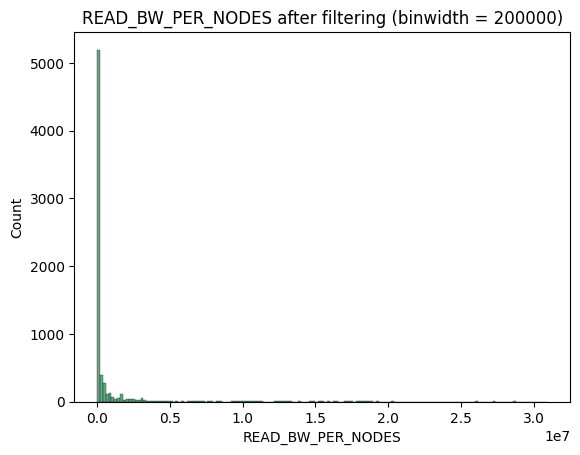

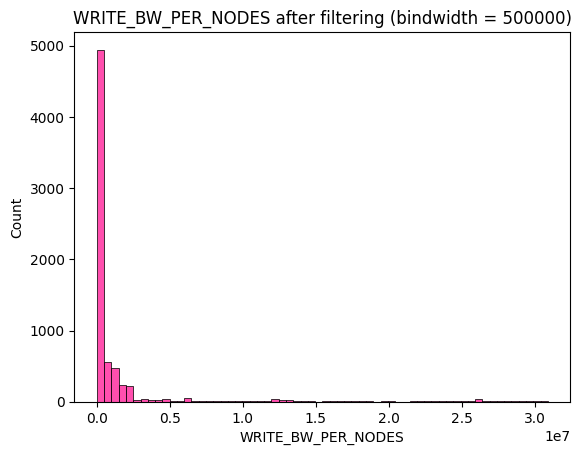

In [40]:
grp_traces["READ_BW_PER_NODES"] =  grp_traces["CUMUL_READ_BW"] / grp_traces["NODES_USED"]
grp_traces["WRITE_BW_PER_NODES"] =  grp_traces["CUMUL_WRITE_BW"] / grp_traces["NODES_USED"]

binwidth = 200000
g = sns.histplot(
    x=grp_traces['READ_BW_PER_NODES'], 
    binwidth=binwidth, 
    color="seagreen"
)
g.set_title(f'READ_BW_PER_NODES after filtering (binwidth = {binwidth})')
plt.show()

binwidth = 500000
e = sns.histplot(
    x=grp_traces['WRITE_BW_PER_NODES'], 
    binwidth=binwidth, 
    color="deeppink"
)
e.set_title(f'WRITE_BW_PER_NODES after filtering (bindwidth = {binwidth})')
plt.show()

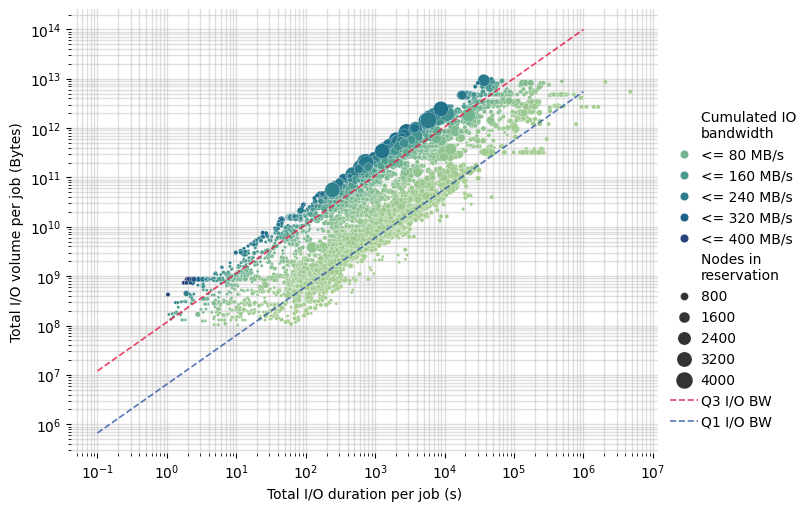

In [41]:
plotDataset(grp_traces, "5_bandwidthPerNodeFilter.pdf", "CUMUL_IO_BW_MB", "NODES_USED")

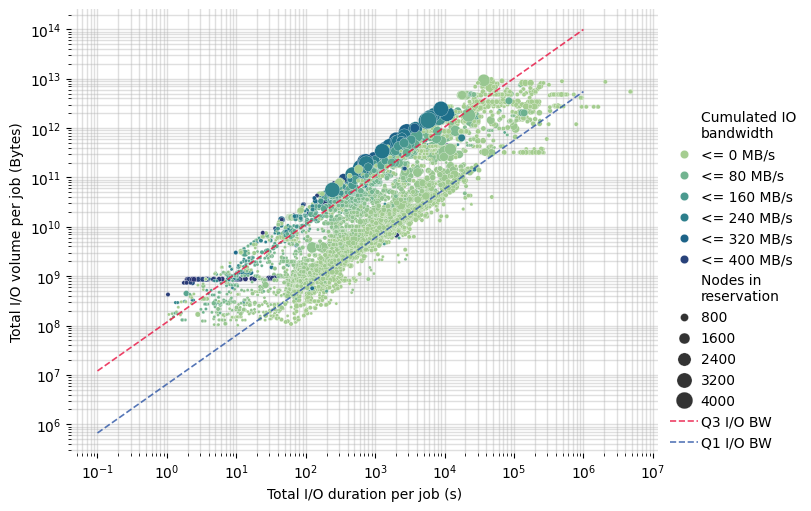

In [42]:
plotDataset(grp_traces, "5a_bandwidthPerNodeFilter_READ.png", "CUMUL_READ_BW_MB", "NODES_USED")

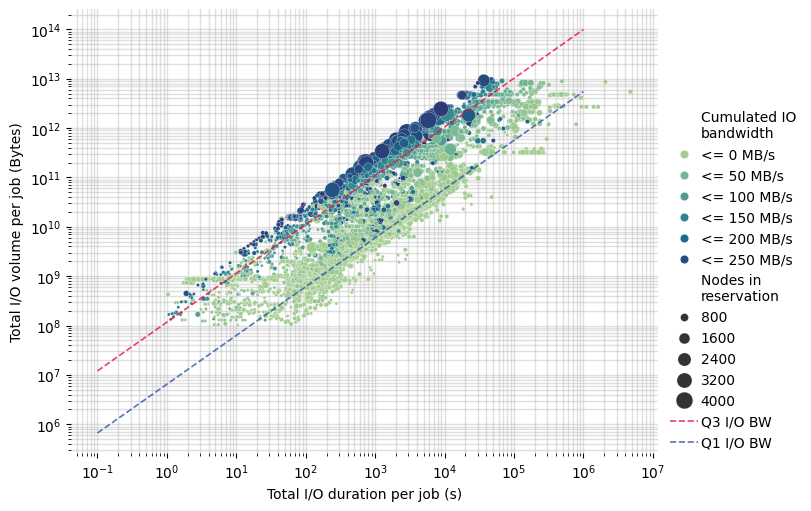

In [43]:
plotDataset(grp_traces, "5b_bandwidthPerNodeFilter_WRITE.png", "CUMUL_WRITE_BW_MB", "NODES_USED")

## K-means2 clustering (no filter)

Not really used at this time, but might be needed to isolate jobs from month of May and June 2022, which so far display a behaviour very difficult to simulate.
K-means can capture theses jobs inside a cluster quite easily (provided enough clusters are possible, for instance at least 6-8), but not in all cases. Be careful when running this cell, that k-means initialization point do not prevent good clustering.

In [44]:
grp_traces.columns

Index(['COBALT_JOBID', 'RUN_DATE_ID', 'START_TIME', 'END_TIME', 'NPROCS',
       'RUN_TIME', 'TOTAL_POSIX_OPENS', 'TOTAL_STDIO_OPENS',
       'TOTAL_MPIIO_INDEP_OPENS', 'TOTAL_MPIIO_COLL_OPENS',
       'TOTAL_POSIX_READS', 'TOTAL_POSIX_WRITES', 'TOTAL_STDIO_READS',
       'TOTAL_STDIO_WRITES', 'TOTAL_MPIIO_INDEP_READS',
       'TOTAL_MPIIO_INDEP_WRITES', 'TOTAL_MPIIO_COLL_READS',
       'TOTAL_MPIIO_COLL_WRITES', 'QUEUED_TIMESTAMP', 'START_TIMESTAMP',
       'END_TIMESTAMP', 'QUEUED_DATE_ID', 'START_DATE_ID', 'END_DATE_ID',
       'WALLTIME_SECONDS', 'RUNTIME_SECONDS', 'NODES_USED', 'NODES_REQUESTED',
       'CORES_USED', 'CORES_REQUESTED', 'QUEUED_WAIT_SECONDS',
       'REQUESTED_CORE_HOURS', 'USED_CORE_HOURS', 'TOTAL_BYTES_READ',
       'TOTAL_BYTES_WRITTEN', 'TOTAL_IO_VOLUME', 'TOTAL_READ_TIME',
       'TOTAL_WRITE_TIME', 'TOTAL_META_TIME', 'TOTAL_IO_TIME_wMETA',
       'TOTAL_IO_TIME', 'CUMUL_READ_BW', 'CUMUL_READ_BW_MB', 'CUMUL_WRITE_BW',
       'CUMUL_WRITE_BW_MB', 'CUMUL_IO_BW',

- Major cluster is label 0
- Jobs in other labels (sum) : 829
 - counts: [6283  165  243   58   44  153   42  124]


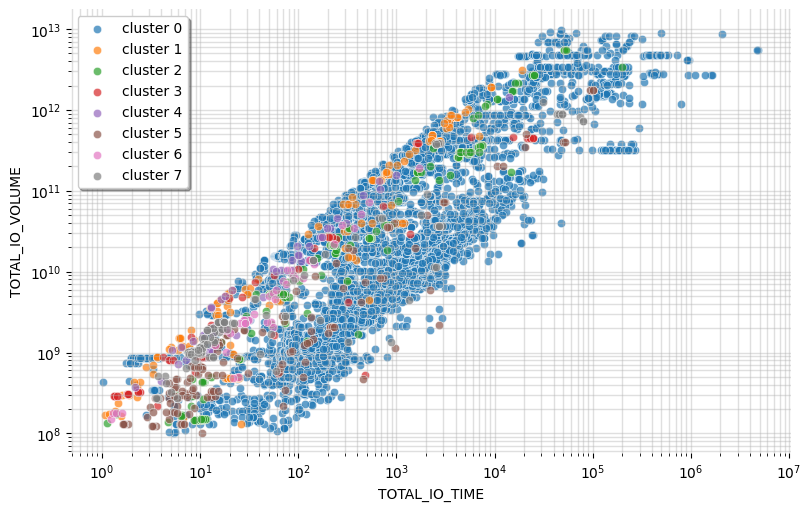

In [45]:
### CLUSTERING
## WARNING : this clustering is not really valid if the dataset has been truncated before in the notebook

nb_cluster = 8

fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')
ax.minorticks_on()
ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
ax.set_frame_on(False)
    

# features = grp_traces[["TOTAL_IO_TIME", "TOTAL_IO_VOLUME"]].to_numpy()

features = grp_traces[["TOTAL_MPIIO_COLL_OPENS", "TOTAL_MPIIO_COLL_WRITES", "TOTAL_MPIIO_COLL_READS", "RUNTIME_SECONDS", "TOTAL_META_TIME",  "NODES_USED", "READ_BW_PER_NODES", "WRITE_BW_PER_NODES",]].to_numpy()

centroid, labels = kmeans2(features, nb_cluster, minit='++')

grp_traces["cluster_label"] = labels

w = []
for i in range(nb_cluster):
    wi = features[labels == i]
    w.append(features[labels == i])
    #ax.plot(wi[:, 0], wi[:, 1], 'o', alpha=0.5, label=f'cluster {i}')

    g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                        alpha=0.7,
                        data=grp_traces[grp_traces["cluster_label"] == i],
                        #palette=sns.color_palette("crest", as_cmap=True),
                        ax=ax,
                       label=f'cluster {i}')
    g.set(xscale='log', yscale='log')


#ax.plot(centroid[:, 5], centroid[:, 6], 'k*', label='centroids')
ax.set_yscale("log")
ax.set_xscale("log")
#plt.axis('equal')
ax.legend(shadow=True)

unique, counts = np.unique(np.array(labels), return_counts=True)

major_label = -1
major_label_count = 0
all_labels_count = 0
for label, count in dict(zip(unique, counts)).items():
    if count > major_label_count:
        major_label_count = count
        major_label = label
    all_labels_count += count

other_labels = all_labels_count - major_label_count
        
print(f"- Major cluster is label {major_label}")
print(f"- Jobs in other labels (sum) : {other_labels}")
print(f" - counts: {counts}")

plt.savefig("clustering_kmeans2.pdf", dpi=300)
plt.show()

In [46]:
list(grp_traces[grp_traces["cluster_label"] == 3]["COBALT_JOBID"])

[572203,
 572910,
 573091,
 573171,
 574151,
 578372,
 579608,
 579619,
 583597,
 583609,
 590041,
 598263,
 598264,
 598272,
 598282,
 598488,
 598489,
 598490,
 598491,
 601042,
 602737,
 603076,
 603079,
 603080,
 603083,
 603091,
 603198,
 603200,
 603203,
 603220,
 603566,
 605499,
 607315,
 610791,
 610792,
 610793,
 611412,
 616859,
 618904,
 618974,
 618986,
 619559,
 620259,
 622523,
 622655,
 623102,
 623104,
 623355,
 629759,
 632123,
 633138,
 637425,
 637426,
 637440,
 637441,
 637456,
 637457,
 639268]

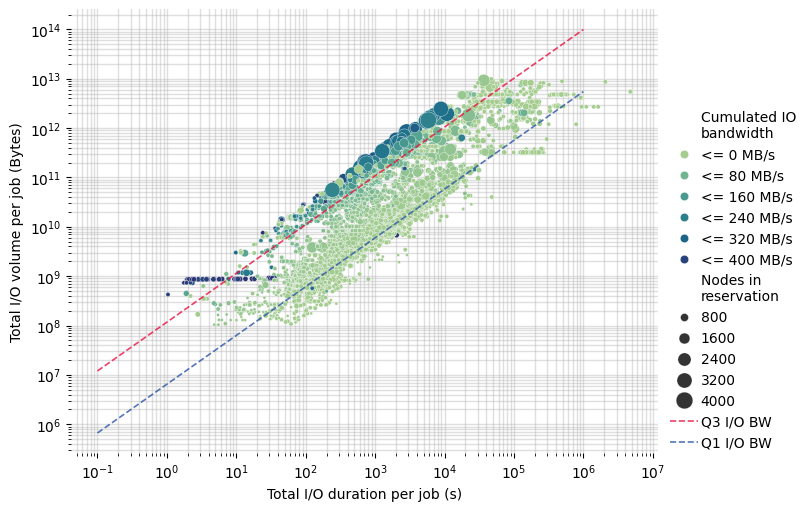

In [47]:
plotDataset(grp_traces[grp_traces["cluster_label"] == major_label], "6a_bandwidthPerNodeFilter_majorClusterOnly_READ.png", "CUMUL_READ_BW_MB", "NODES_USED")

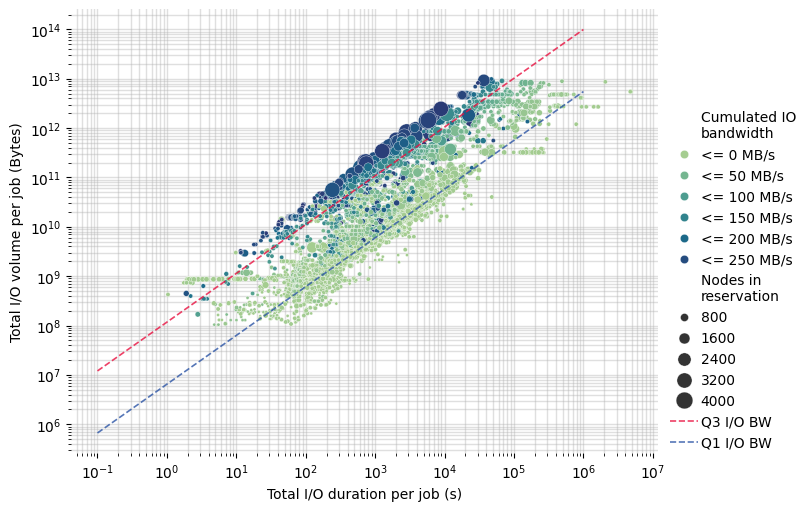

In [48]:
plotDataset(grp_traces[grp_traces["cluster_label"] == major_label], "6a_bandwidthPerNodeFilter_majorClusterOnly_WRITE.png", "CUMUL_WRITE_BW_MB", "NODES_USED")

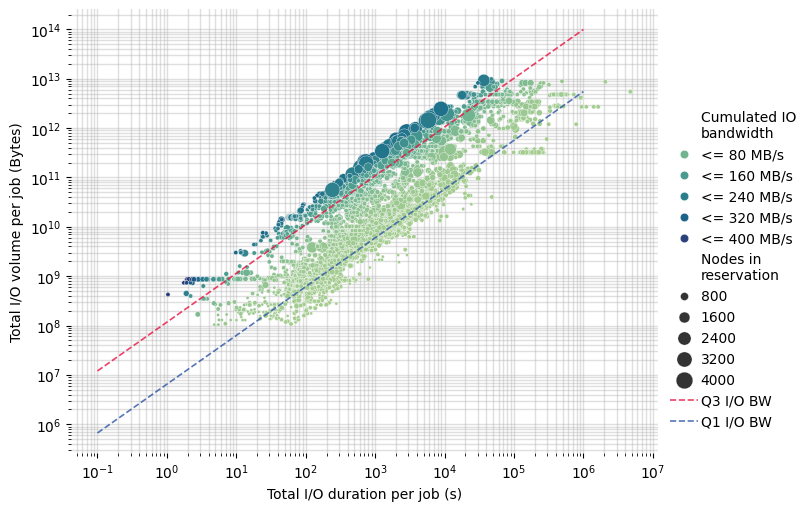

In [49]:
plotDataset(grp_traces[grp_traces["cluster_label"] == major_label], "6_bandwidthPerNodeFilter_majorClusterOnly.png", "CUMUL_IO_BW_MB", "NODES_USED")

## Final stats on filtered dataset before export

In [50]:
# Some stats on sums in groupby dataset !!! NOTE THAT MULTIPLE FILTERS WERE ALREADY APPLIED HERE !!!

print("# CUMULATED over all processes and all runs of every job:")

max_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].max()
max_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].max()
min_sum_bytes_read = grp_traces["TOTAL_BYTES_READ"].min()
min_sum_bytes_written = grp_traces["TOTAL_BYTES_WRITTEN"].min()

printmd("---")
print(f"Max. sum of READ bytes: {max_sum_bytes_read / 1e12} TB")
highest_read_vol = grp_traces[grp_traces["TOTAL_BYTES_READ"] == grp_traces["TOTAL_BYTES_READ"].max()]
print(f"  - Corresponding job has a WRITTEN bytes sum of {highest_read_vol.iloc[0,:]['TOTAL_BYTES_WRITTEN'] / 1e12} TB / ID : {highest_read_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITTEN bytes : {max_sum_bytes_written / 1e12} TB")
highest_write_vol = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == grp_traces["TOTAL_BYTES_WRITTEN"].max()]
print(f"  - Corresponding job has a WRITTEN bytes sum of {highest_write_vol.iloc[0,:]['TOTAL_BYTES_READ'] / 1e12} TB / ID : {highest_write_vol.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ bytes : {min_sum_bytes_read / 1e3} KB")
print(f"Min. sum of WRITTEN bytes : {min_sum_bytes_written / 1e3} KB")
printmd("---")

max_sum_read_time = grp_traces["TOTAL_READ_TIME"].max()
max_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].max()
min_sum_read_time = grp_traces["TOTAL_READ_TIME"].min()
min_sum_write_time = grp_traces["TOTAL_WRITE_TIME"].min()
max_io_time = grp_traces["TOTAL_IO_TIME"].max()
min_io_time = grp_traces["TOTAL_IO_TIME"].min()

print(f"Max. sum of READ time : {max_sum_read_time / 3600} hours")
longest_read_job = grp_traces[grp_traces["TOTAL_READ_TIME"] == grp_traces["TOTAL_READ_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_read_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_read_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Max. sum of WRITE time : {max_sum_write_time / 3600} hours")
longest_write_job = grp_traces[grp_traces["TOTAL_WRITE_TIME"] == grp_traces["TOTAL_WRITE_TIME"].max()]
print(f"  - Corresponding job has a runtime of {longest_write_job.iloc[0,:]['RUNTIME_SECONDS'] / 3600:.2f} hours / ID : {longest_write_job.iloc[0,:]['COBALT_JOBID']}")
print(f"Min. sum of READ time : {min_sum_read_time} s")
print(f"Min. sum of WRITE time : {min_sum_write_time} s")
print(f"Max. sum of IO time : {max_io_time / 3600} hours")
print(f"Min. sum of IO time : {min_io_time} s")
printmd("---")

# TOTAL OVER THE YEAR (VOLUME & IO TIME)

total_io_read_volume_bytes = grp_traces["TOTAL_BYTES_READ"].sum()
total_io_write_volume_bytes = grp_traces["TOTAL_BYTES_WRITTEN"].sum()

not_reading = grp_traces[grp_traces["TOTAL_BYTES_READ"] == 0].shape[0]
not_writing = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == 0].shape[0]
print(f"{not_reading} jobs are not doing any reads")
print(f"{not_writing} jobs are not doing any writes")

# Details for jobs not doing writes
no_writes_min_read = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == 0]["TOTAL_BYTES_READ"].min()
no_writes_max_read = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == 0]["TOTAL_BYTES_READ"].max()
no_writes_mean_read = grp_traces[grp_traces["TOTAL_BYTES_WRITTEN"] == 0]["TOTAL_BYTES_READ"].median()
print(f"   - For jobs not doing any writes, the min read volume is {no_writes_min_read}B, the max is {no_writes_max_read}B and the mean is {no_writes_mean_read}B")


no_io = grp_traces[(grp_traces["TOTAL_BYTES_READ"] == 0) & (grp_traces["TOTAL_BYTES_WRITTEN"] == 0)].shape[0]
print(f"{no_io} jobs are not doing any I/O (SHOULD ALWAYS BE 0)")

printmd("---")

max_posix_opens = reduced_traces["TOTAL_POSIX_OPENS"].max()
min_posix_opens = reduced_traces["TOTAL_POSIX_OPENS"].min()
mean_posix_opens = reduced_traces["TOTAL_POSIX_OPENS"].mean()
median_posix_opens = reduced_traces["TOTAL_POSIX_OPENS"].median()
print(f"Min. posix opens (all jobs, not agg. by reservation) : {min_posix_opens}")
print(f"Max. posix opens (all jobs, not agg. by reservation) : {max_posix_opens}")
print(f"Mean. posix opens (all jobs, not agg. by reservation) : {mean_posix_opens}")
print(f"Median. posix opens (all jobs, not agg. by reservation) : {median_posix_opens}")
printmd("---")

printmd(f"Over the entire dataset, **{total_io_read_volume_bytes / 1e12:.2f} read TB** and **{total_io_write_volume_bytes / 1e12:.2f} written TB**")
printmd(f"That's a total IO volume of **{total_io_read_volume_bytes / 1e12 + total_io_write_volume_bytes / 1e12:.2f} TB**")
printmd(f"The final number of jobs is **{grp_traces.shape[0]}**") 

# CUMULATED over all processes and all runs of every job:


---

Max. sum of READ bytes: 7.094135565743 TB
  - Corresponding job has a WRITTEN bytes sum of 0.34266108672 TB / ID : 617461
Max. sum of WRITTEN bytes : 9.895604832102 TB
  - Corresponding job has a WRITTEN bytes sum of 0.0 TB / ID : 626892
Min. sum of READ bytes : 0.0 KB
Min. sum of WRITTEN bytes : 0.0 KB


---

Max. sum of READ time : 55.62929178277778 hours
  - Corresponding job has a runtime of 0.45 hours / ID : 601769
Max. sum of WRITE time : 1346.3924669925 hours
  - Corresponding job has a runtime of 3.02 hours / ID : 636826
Min. sum of READ time : 0.0 s
Min. sum of WRITE time : 0.0 s
Max. sum of IO time : 1346.3924669925 hours
Min. sum of IO time : 1.036218 s


---

1214 jobs are not doing any reads
2381 jobs are not doing any writes
   - For jobs not doing any writes, the min read volume is 101065308B, the max is 390657987086B and the mean is 1677718697.0B
0 jobs are not doing any I/O (SHOULD ALWAYS BE 0)


---

Min. posix opens (all jobs, not agg. by reservation) : 0
Max. posix opens (all jobs, not agg. by reservation) : 539493381
Mean. posix opens (all jobs, not agg. by reservation) : 213524.94456826305
Median. posix opens (all jobs, not agg. by reservation) : 2561.0


---

Over the entire dataset, **252.29 read TB** and **1847.14 written TB**

That's a total IO volume of **2099.43 TB**

The final number of jobs is **7112**

## Recompute 75th and 25th percentile of I/O bandwidth for use with the now filtered dataset

(But using the same coefficient as already computed on the unfiltered dataset)

In [51]:
## Compute a few main markers using these line coeffficients

non_zero_cumul_io_bw_f = grp_traces[grp_traces["CUMUL_IO_BW"] != 0]["CUMUL_IO_BW"]

r_75percentile_f = non_zero_cumul_io_bw_f.quantile(0.75)
print(f" - [AFTER FILTERING] 75th percentile of cumulative IO bandwidth of jobs is : {r_75percentile / 1e6} MB/s")

# Find a job whose cumul IO BW is equal to the  75th percentile bandwidth, +/- 100KB/s
job_75th_percentile_f = grp_traces[abs(grp_traces["CUMUL_IO_BW"] - r_75percentile_f) <= 100000].head(1)
non0_percentile75__bf = compute_b(m_mean, (job_75th_percentile_f['TOTAL_IO_TIME'].iloc[0], job_75th_percentile_f['TOTAL_IO_VOLUME'].iloc[0]))
print(f" >> non0_percentile75__bf = {non0_percentile75__bf}")

# line_75 = [{"x":1e-1, "y": non0_percentile75__b * (1e-1)**m_mean}, {"x": 10e5, "y": non0_percentile75__b * (10e5)**m_mean}]
line_75_f = {"x": [1e-1, 10e5], "y": [non0_percentile75__bf * (1e-1)**m_mean, non0_percentile75__bf * (10e5)**m_mean]}
print(line_75_f)
                                 
r_25percentile_f = non_zero_cumul_io_bw_f.quantile(0.25)
print(f" - [AFTER FILTERING] 25th percentile of cumulative IO bandwidth of jobs is : {r_25percentile_f / 1e6} MB/s")

# Find a job whose cumul IO BW is equal to the  25th percentile bandwidth, +/- 100KB/s
job_25th_percentile_f = grp_traces[abs(grp_traces["CUMUL_IO_BW"] - r_25percentile_f) <= 100000].head(1)
non0_percentile25__bf = compute_b(m_mean, (job_25th_percentile_f['TOTAL_IO_TIME'].iloc[0], job_25th_percentile_f['TOTAL_IO_VOLUME'].iloc[0]))
print(f" >> non0_percentile25__bf = {non0_percentile25__bf}")
# line_25 = [{"x":1e-1, "y": non0_percentile25__b * (1e-1)**m_mean}, {"x": 10e5, "y": non0_percentile25__b * (10e5)**m_mean}]
line_25_f = {"x": [1e-1, 10e5], "y": [non0_percentile25__bf * (1e-1)**m_mean, non0_percentile25__bf * (10e5)**m_mean]}
print(line_25_f)

 - [AFTER FILTERING] 75th percentile of cumulative IO bandwidth of jobs is : 114.95656559375918 MB/s
 >> non0_percentile75__bf = 87178207.5388612
{'x': [0.1, 1000000.0], 'y': [8957008.962935213, 74110116211574.61]}
 - [AFTER FILTERING] 25th percentile of cumulative IO bandwidth of jobs is : 7.065923345317883 MB/s
 >> non0_percentile25__bf = 7700685.512960535
{'x': [0.1, 1000000.0], 'y': [791196.6890301799, 6546345863097.671]}


In [52]:
## Highly experimental, clustering of jobs by exponential growth of read/write volume to read/write time (high bw outlier / regular jobs / low bw outliers)

def computeCategory(io_volume, io_duration, job_id):
    
    b_job = compute_b(m_mean, (io_duration, io_volume))

    category = None
    if b_job >= non0_percentile75__bf:
        category = 2
    elif (b_job < non0_percentile75__bf) & (b_job >= non0_percentile25__bf):
        category = 1
    elif b_job < non0_percentile25__bf:
        category = 0

    if (category == None):
        print(f"ERROR for job {job_id} -> b_job = {b_job} (io_volume = {io_volume} and io_duration = {io_duration}")
    
    return category


test_cat = computeCategory(1e10, 4e2, 0)
print(f"test_category = {test_cat}")

test_category = 1


In [53]:
grp_traces["CATEGORY"] = grp_traces.apply(lambda x: computeCategory(x['TOTAL_IO_VOLUME'], x['TOTAL_IO_TIME'], x["COBALT_JOBID"]), axis=1)

print(f"{grp_traces[grp_traces['CATEGORY'] == 0].shape[0]} jobs in cat 0")
print(f"{grp_traces[grp_traces['CATEGORY'] == 1].shape[0]} jobs in cat 1")
print(f"{grp_traces[grp_traces['CATEGORY'] == 2].shape[0]} jobs in cat 2")

1804 jobs in cat 0
3528 jobs in cat 1
1780 jobs in cat 2


## Compute delay between job submissions on the final filtered dataset

In [54]:
# Make sure jobs are sorted by QUEUED_TIMESTAMP, and calculate diff between consecutive jobs submission time
grp_traces = grp_traces.sort_values("QUEUED_TIMESTAMP", axis=0)
grp_traces["SLEEP_BETWEEN_JOBS"] = grp_traces["QUEUED_TIMESTAMP"].diff()
grp_traces["SLEEP_BETWEEN_JOBS"] = grp_traces["SLEEP_BETWEEN_JOBS"].fillna(dt.timedelta(seconds=1))
grp_traces.loc[grp_traces["SLEEP_BETWEEN_JOBS"] == dt.timedelta(seconds=0), ["SLEEP_BETWEEN_JOBS"]] = dt.timedelta(seconds=1)

# For first job set the SLEEP_BETWEEN_JOBS to 0
grp_traces.iloc[0, grp_traces.columns.get_loc("SLEEP_BETWEEN_JOBS")] = dt.timedelta(seconds=1)

## Export datasets to files (global, per week, per month)

In [55]:
# Define week periods

week_start = pd.to_datetime("2022-01-01 00:00:00", format="%Y-%m-%d %H:%M:%S")
week_end = pd.to_datetime("2022-12-31 00:00:00", format="%Y-%m-%d %H:%M:%S")

weeks = []

while (week_start < week_end):

    weeks.append(grp_traces[(grp_traces["START_TIMESTAMP"] >= week_start) & (grp_traces["START_TIMESTAMP"] < week_start + dt.timedelta(days=7))])
    week_start += dt.timedelta(days=7)

week_count = 1
for week in weeks:

    found = False
    for prid in problematic_jobs_10k:
         #print( week[week["COBALT_JOBID"] == prid])
        if not week[week["COBALT_JOBID"] == prid].empty:
            found = True
            continue
    
    if found:
        print(f"Week {week_count} contains at least one problematic job")
        continue
    # else:
        #print(f"Week {week_count} DOES NOT contains at least one problematic job")
    week_count += 1

In [56]:
# Define month periods

month_start = pd.to_datetime("2022-01-01 00:00:00", format="%Y-%m-%d %H:%M:%S")
month_end = pd.to_datetime("2022-12-31 00:00:00", format="%Y-%m-%d %H:%M:%S")

months = []

while (month_start < month_end):

    months.append(grp_traces[(grp_traces["START_TIMESTAMP"] >= month_start) & (grp_traces["START_TIMESTAMP"] < month_start + relativedelta(months=+1))])
    month_start += relativedelta(months=+1)

In [57]:
# Prepare and export YAML dataset

total_runs = 0

for category in ["all", 0, 1, 2]:
    
    jobs = {'jobs': []}
   
    for _, row in grp_traces.iterrows():
        
        try:
    
            if category != "all" and int(row["CATEGORY"]) != category:
                continue
            
            job_data = {
                "id": row["COBALT_JOBID"],
                "nodesUsed": int(row["NODES_USED"]),
                "coresUsed": int(row["CORES_USED"]),       
                "coreHoursUsed": row["USED_CORE_HOURS"],  
                "coreHoursReq": row["REQUESTED_CORE_HOURS"],
                "startTime": str(row["START_TIMESTAMP"]),
                "submissionTime": str(row["QUEUED_TIMESTAMP"]),
                "waitingTimeSeconds": int(row["QUEUED_WAIT_SECONDS"]),
                "endTime": str(row["END_TIMESTAMP"]),
                "sleepSimulationSeconds": int(row["SLEEP_BETWEEN_JOBS"].total_seconds()),
                "runtimeSeconds": int(row["RUNTIME_SECONDS"]),
                "walltimeSeconds": int(row["WALLTIME_SECONDS"]),
                "readBytes": int(row["TOTAL_BYTES_READ"]),
                "writtenBytes": int(row["TOTAL_BYTES_WRITTEN"]),
                "readTimeSeconds": row["TOTAL_READ_TIME"],
                "writeTimeSeconds": row["TOTAL_WRITE_TIME"],
                "metaTimeSeconds": row["TOTAL_META_TIME"],
                "cumul_read_bw": row["CUMUL_READ_BW"],
                "cumul_write_bw": row["CUMUL_WRITE_BW"],
                "category": int(row["CATEGORY"]),
            }
    
            subJobs = reduced_traces[reduced_traces["COBALT_JOBID"] == row["COBALT_JOBID"]]
            subJobs = subJobs.sort_values(by="START_TIME")

            if  category == "all":
                total_runs += subJobs.shape[0]
            
            """
            runs = []
            if subJobs.shape[0] > 0:
    
                sleep = int(int(subJobs["START_TIME"].min()) - row["START_TIMESTAMP"].timestamp())
                if sleep < 0:
                    sleep = 0
                
                runs.append({
                    "id": 0,
                    "dStartTime": int(subJobs["START_TIME"].min()),
                    "dEndTime": int(subJobs["END_TIME"].max()),
                    "runtime": int(subJobs["RUN_TIME"].sum()),
                    "readBytes": int(row["TOTAL_BYTES_READ"]),
                    "writtenBytes": int(row["TOTAL_BYTES_WRITTEN"]),
                    "nprocs": int(subJobs["NPROCS"].mean()),
                    "sleepDelay": sleep,
                })


            job_data["runs"] = runs
            job_data["runsCount"] = 1
            jobs["jobs"].append(job_data)
            """
    
            runs = []
            count = 0
            for index, record in subJobs.iterrows():
    
                read = int(record["TOTAL_POSIX_BYTES_READ"])
                written = int(record["TOTAL_POSIX_BYTES_WRITTEN"])
                sleepDelay = int(record["START_TIME"] - row["START_TIMESTAMP"].timestamp())
    
                if (read < 0 and written < 0) or sleepDelay < 0:
                    print(f"!!! Error for job {row['COBALT_JOBID']}, subJob {count} - skipping")
                    continue
            
                runs.append({
                    "id": count,
                    "dStartTime": int(record["START_TIME"]),
                    "dEndTime": int(record["END_TIME"]),
                    "runtime": int(record["RUN_TIME"]),
                    "readBytes": read,
                    "writtenBytes": written,
                    "nprocs": int(record["NPROCS"]),
                    "sleepDelay": sleepDelay,
                    "total_posix_opens": int(record['TOTAL_POSIX_OPENS']),
                })
                count += 1
    
            job_data["runs"] = runs
            job_data["runsCount"] = len(runs)
            jobs["jobs"].append(job_data)    

        except RuntimeError as e:
            print(e)
            continue
        
    dataset_export_name = f"theta{YEAR}_{category}.yaml"
    with open(dataset_export_name, "w", encoding="utf-8") as export:
        print(f"Exporting all jobs from category : '{category}' ({len(jobs['jobs'])} jobs)")
        export.write(yaml.dump(jobs, Dumper=CDumper, explicit_start=True))

print(f"Total runs with the current number of reservations : {total_runs}")

!!! Error for job 627177, subJob 0 - skipping
!!! Error for job 632300, subJob 0 - skipping
!!! Error for job 639213, subJob 0 - skipping
Exporting all jobs from category : 'all' (7112 jobs)
Exporting all jobs from category : '0' (1804 jobs)
!!! Error for job 627177, subJob 0 - skipping
!!! Error for job 639213, subJob 0 - skipping
Exporting all jobs from category : '1' (3528 jobs)
!!! Error for job 632300, subJob 0 - skipping
Exporting all jobs from category : '2' (1780 jobs)
Total runs with the current number of reservations : 94583


In [58]:
# Per month smaller datasets :
agg_darshan = False

for category in ["all", 0, 1, 2]:

    printmd(f"### Category {category}")
    
    month_nb = 1
    for month in months:
        
        jobs = {'jobs': []}
        
        printmd(f"#### Month {month_nb} : {month.shape[0]} jobs")
        
        try:
            for _, row in month.iterrows():
    
                if category != "all" and int(row["CATEGORY"]) != category:
                    continue
                
                job_data = {
                    "id": row["COBALT_JOBID"],
                    "nodesUsed": int(row["NODES_USED"]),
                    "coresUsed": int(row["CORES_USED"]),                   # NODES_USED * CORES_PER_NODE
                    "coreHoursUsed": row["USED_CORE_HOURS"],         # Used to compute computation phase in flops
                    "coreHoursReq": row["REQUESTED_CORE_HOURS"],
                    "startTime": str(row["START_TIMESTAMP"]),
                    "submissionTime": str(row["QUEUED_TIMESTAMP"]),
                    "waitingTimeSeconds": int(row["QUEUED_WAIT_SECONDS"]),
                    "endTime": str(row["END_TIMESTAMP"]),
                    "sleepSimulationSeconds": int(row["SLEEP_BETWEEN_JOBS"].total_seconds()),
                    "runtimeSeconds": int(row["RUNTIME_SECONDS"]),
                    "walltimeSeconds": int(row["WALLTIME_SECONDS"]),
                    "readBytes": int(row["TOTAL_BYTES_READ"]),
                    "writtenBytes": int(row["TOTAL_BYTES_WRITTEN"]),
                    "readTimeSeconds": row["TOTAL_READ_TIME"],
                    "writeTimeSeconds": row["TOTAL_WRITE_TIME"],
                    "metaTimeSeconds": row["TOTAL_META_TIME"],
                    "cumul_read_bw": row["CUMUL_READ_BW"],
                    "cumul_write_bw": row["CUMUL_WRITE_BW"],
                    "category": int(row["CATEGORY"])
                }
    
                subJobs = reduced_traces[reduced_traces["COBALT_JOBID"] == row["COBALT_JOBID"]]
                subJobs = subJobs.sort_values(by="START_TIME")
    
                runs = []
    
                if agg_darshan: # Only one 'sub' job per reservation
                    
                    dataset_export_name = f"theta{YEAR}_aggMonth{month_nb}_cat{category}.yaml"
                    
                    if subJobs.shape[0] > 0:
                        sleep = int(int(subJobs["START_TIME"].min()) - row["START_TIMESTAMP"].timestamp())
                        if sleep < 0:
                            sleep = 0
                        runs.append({
                            "id": 0,
                            "dStartTime": int(subJobs["START_TIME"].min()),
                            "dEndTime": int(subJobs["END_TIME"].max()),
                            "runtime": int(subJobs["RUN_TIME"].sum()),
                            "readBytes": int(row["TOTAL_BYTES_READ"]),
                            "writtenBytes": int(row["TOTAL_BYTES_WRITTEN"]),
                            "nprocs": int(subJobs["NPROCS"].mean()),
                            "sleepDelay": sleep,
                            "total_posix_opens": int(subJobs['TOTAL_POSIX_OPENS'].mean()),
                        })
                    job_data["runs"] = runs
                    job_data["runsCount"] = 1
    
                
                else: # Include all subsjobs

                    dataset_export_name = f"theta{YEAR}_fullMonth{month_nb}_cat{category}.yaml"
                    
                    count = 0
                    for index, record in subJobs.iterrows():

                        read = int(record["TOTAL_POSIX_BYTES_READ"])
                        written = int(record["TOTAL_POSIX_BYTES_WRITTEN"])
                        sleepDelay = int(record["START_TIME"] - row["START_TIMESTAMP"].timestamp())
            
                        if (read < 0 and written < 0) or sleepDelay < 0:
                            print(f"!!! Error for job {row['COBALT_JOBID']}, subJob {count} - skipping")
                            continue
                        
                        runs.append({
                            "id": count,
                            "dStartTime": int(record["START_TIME"]),
                            "dEndTime": int(record["END_TIME"]),
                            "runtime": int(record["RUN_TIME"]),
                            "readBytes": read,
                            "writtenBytes": written,
                            "nprocs": int(record["NPROCS"]),
                            "sleepDelay": sleepDelay,
                            "total_posix_opens": int(record['TOTAL_POSIX_OPENS']),
                        })
                        count += 1
                    
                    job_data["runs"] = runs
                    job_data["runsCount"] = len(runs)
                
                jobs["jobs"].append(job_data)
    
        except RuntimeError as e:
            printmd(e)
            continue
    
        if len(jobs["jobs"]):
            jobs["jobs"][0]["waitingTimeSeconds"] = 0 # Reset waitingTimeSeconds to 0 for the first job of the month
            with open(dataset_export_name, "w", encoding="utf-8") as export:
                printmd(f" -> Now exporting file {dataset_export_name} for month {month_nb}, with >> {len(jobs['jobs'])} << job(s) left after category filtering")
                export.write(yaml.dump(jobs, Dumper=CDumper, explicit_start=True))
        else:
            printmd(f" -> After category filtering, **NO JOB LEFT** - Skipping export")
        
        month_nb += 1

### Category all

#### Month 1 : 537 jobs

 -> Now exporting file theta2022_fullMonth1_catall.yaml for month 1, with >> 537 << job(s) left after category filtering

#### Month 2 : 493 jobs

 -> Now exporting file theta2022_fullMonth2_catall.yaml for month 2, with >> 493 << job(s) left after category filtering

#### Month 3 : 487 jobs

 -> Now exporting file theta2022_fullMonth3_catall.yaml for month 3, with >> 487 << job(s) left after category filtering

#### Month 4 : 238 jobs

 -> Now exporting file theta2022_fullMonth4_catall.yaml for month 4, with >> 238 << job(s) left after category filtering

#### Month 5 : 427 jobs

 -> Now exporting file theta2022_fullMonth5_catall.yaml for month 5, with >> 427 << job(s) left after category filtering

#### Month 6 : 348 jobs

 -> Now exporting file theta2022_fullMonth6_catall.yaml for month 6, with >> 348 << job(s) left after category filtering

#### Month 7 : 519 jobs

 -> Now exporting file theta2022_fullMonth7_catall.yaml for month 7, with >> 519 << job(s) left after category filtering

#### Month 8 : 1051 jobs

 -> Now exporting file theta2022_fullMonth8_catall.yaml for month 8, with >> 1051 << job(s) left after category filtering

#### Month 9 : 1264 jobs

 -> Now exporting file theta2022_fullMonth9_catall.yaml for month 9, with >> 1264 << job(s) left after category filtering

#### Month 10 : 436 jobs

!!! Error for job 627177, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth10_catall.yaml for month 10, with >> 436 << job(s) left after category filtering

#### Month 11 : 755 jobs

!!! Error for job 632300, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth11_catall.yaml for month 11, with >> 755 << job(s) left after category filtering

#### Month 12 : 557 jobs

!!! Error for job 639213, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth12_catall.yaml for month 12, with >> 557 << job(s) left after category filtering

### Category 0

#### Month 1 : 537 jobs

 -> Now exporting file theta2022_fullMonth1_cat0.yaml for month 1, with >> 213 << job(s) left after category filtering

#### Month 2 : 493 jobs

 -> Now exporting file theta2022_fullMonth2_cat0.yaml for month 2, with >> 180 << job(s) left after category filtering

#### Month 3 : 487 jobs

 -> Now exporting file theta2022_fullMonth3_cat0.yaml for month 3, with >> 45 << job(s) left after category filtering

#### Month 4 : 238 jobs

 -> Now exporting file theta2022_fullMonth4_cat0.yaml for month 4, with >> 57 << job(s) left after category filtering

#### Month 5 : 427 jobs

 -> Now exporting file theta2022_fullMonth5_cat0.yaml for month 5, with >> 79 << job(s) left after category filtering

#### Month 6 : 348 jobs

 -> Now exporting file theta2022_fullMonth6_cat0.yaml for month 6, with >> 14 << job(s) left after category filtering

#### Month 7 : 519 jobs

 -> Now exporting file theta2022_fullMonth7_cat0.yaml for month 7, with >> 135 << job(s) left after category filtering

#### Month 8 : 1051 jobs

 -> Now exporting file theta2022_fullMonth8_cat0.yaml for month 8, with >> 513 << job(s) left after category filtering

#### Month 9 : 1264 jobs

 -> Now exporting file theta2022_fullMonth9_cat0.yaml for month 9, with >> 489 << job(s) left after category filtering

#### Month 10 : 436 jobs

 -> Now exporting file theta2022_fullMonth10_cat0.yaml for month 10, with >> 9 << job(s) left after category filtering

#### Month 11 : 755 jobs

 -> Now exporting file theta2022_fullMonth11_cat0.yaml for month 11, with >> 32 << job(s) left after category filtering

#### Month 12 : 557 jobs

 -> Now exporting file theta2022_fullMonth12_cat0.yaml for month 12, with >> 38 << job(s) left after category filtering

### Category 1

#### Month 1 : 537 jobs

 -> Now exporting file theta2022_fullMonth1_cat1.yaml for month 1, with >> 240 << job(s) left after category filtering

#### Month 2 : 493 jobs

 -> Now exporting file theta2022_fullMonth2_cat1.yaml for month 2, with >> 247 << job(s) left after category filtering

#### Month 3 : 487 jobs

 -> Now exporting file theta2022_fullMonth3_cat1.yaml for month 3, with >> 320 << job(s) left after category filtering

#### Month 4 : 238 jobs

 -> Now exporting file theta2022_fullMonth4_cat1.yaml for month 4, with >> 113 << job(s) left after category filtering

#### Month 5 : 427 jobs

 -> Now exporting file theta2022_fullMonth5_cat1.yaml for month 5, with >> 152 << job(s) left after category filtering

#### Month 6 : 348 jobs

 -> Now exporting file theta2022_fullMonth6_cat1.yaml for month 6, with >> 163 << job(s) left after category filtering

#### Month 7 : 519 jobs

 -> Now exporting file theta2022_fullMonth7_cat1.yaml for month 7, with >> 292 << job(s) left after category filtering

#### Month 8 : 1051 jobs

 -> Now exporting file theta2022_fullMonth8_cat1.yaml for month 8, with >> 401 << job(s) left after category filtering

#### Month 9 : 1264 jobs

 -> Now exporting file theta2022_fullMonth9_cat1.yaml for month 9, with >> 328 << job(s) left after category filtering

#### Month 10 : 436 jobs

!!! Error for job 627177, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth10_cat1.yaml for month 10, with >> 302 << job(s) left after category filtering

#### Month 11 : 755 jobs

 -> Now exporting file theta2022_fullMonth11_cat1.yaml for month 11, with >> 572 << job(s) left after category filtering

#### Month 12 : 557 jobs

!!! Error for job 639213, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth12_cat1.yaml for month 12, with >> 398 << job(s) left after category filtering

### Category 2

#### Month 1 : 537 jobs

 -> Now exporting file theta2022_fullMonth1_cat2.yaml for month 1, with >> 84 << job(s) left after category filtering

#### Month 2 : 493 jobs

 -> Now exporting file theta2022_fullMonth2_cat2.yaml for month 2, with >> 66 << job(s) left after category filtering

#### Month 3 : 487 jobs

 -> Now exporting file theta2022_fullMonth3_cat2.yaml for month 3, with >> 122 << job(s) left after category filtering

#### Month 4 : 238 jobs

 -> Now exporting file theta2022_fullMonth4_cat2.yaml for month 4, with >> 68 << job(s) left after category filtering

#### Month 5 : 427 jobs

 -> Now exporting file theta2022_fullMonth5_cat2.yaml for month 5, with >> 196 << job(s) left after category filtering

#### Month 6 : 348 jobs

 -> Now exporting file theta2022_fullMonth6_cat2.yaml for month 6, with >> 171 << job(s) left after category filtering

#### Month 7 : 519 jobs

 -> Now exporting file theta2022_fullMonth7_cat2.yaml for month 7, with >> 92 << job(s) left after category filtering

#### Month 8 : 1051 jobs

 -> Now exporting file theta2022_fullMonth8_cat2.yaml for month 8, with >> 137 << job(s) left after category filtering

#### Month 9 : 1264 jobs

 -> Now exporting file theta2022_fullMonth9_cat2.yaml for month 9, with >> 447 << job(s) left after category filtering

#### Month 10 : 436 jobs

 -> Now exporting file theta2022_fullMonth10_cat2.yaml for month 10, with >> 125 << job(s) left after category filtering

#### Month 11 : 755 jobs

!!! Error for job 632300, subJob 0 - skipping


 -> Now exporting file theta2022_fullMonth11_cat2.yaml for month 11, with >> 151 << job(s) left after category filtering

#### Month 12 : 557 jobs

 -> Now exporting file theta2022_fullMonth12_cat2.yaml for month 12, with >> 121 << job(s) left after category filtering

# Dataset Analysis

In [59]:
# Set up Seaborn theme


custom_theme = {
    "context": { 
        'font.size': 10.0,
        'axes.labelsize': 'medium',
        'axes.titlesize': 'large',
        'xtick.labelsize': 'medium',
        'ytick.labelsize': 'medium',
        'legend.fontsize': 'medium',
        
        'legend.title_fontsize': None,
        'axes.linewidth': 0.5,
        'grid.linewidth': 0.5,
        'lines.linewidth': 1,
        'lines.markersize': 1.0,
        'patch.linewidth': 1.0,
        'xtick.major.width': 0.8,
        'ytick.major.width': 0.8,
        'xtick.minor.width': 0.6,
        'ytick.minor.width': 0.6,
        'xtick.major.size': 3.5,
        'ytick.major.size': 3.5,
        'xtick.minor.size': 2.0,
        'ytick.minor.size': 2.0
    },            
    "palette": "pastel", 
    "style":  {
        'axes.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.grid': True,
        'axes.axisbelow': 'line',
        'axes.labelcolor': 'black',
        'figure.facecolor': 'white',
        'grid.color': '#d0d0d0',
        'grid.linestyle': '-',
        'text.color': 'black',
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.bottom': True,
        'xtick.top': False,
        'ytick.left': True,
        'ytick.right': False,
        'axes.spines.left': True,
        'axes.spines.bottom': True,
        'axes.spines.right': True,
        'axes.spines.top': True}, 
    "rc": {
        "figure.dpi":200,
    }
}

In [60]:
def print_stat_summary(df, unit: str):
    
    print(f"Q1 quantile : {np.quantile(df, .25)} {unit}") 
    print(f"Q2 quantile : {np.quantile(df, .50)} {unit}") 
    print(f"Q3 quantile : {np.quantile(df, .75)} {unit}") 
    print(f"Median      : {np.median(df)} {unit}")
    print(f"Min value   : {np.min(df)} {unit}")
    print(f"Max value   : {np.max(df)} {unit}")
    print(f"Mean        : {np.mean(df)} {unit}")

## Numerical stats about major columns

### Wait time, Walltime and Runtime of jobs

In [61]:
printmd("#### Queued Wait time")
print_stat_summary(grp_traces['QUEUED_WAIT_SECONDS'], 'seconds')

printmd("#### WALLTIME")
print_stat_summary(grp_traces['WALLTIME_SECONDS'], 'seconds')

printmd("#### RUNTIME")
print_stat_summary(grp_traces['RUNTIME_SECONDS'], 'seconds')

#### Queued Wait time

Q1 quantile : 769.0 seconds
Q2 quantile : 10128.0 seconds
Q3 quantile : 44367.0 seconds
Median      : 10128.0 seconds
Min value   : 2 seconds
Max value   : 2096531 seconds
Mean        : 41108.27980877391 seconds


#### WALLTIME

Q1 quantile : 3540.0 seconds
Q2 quantile : 3600.0 seconds
Q3 quantile : 10800.0 seconds
Median      : 3600.0 seconds
Min value   : 300.0 seconds
Max value   : 258540.0 seconds
Mean        : 8116.408886389201 seconds


#### RUNTIME

Q1 quantile : 1278.6775 seconds
Q2 quantile : 3284.2349999999997 seconds
Q3 quantile : 6891.844999999999 seconds
Median      : 3284.2349999999997 seconds
Min value   : 21.21 seconds
Max value   : 106925.0 seconds
Mean        : 4943.937903543308 seconds


### IO times

In [62]:
printmd("#### READ Time")
print_stat_summary(grp_traces['TOTAL_READ_TIME'], 'seconds')

printmd("#### WRITE Time")
print_stat_summary(grp_traces['TOTAL_WRITE_TIME'], 'seconds')

printmd("#### META Time")
print_stat_summary(grp_traces['TOTAL_META_TIME'], 'seconds')

printmd("#### TOTAL IO Time")
print_stat_summary(grp_traces['TOTAL_IO_TIME'], 'seconds')

#### READ Time

Q1 quantile : 33.164474500000004 seconds
Q2 quantile : 296.39829499999996 seconds
Q3 quantile : 1119.48239975 seconds
Median      : 296.39829499999996 seconds
Min value   : 0.0 seconds
Max value   : 200265.450418 seconds
Mean        : 1645.5571934360237 seconds


#### WRITE Time

Q1 quantile : 0.0 seconds
Q2 quantile : 59.10649 seconds
Q3 quantile : 445.12375075 seconds
Median      : 59.10649 seconds
Min value   : 0.0 seconds
Max value   : 4847012.881173 seconds
Mean        : 10922.859873148482 seconds


#### META Time

Q1 quantile : 4.89471425 seconds
Q2 quantile : 258.3581535 seconds
Q3 quantile : 1967.390247 seconds
Median      : 258.3581535 seconds
Min value   : 0.002024 seconds
Max value   : 1510076.586963 seconds
Mean        : 4640.903493375844 seconds


#### TOTAL IO Time

Q1 quantile : 181.5126445 seconds
Q2 quantile : 736.9638645 seconds
Q3 quantile : 2378.4831475 seconds
Median      : 736.9638645 seconds
Min value   : 1.036218 seconds
Max value   : 4847012.881173 seconds
Mean        : 12572.46899322891 seconds


### IO Volumes

In [63]:
printmd("#### READ Bytes")
print_stat_summary(grp_traces['TOTAL_BYTES_READ'], 'bytes')

printmd("#### WRITTEN Bytes")
print_stat_summary(grp_traces['TOTAL_BYTES_WRITTEN'], 'bytes')

printmd("#### Sum of all READ bytes in dataset")
print(f"{grp_traces['TOTAL_BYTES_READ'].sum() / (1024 * 1024 * 1024 * 1024 * 1024):.2f} PiB")

printmd("#### Sum of all WRITTEN bytes in dataset")
print(f"{grp_traces['TOTAL_BYTES_WRITTEN'].sum() / (1024 * 1024 * 1024 * 1024 * 1024):.2f} PiB")

#### READ Bytes

Q1 quantile : 665474272.0 bytes
Q2 quantile : 4546548878.0 bytes
Q3 quantile : 16772352358.75 bytes
Median      : 4546548878.0 bytes
Min value   : 0 bytes
Max value   : 7094135565743 bytes
Mean        : 35473460667.32481 bytes


#### WRITTEN Bytes

Q1 quantile : 0.0 bytes
Q2 quantile : 555697779.5 bytes
Q3 quantile : 31481506787.0 bytes
Median      : 555697779.5 bytes
Min value   : 0 bytes
Max value   : 9895604832102 bytes
Mean        : 259722126259.7459 bytes


#### Sum of all READ bytes in dataset

0.22 PiB


#### Sum of all WRITTEN bytes in dataset

1.64 PiB


#### Outliers

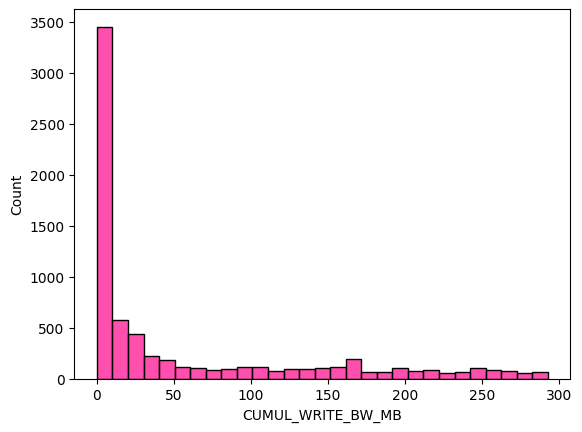

In [64]:
binwidth = 10 # 10 MB/s
g = sns.histplot(
    x=grp_traces['CUMUL_WRITE_BW_MB'], 
    binwidth=binwidth, 
    color="deeppink"
)

## No bar with more than 10 jobs above a write bw of 3.3e8 B/s  (330000000 B/s -> 330 MB/s) 

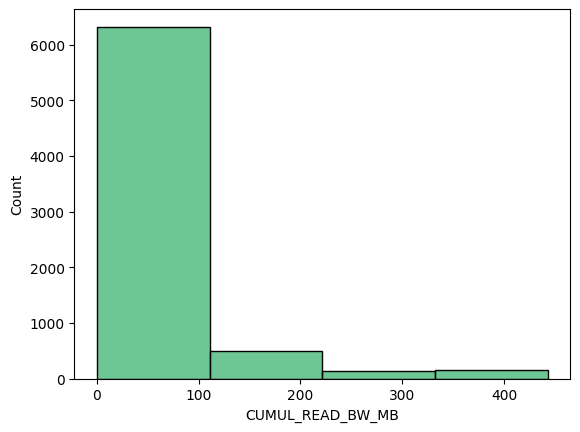

In [65]:
binwidth = 100 # 100 MB/s
g = sns.histplot(
    x=grp_traces['CUMUL_READ_BW_MB'], 
    binwidth=binwidth, 
    color="mediumseagreen"
)

## Almost no bar with more than 10 jobs above a read bandwidth of 0.9e9 B/s  (900000000 B/s -> 900 MB/s) 

### Cumul. R/W Bandwidth (months)

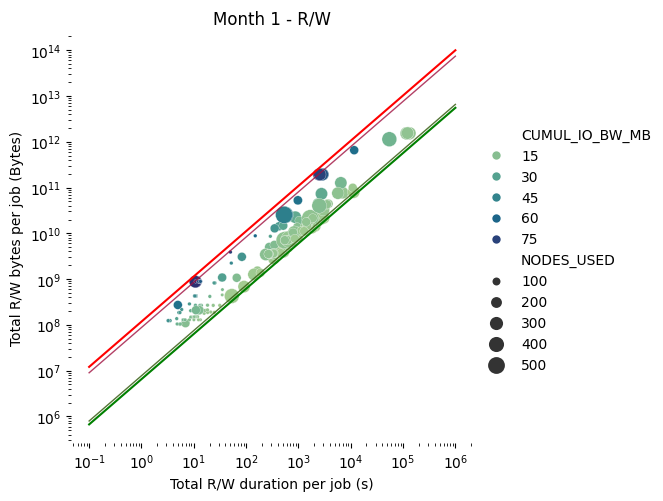

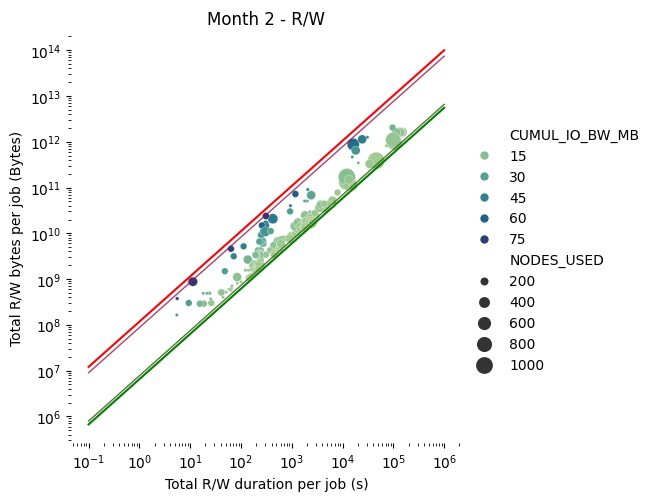

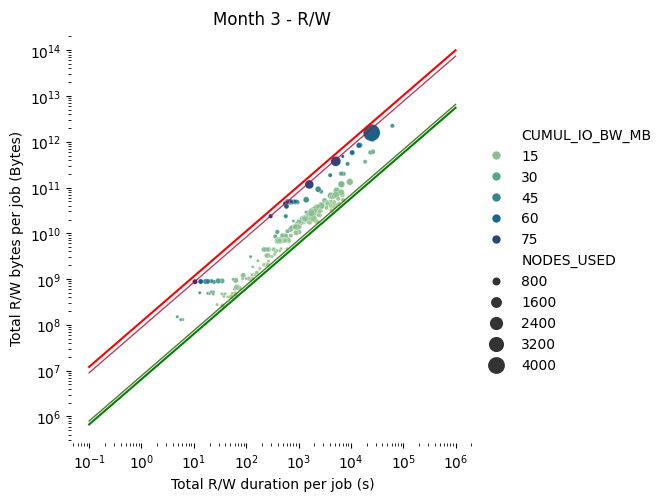

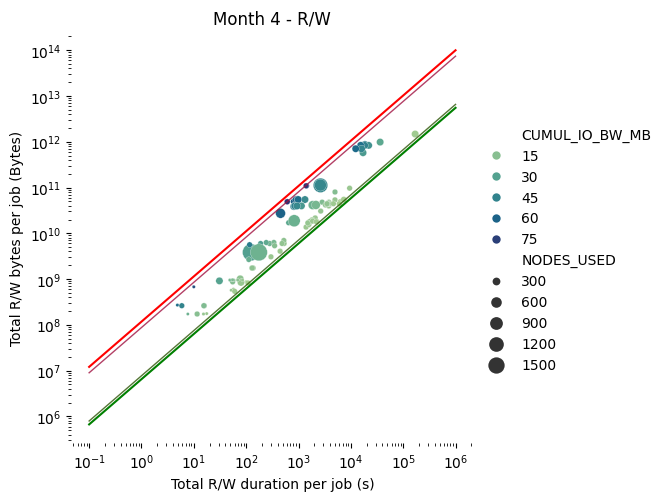

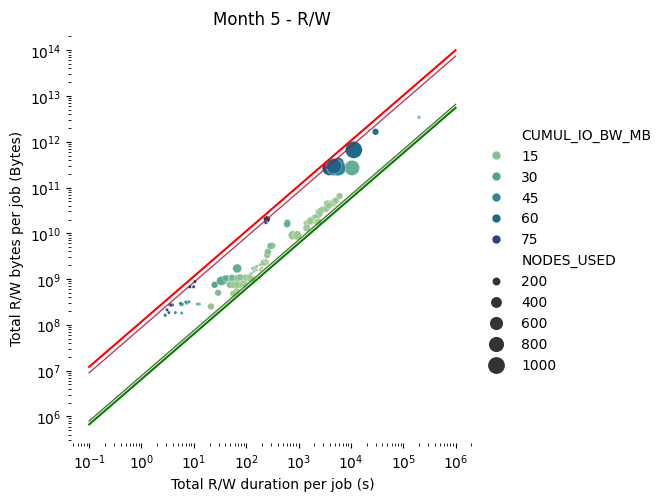

...

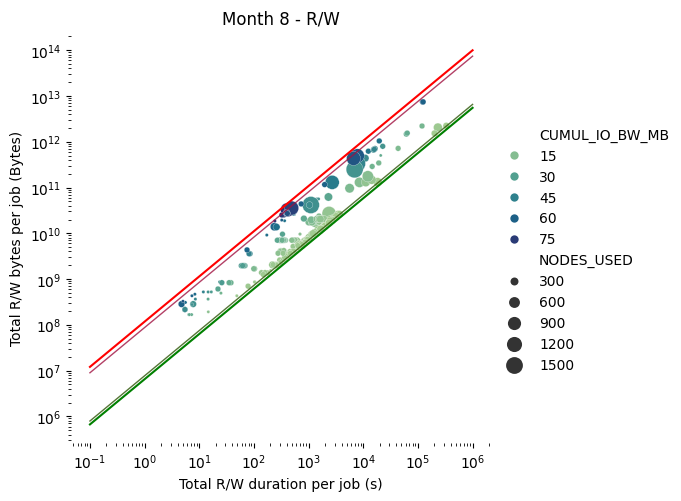

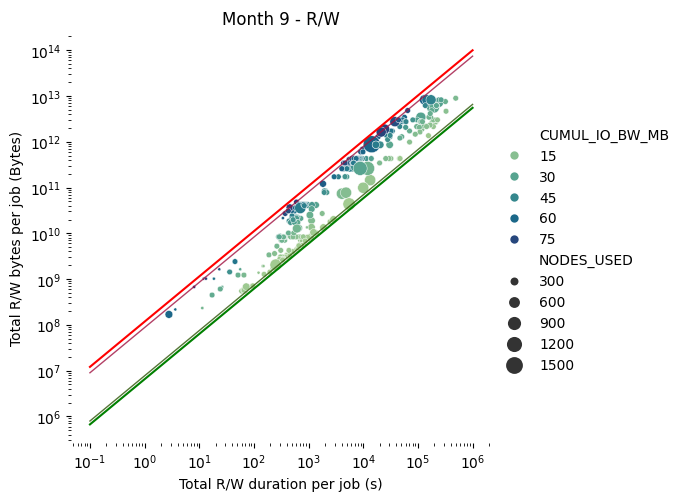

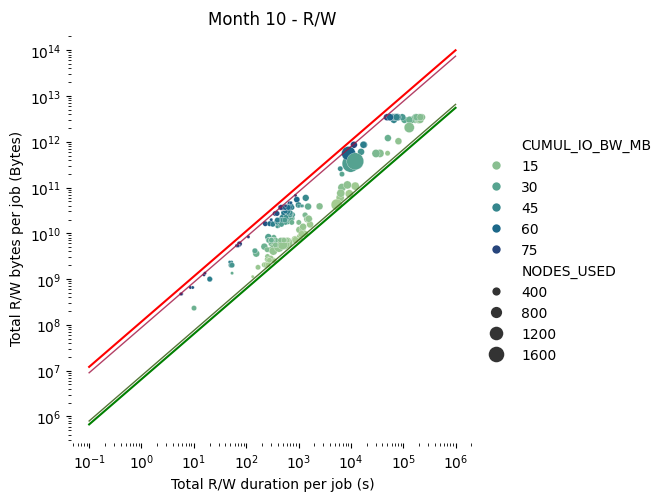

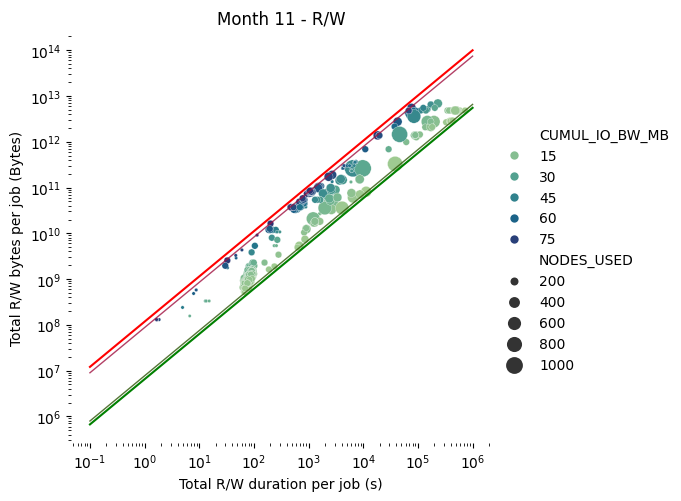

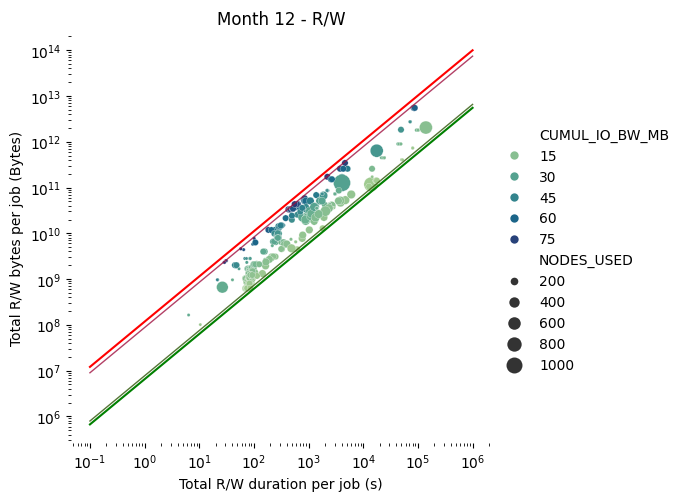

In [66]:
### CURRENTLY SET TO KEEP ONLY CAT 1 JOBS IN EACH MONTH

for month_index in range(1, 13):
    month = months[month_index - 1]
    month = month[month["CATEGORY"] == 1]
    
    # Scatter plot of Total IO time to Total Bytes READ
    g = sns.relplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                    hue="CUMUL_IO_BW_MB", size="NODES_USED",
                    sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                    data=month)
    g.set(xscale='log', yscale='log')
    g.set(xlabel="Total R/W duration per job (s)", ylabel="Total R/W bytes per job (Bytes)")
    g.despine(left=True, bottom=True)
    
    sns.lineplot(x="x", y="y", data=line_75, legend=None, color="red")
    sns.lineplot(x="x", y="y", data=line_25, legend=None, color="green")
    sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
    sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
   
    g.set(title=f"Month {month_index} - R/W")
    plt.savefig(f"categories_month{month_index}_rw.png", dpi=200)
    plt.show()

### Cumul. Read Bandwidth (months)

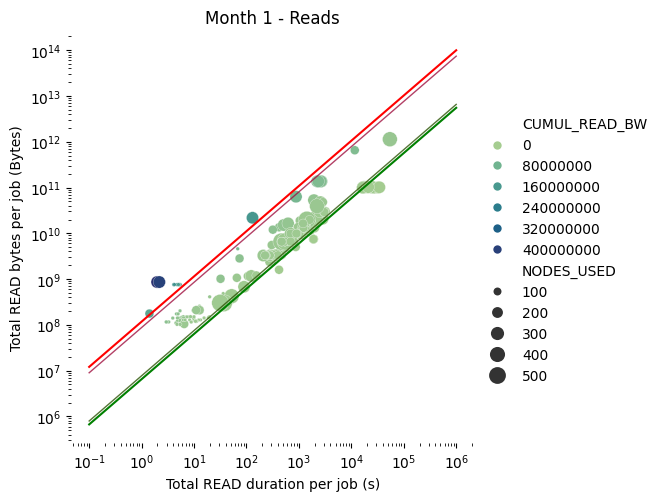

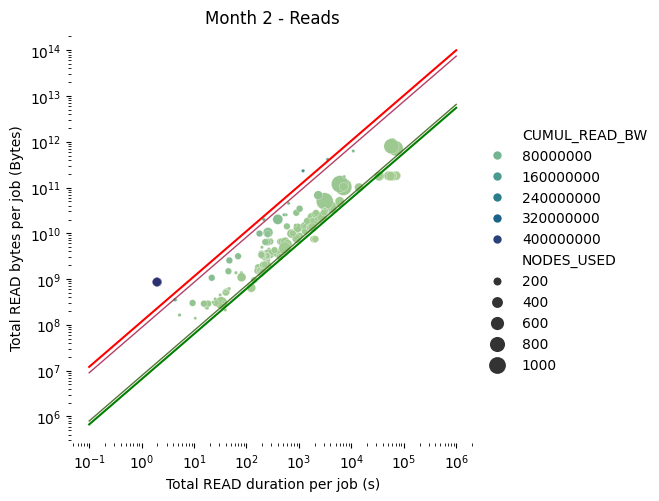

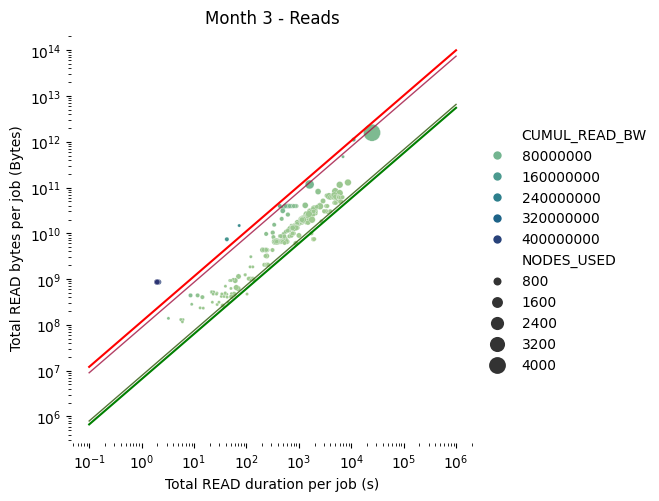

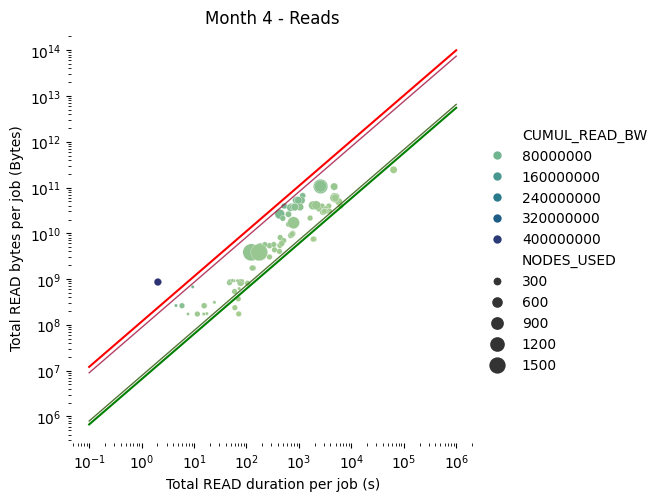

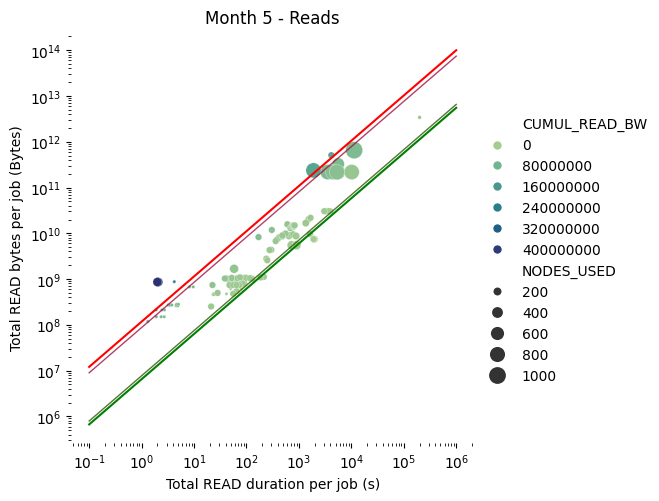

...

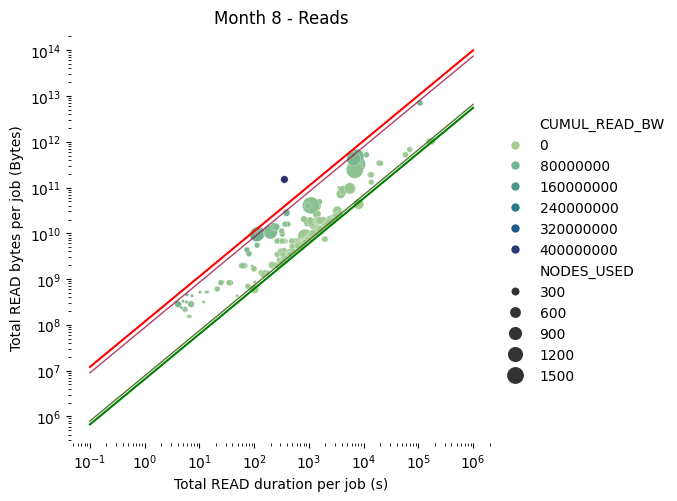

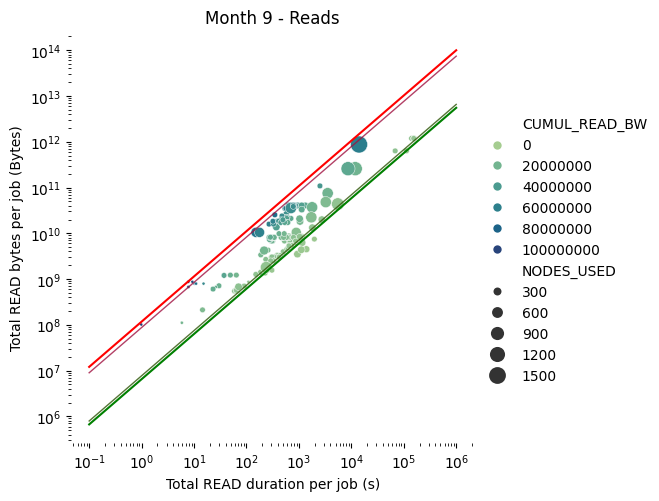

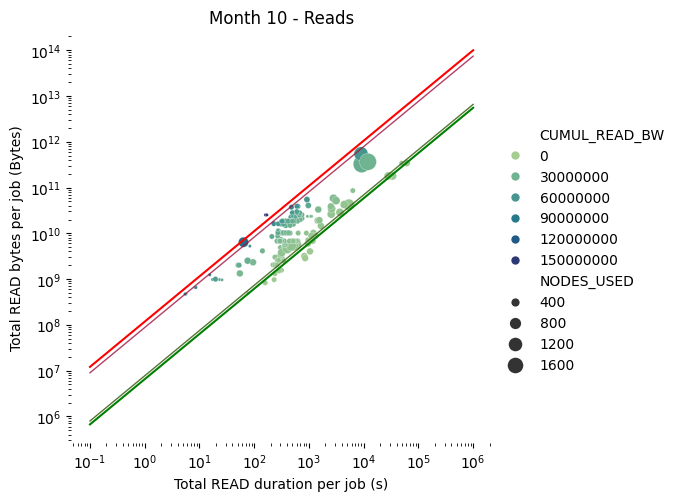

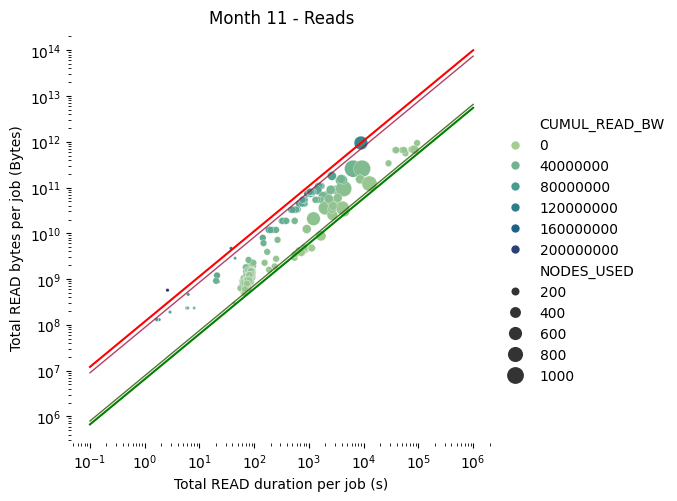

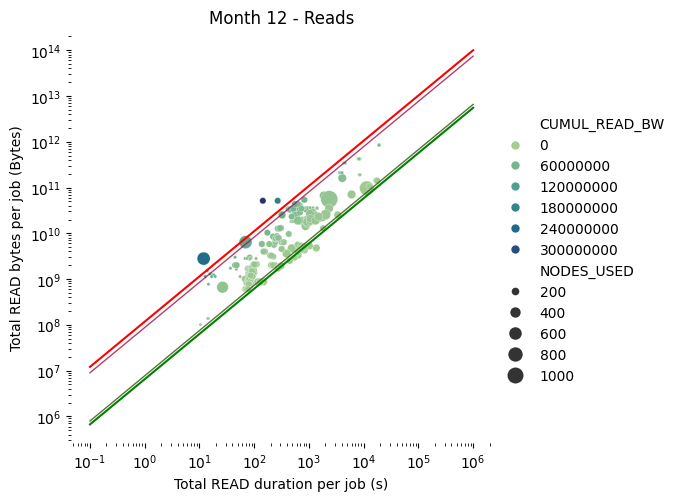

In [67]:
# Scatter plot of Total IO time to Total Bytes READ

for month_index in range(1, 13):
    month = months[month_index - 1]
    month = month[month["CATEGORY"] == 1]

    g = sns.relplot(x="TOTAL_READ_TIME", y="TOTAL_BYTES_READ", 
                    hue="CUMUL_READ_BW", size="NODES_USED",
                    sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                    data=month)
    g.set(xscale='log', yscale='log')
    g.set(ylabel="Total READ bytes per job (Bytes)", xlabel="Total READ duration per job (s)")
    # g.set(xlim=(0.00001, 10000000000), ylim=(0.1, 1000000000000000))
    g.despine(left=True, bottom=True)
    g.set(title=f"Month {month_index} - Reads")
    
    sns.lineplot(x="x", y="y", data=line_75, legend=None, color="red")
    sns.lineplot(x="x", y="y", data=line_25, legend=None, color="green")
    sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
    sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
    
    plt.savefig(f"categories_month{month_index}_reads.png", dpi=200)
    plt.show()

### Cumul. Write Bandwidth (months)

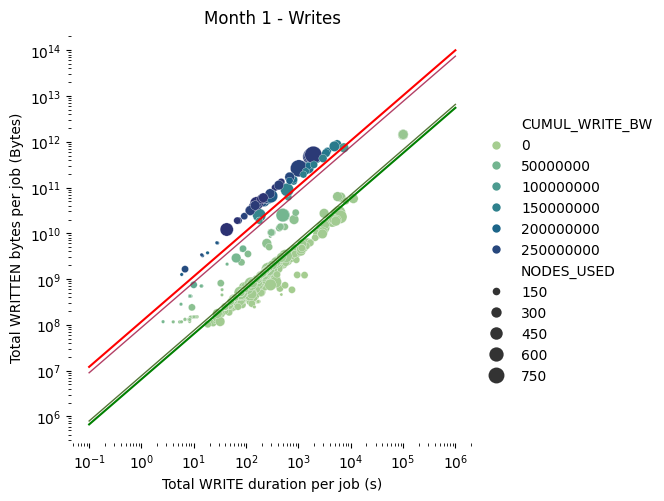

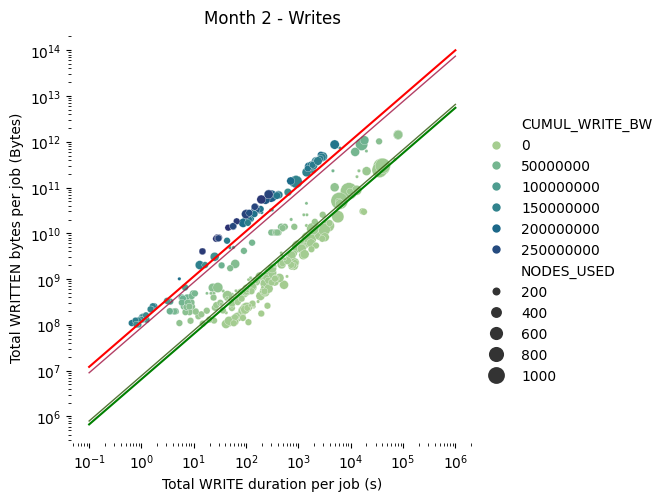

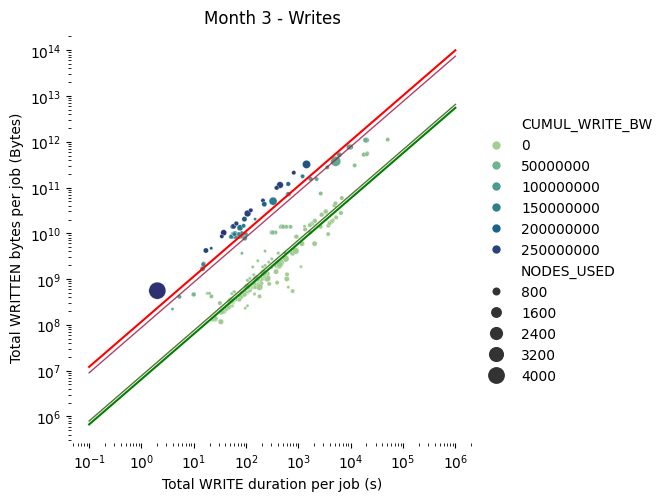

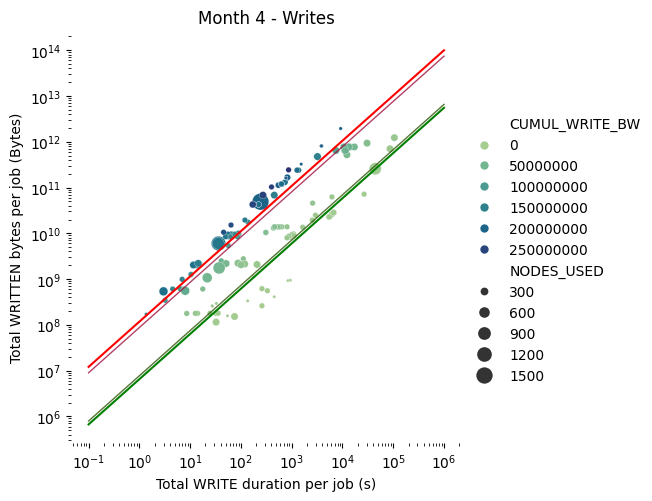

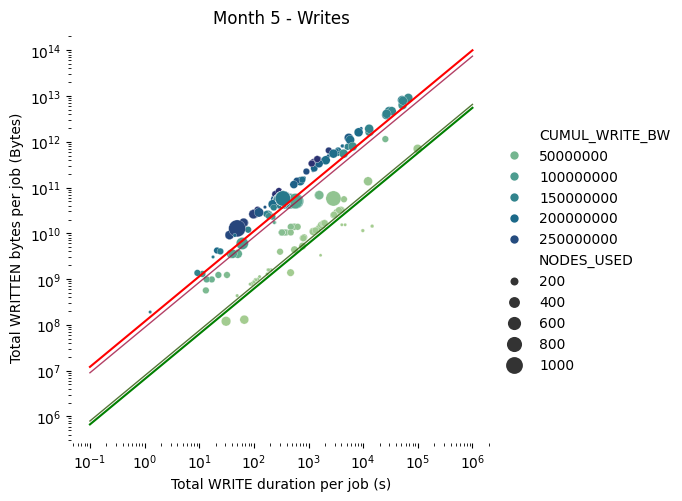

...

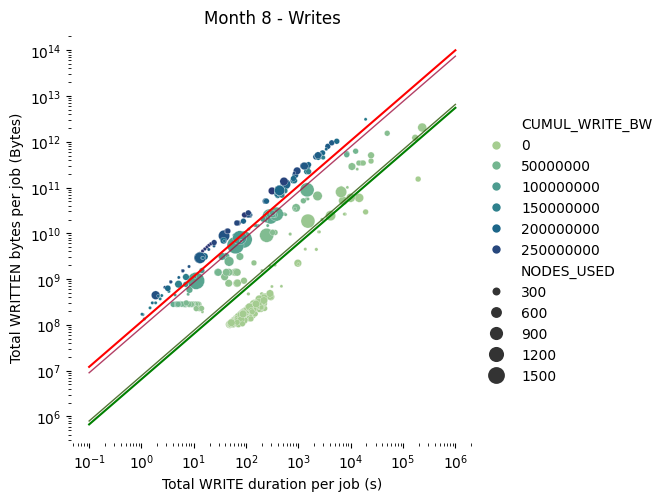

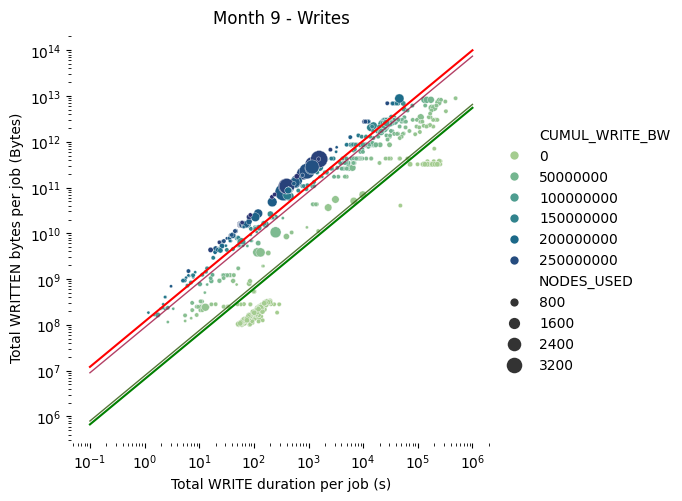

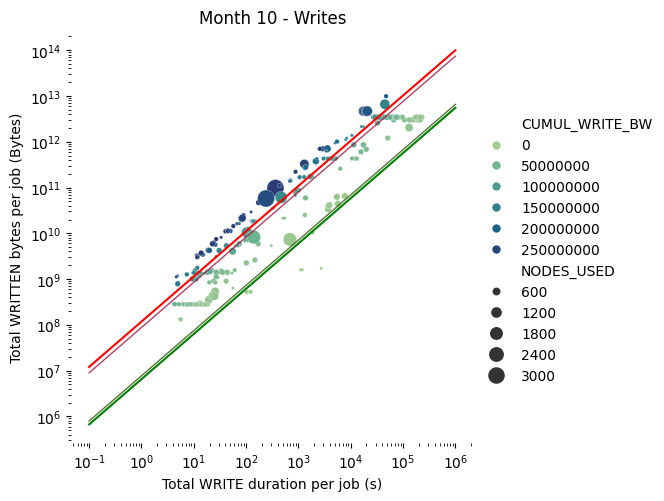

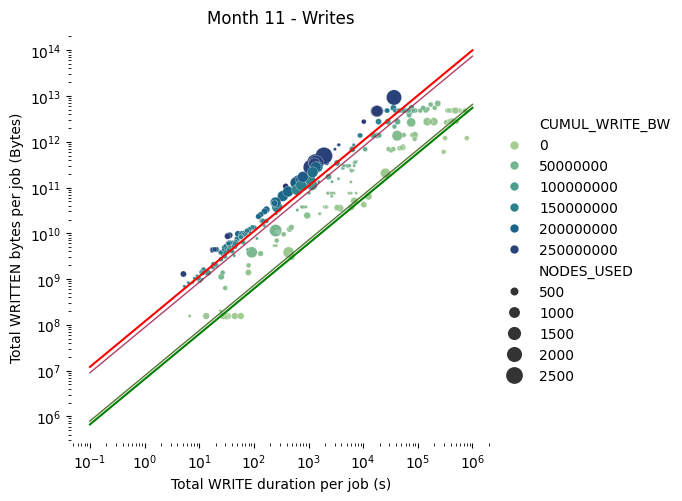

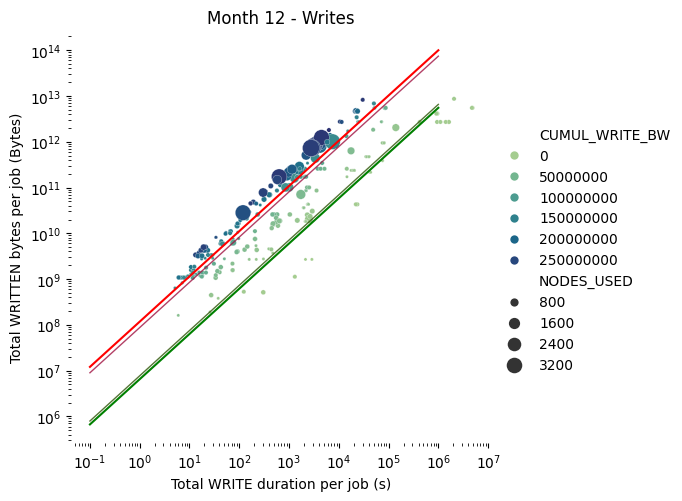

In [68]:
# Scatter plot of Total IO time to Total Bytes WRITTEN

for month_index in range(1, 13):
    month = months[month_index - 1]

    g = sns.relplot(x="TOTAL_WRITE_TIME", y="TOTAL_BYTES_WRITTEN", 
                    hue="CUMUL_WRITE_BW", size="NODES_USED",
                    sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                    data=month)
    g.set(xscale='log', yscale='log')
    g.set(ylabel="Total WRITTEN bytes per job (Bytes)", xlabel="Total WRITE duration per job (s)")
    # g.set(xlim=(0.00001, 10000000000), ylim=(0.1, 1000000000000000))
    g.despine(left=True, bottom=True)
    g.set(title=f"Month {month_index} - Writes")
    
    sns.lineplot(x="x", y="y", data=line_75, legend=None, color="red")
    sns.lineplot(x="x", y="y", data=line_25, legend=None, color="green")
    sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
    sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
    
    plt.savefig(f"categories_month{month_index}_writes.png", dpi=200)
    plt.show()

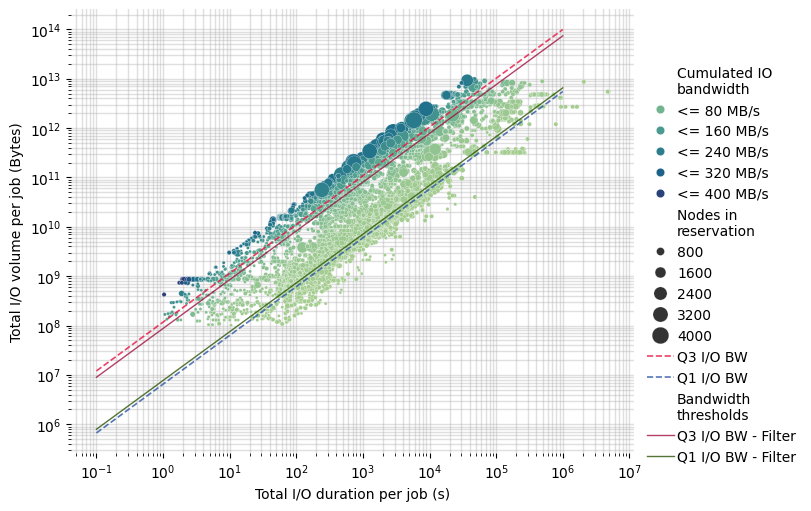

In [69]:
fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')

# Scatter plot of Total IO time to Total Bytes READ
g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                hue="CUMUL_IO_BW_MB", size="NODES_USED",
                sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                data=grp_traces, ax=ax, zorder=10)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")


sns.lineplot(x="x", y="y", data=line_75, legend=None, color="#e91140", zorder=20, label="Q3 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25, legend=None, color="#2b54a5", zorder=20, label="Q1 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)

ax.minorticks_on()
ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
ax.set_frame_on(False)

legend = ax.legend(loc="best", bbox_to_anchor=(1, 0.5, 0, 0.4), fontsize=10, frameon=False, handletextpad=0.2)
handles, labels = ax.get_legend_handles_labels()
handles.insert(-2, handles[0])
labels.insert(-2, "Bandwidth\nthresholds")
legend._legend_box = None
legend._init_legend_box(handles, labels)
legend._set_loc(legend._loc)
legend.set_title(legend.get_title().get_text())

texts = legend.get_texts()
for text in texts:
    if text.get_text() == "CUMUL_IO_BW_MB":
        text.set_text("Cumulated IO\nbandwidth")
    if text.get_text() == "NODES_USED":
        text.set_text("Nodes in\nreservation")
        break
    try:
        int(text.get_text())
    except ValueError:
        continue
    else:
        text.set_text(f"<= {int(text.get_text())} MB/s")

plt.savefig("7_allFilters_allClusters.png", dpi=300)

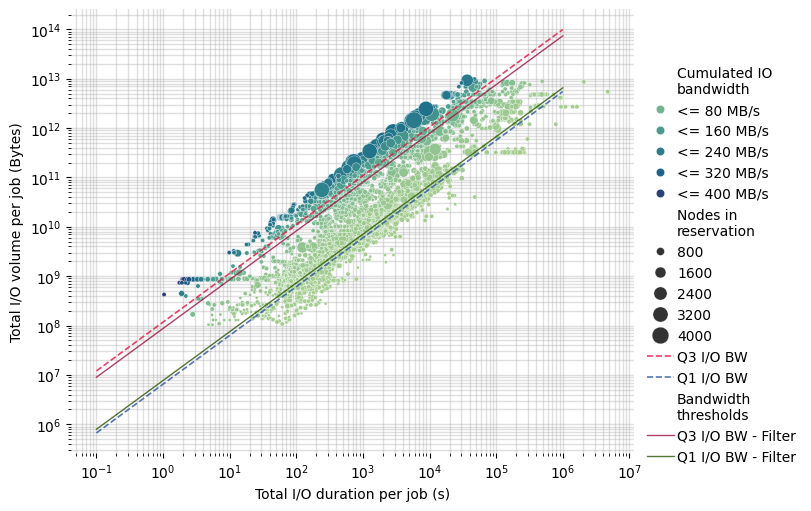

In [70]:
# Plotting only the major cluster (from k-means2 in previous part)
# Not exported because the usefulness of using kmeans on this dataset is not yet proven...

fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')

# Scatter plot of Total IO time to Total Bytes READ
g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                hue="CUMUL_IO_BW_MB", size="NODES_USED",
                sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                data=grp_traces[grp_traces.cluster_label == major_label], ax=ax, zorder=10)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")


sns.lineplot(x="x", y="y", data=line_75, legend=None, color="#e91140", zorder=20, label="Q3 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25, legend=None, color="#2b54a5", zorder=20, label="Q1 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)

ax.minorticks_on()
ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
ax.set_frame_on(False)

legend = ax.legend(loc="best", bbox_to_anchor=(1, 0.5, 0, 0.4), fontsize=10, frameon=False, handletextpad=0.2)
handles, labels = ax.get_legend_handles_labels()
handles.insert(-2, handles[0])
labels.insert(-2, "Bandwidth\nthresholds")
legend._legend_box = None
legend._init_legend_box(handles, labels)
legend._set_loc(legend._loc)
legend.set_title(legend.get_title().get_text())

texts = legend.get_texts()
for text in texts:
    if text.get_text() == "CUMUL_IO_BW_MB":
        text.set_text("Cumulated IO\nbandwidth")
    if text.get_text() == "NODES_USED":
        text.set_text("Nodes in\nreservation")
        break
    try:
        int(text.get_text())
    except ValueError:
        continue
    else:
        text.set_text(f"<= {int(text.get_text())} MB/s")

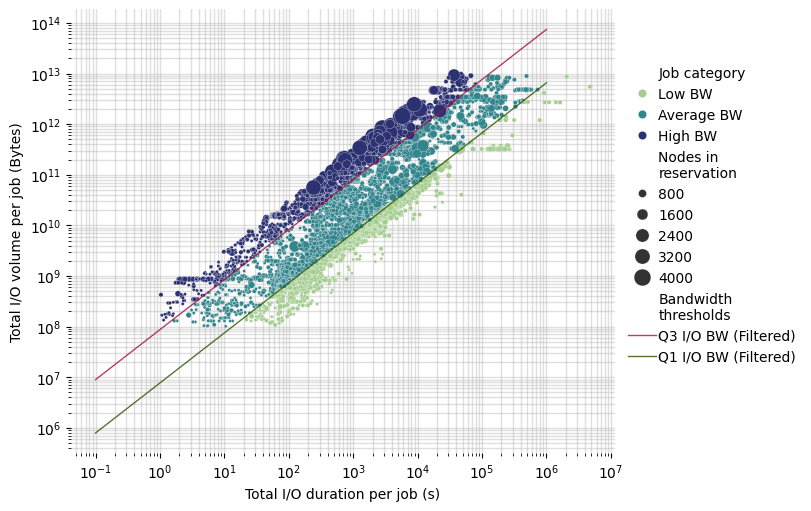

In [71]:
fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')

# Scatter plot of Total IO time to Total Bytes READ
g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                hue="CATEGORY", size="NODES_USED",
                sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                data=grp_traces, ax=ax, zorder=10)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")

#sns.lineplot(x="x", y="y", data=line_75, legend=None, color="#e91140", zorder=20, label="Q3 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
#sns.lineplot(x="x", y="y", data=line_25, legend=None, color="#2b54a5", zorder=20, label="Q1 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW (Filtered)", ax=ax, linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW (Filtered)", ax=ax, linestyle="-", linewidth=1, alpha=0.8)

ax.minorticks_on()
ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
ax.set_frame_on(False)
#ax.set_xlim(10e-5)

legend = ax.legend(loc="best", bbox_to_anchor=(1, 0.5, 0, 0.4), fontsize=10, frameon=False, handletextpad=0.2)

handles, labels = ax.get_legend_handles_labels()
handles.insert(-2, handles[0])
labels.insert(-2, "Bandwidth\nthresholds")

legend._legend_box = None
legend._init_legend_box(handles, labels)
legend._set_loc(legend._loc)
legend.set_title(legend.get_title().get_text())

texts = legend.get_texts()
for text in texts:
    if text.get_text() == "CATEGORY":
        text.set_text("Job category")
    if text.get_text() == "NODES_USED":
        text.set_text("Nodes in\nreservation")
    if text.get_text() == "2":
        text.set_text("High BW")
    if text.get_text() == "1":
        text.set_text("Average BW")
    if text.get_text() == "0":
        text.set_text("Low BW")
        
plt.savefig("8_allCategories_allFilters_allClusters.pdf", dpi=300)

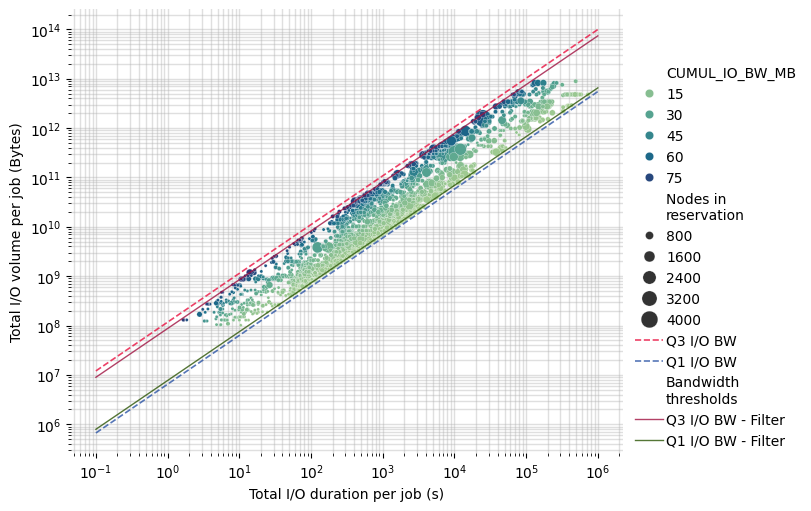

In [72]:
fig, ax = plt.subplots(figsize=(8,5), frameon=True, linewidth=0, layout='constrained')

# Scatter plot of Total IO time to Total Bytes READ
g = sns.scatterplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                hue="CUMUL_IO_BW_MB", size="NODES_USED",
                sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                data=grp_traces[grp_traces.CATEGORY==1], ax=ax, zorder=10)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")

sns.lineplot(x="x", y="y", data=line_75, legend=None, color="#e91140", zorder=20, label="Q3 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25, legend=None, color="#2b54a5", zorder=20, label="Q1 I/O BW", ax=ax, linestyle="--", linewidth=1.2, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", ax=ax, linestyle="-", linewidth=1, alpha=0.8)

ax.minorticks_on()
ax.grid(visible=True, which="both", axis="both", zorder=-10.0, alpha=0.4, linewidth=1)
ax.set_frame_on(False)
#ax.set_xlim(10e-5)

legend = ax.legend(loc="best", bbox_to_anchor=(1, 0.5, 0, 0.4), fontsize=10, frameon=False, handletextpad=0.2)

handles, labels = ax.get_legend_handles_labels()
handles.insert(-2, handles[0])
labels.insert(-2, "Bandwidth\nthresholds")

legend._legend_box = None
legend._init_legend_box(handles, labels)
legend._set_loc(legend._loc)
legend.set_title(legend.get_title().get_text())

texts = legend.get_texts()
for text in texts:
    if text.get_text() == "CATEGORY":
        text.set_text("Job category")
    if text.get_text() == "NODES_USED":
        text.set_text("Nodes in\nreservation")
    if text.get_text() == "2":
        text.set_text("High BW")
    if text.get_text() == "1":
        text.set_text("Average BW")
    if text.get_text() == "0":
        text.set_text("Low BW")
        
plt.savefig("8_category1_allFilters_allClusters.png", dpi=300)

### Histograms

#### Walltime

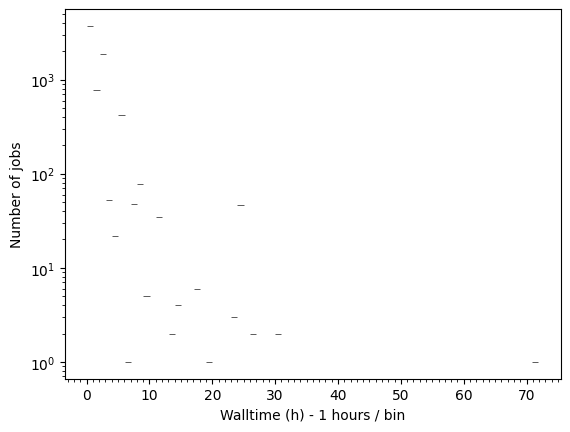

In [73]:
printmd("#### Walltime")

binwidth = 1  # 1 hours

g = sns.histplot(
    x=(grp_traces['WALLTIME_SECONDS'] / 3600), 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, True]
)

g.set_xlabel(f"Walltime (h) - {binwidth} hours / bin")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Runtime

Mean number of nodes : 4943.937903543308
Median number of nodes : 3284.2349999999997
Std dev of number of nodes : 6631.97996152229
SVariance number of nodes : 43983158.21003319


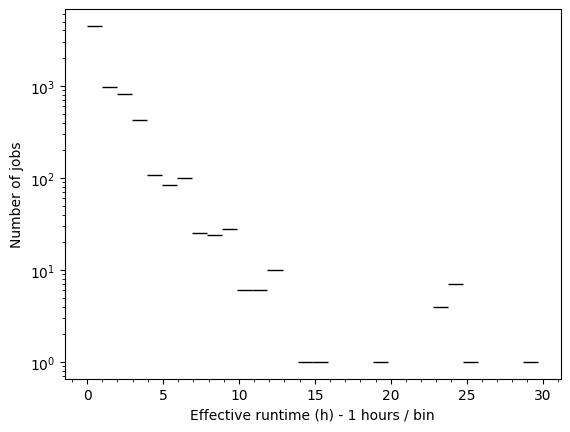

In [74]:
printmd("#### Runtime")

mean_runtime = grp_traces['RUNTIME_SECONDS'].mean()
median_runtime = grp_traces['RUNTIME_SECONDS'].median()
std_runtime  = grp_traces['RUNTIME_SECONDS'].std()
var_runtime = grp_traces['RUNTIME_SECONDS'].var()

print(f"Mean number of nodes : {mean_runtime}")
print(f"Median number of nodes : {median_runtime}")
print(f"Std dev of number of nodes : {std_runtime}")
print(f"SVariance number of nodes : {var_runtime}")

# threshold = grp_traces['RUNTIME_SECONDS'].max()

# samples = 0
# gamma_dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_runtime / np.sqrt(var_runtime / (mean_runtime * mean_runtime) + 1)), 
#         np.sqrt(np.log((var_runtime / (mean_runtime * mean_runtime)) + 1))
#     )
#     # value = np.random.lognormal(np.log(median_runtime), np.sqrt(np.log(mean_runtime) / np.log(median_runtime)))
#     if value < threshold:
#         samples += 1
#         gamma_dist.append(value / 3600)

binwidth = 1  # 1 hours

g = sns.histplot(
    x=(grp_traces['RUNTIME_SECONDS'] / 3600), 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, True]
)

# g2 = sns.histplot(
#     x=gamma_dist, 
#     binwidth=binwidth, 
#     discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Effective runtime (h) - {binwidth} hours / bin")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Wait time

Text(0, 0.5, 'Number of jobs')

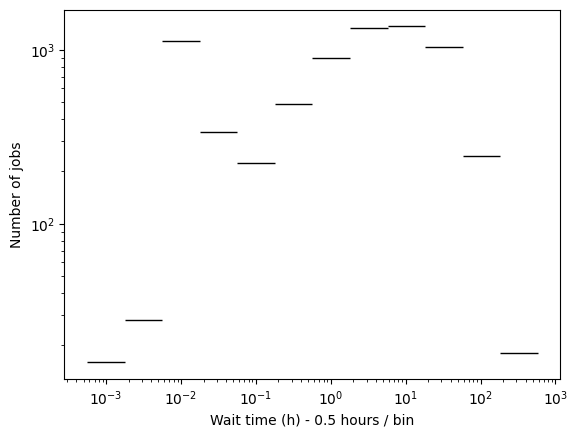

In [75]:
printmd("#### Wait time")

binwidth = 0.5  # 24 hours

g = sns.histplot(
    x=(grp_traces['QUEUED_WAIT_SECONDS'] / 3600), 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[True, True]
)

g.set_xlabel(f"Wait time (h) - {binwidth} hours / bin")
g.set_ylabel("Number of jobs")
# g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

In [76]:
# The outlier job that had to wait for almost half a year before running...
grp_traces[grp_traces['QUEUED_WAIT_SECONDS'] == 15515768]

,COBALT_JOBID,RUN_DATE_ID,START_TIME,END_TIME,NPROCS,RUN_TIME,TOTAL_POSIX_OPENS,TOTAL_STDIO_OPENS,TOTAL_MPIIO_INDEP_OPENS,TOTAL_MPIIO_COLL_OPENS,TOTAL_POSIX_READS,TOTAL_POSIX_WRITES,TOTAL_STDIO_READS,TOTAL_STDIO_WRITES,TOTAL_MPIIO_INDEP_READS,TOTAL_MPIIO_INDEP_WRITES,TOTAL_MPIIO_COLL_READS,TOTAL_MPIIO_COLL_WRITES,QUEUED_TIMESTAMP,START_TIMESTAMP,END_TIMESTAMP,QUEUED_DATE_ID,START_DATE_ID,END_DATE_ID,WALLTIME_SECONDS,RUNTIME_SECONDS,NODES_USED,NODES_REQUESTED,CORES_USED,CORES_REQUESTED,QUEUED_WAIT_SECONDS,REQUESTED_CORE_HOURS,USED_CORE_HOURS,TOTAL_BYTES_READ,TOTAL_BYTES_WRITTEN,TOTAL_IO_VOLUME,TOTAL_READ_TIME,TOTAL_WRITE_TIME,TOTAL_META_TIME,TOTAL_IO_TIME_wMETA,TOTAL_IO_TIME,CUMUL_READ_BW,CUMUL_READ_BW_MB,CUMUL_WRITE_BW,CUMUL_WRITE_BW_MB,CUMUL_IO_BW,CUMUL_IO_BW_MB,READ_BW_PER_NODES,WRITE_BW_PER_NODES,FAST_JOBS,cluster_label,CATEGORY,SLEEP_BETWEEN_JOBS
COBALT_JOBID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


#### Number of nodes used

Mean number of nodes : 196.6199381327334
Median number of nodes : 128.0
Std dev of number of nodes : 278.95102384056196
Var of number of nodes : 77813.67370169776


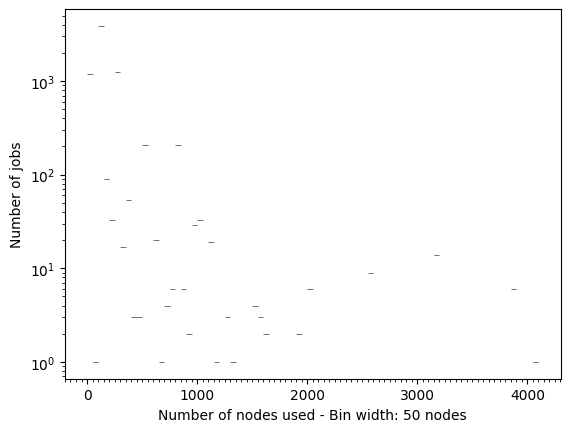

In [77]:
printmd("#### Number of nodes used")

import numpy as np

mean_nodes = grp_traces['NODES_USED'].mean()
median_nodes = grp_traces['NODES_USED'].median()
std_nodes  = grp_traces['NODES_USED'].std()
var_nodes = grp_traces['NODES_USED'].var()
max_nodes = grp_traces['NODES_USED'].max()

print(f"Mean number of nodes : {mean_nodes}")
print(f"Median number of nodes : {median_nodes}")
print(f"Std dev of number of nodes : {std_nodes}")
print(f"Var of number of nodes : {var_nodes}")

# samples = 0
# dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_nodes / np.sqrt(var_nodes / (mean_nodes * mean_nodes) + 1)), 
#         np.sqrt(np.log((var_nodes / (mean_nodes * mean_nodes)) + 1))
#     )
#     if value < max_nodes:
#         samples += 1
#         dist.append(value)


binwidth = 50


g = sns.histplot(
    x=(grp_traces['NODES_USED']), 
    binwidth=binwidth, 
    discrete=False,  
    log_scale=[False, True]
)

# g = sns.histplot(
#     x=dist, 
#     binwidth=binwidth, 
#     discrete=False, 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Number of nodes used - Bin width: {binwidth} nodes")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Number of cores used

Mean number of cores : 12583.676040494938
Median number of cores : 8192.0
Std dev of number of cores : 17852.865525795965
Var of number of cores : 318724807.482154


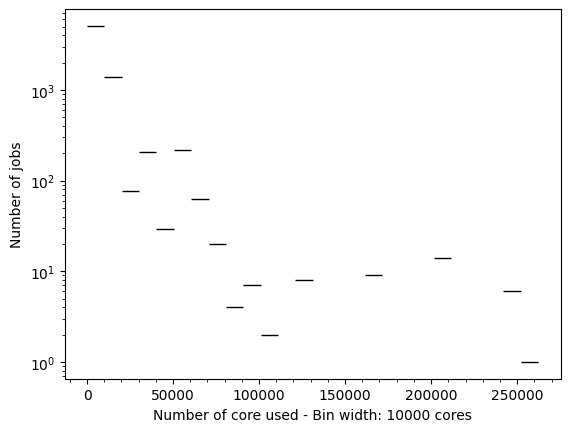

In [78]:
printmd("#### Number of cores used")

mean_cores = grp_traces['CORES_USED'].mean()
median_cores = grp_traces['CORES_USED'].median()
std_cores  = grp_traces['CORES_USED'].std()
var_cores = grp_traces['CORES_USED'].var()

print(f"Mean number of cores : {mean_cores}")
print(f"Median number of cores : {median_cores}")
print(f"Std dev of number of cores : {std_cores}")
print(f"Var of number of cores : {var_cores}")

# # threshold = np.quantile(grp_traces['CORES_USED'], 0.99)
# threshold = grp_traces['CORES_USED'].max()

# samples = 0
# dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_cores / np.sqrt(var_cores / (mean_cores * mean_cores) + 1)), 
#         np.sqrt(np.log((var_cores / (mean_cores * mean_cores)) + 1))
#     )
#     if value < threshold:
#         samples += 1
#         dist.append(value)

binwidth = 10000 

g = sns.histplot(
    x=(grp_traces['CORES_USED']), 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, True]
)

# g = sns.histplot(
#     x=dist, 
#     binwidth=binwidth, 
#     discrete=False, 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Number of core used - Bin width: {binwidth} cores")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Number of terabytes read

Quantile threshold= 236405563536.0
Mean number of RB : 19885844087.692165
Median number of RB : 4238991632.0
Std dev of number of RB : 45043257651.84619
Var number of RB : 2.0288950598906007e+21
Max RB : 236405563536


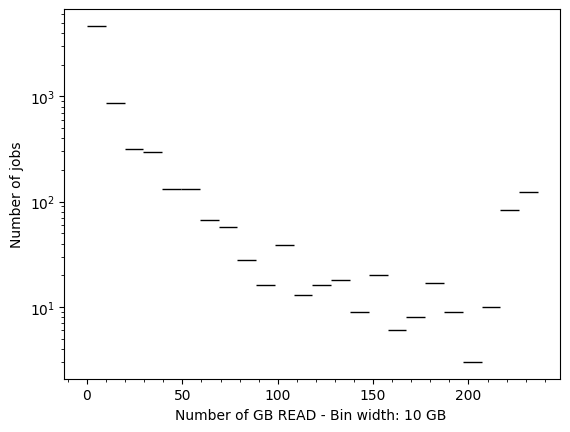

In [79]:
printmd("#### Number of terabytes read")

max_read_bytes = grp_traces['TOTAL_BYTES_READ'].max()
quantile_threshold = np.quantile(grp_traces['TOTAL_BYTES_READ'], 0.97)
print(f"Quantile threshold= {quantile_threshold}")
bounded_bytes_read = grp_traces[grp_traces['TOTAL_BYTES_READ'] <= quantile_threshold]["TOTAL_BYTES_READ"]

mean_rb = bounded_bytes_read.mean()
median_rb = bounded_bytes_read.median()
std_rb  = bounded_bytes_read.std()
var_rb = bounded_bytes_read.var()
max_rb = bounded_bytes_read.max()

print(f"Mean number of RB : {mean_rb}")
print(f"Median number of RB : {median_rb}")
print(f"Std dev of number of RB : {std_rb}")
print(f"Var number of RB : {var_rb}")
print(f"Max RB : {max_rb}")

# threshold = bounded_bytes_read.max()

# samples = 0
# dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_rb / np.sqrt(var_rb / (mean_rb*mean_rb) + 1)), 
#         np.sqrt(np.log((var_rb / (mean_rb*mean_rb)) + 1))
#     )
#     if value < threshold:
#         samples += 1
#         dist.append(value / 1_000_000_000)

# # print(gamma_dist[0:200])

binwidth = 10  # GB

g = sns.histplot(
    x=bounded_bytes_read / 1_000_000_000, 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, True]
)

# g = sns.histplot(
#     x=dist, 
#     binwidth=binwidth, 
#     discrete=False, 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Number of GB READ - Bin width: {binwidth} GB ")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Number of bytes written

Quantile threshold= 1717987091040.0
Mean number of RB : 72273149189.75626
Median number of RB : 391171781.0
Std dev of number of RB : 220717442818.3088
Var number of RB : 4.871618956425342e+22


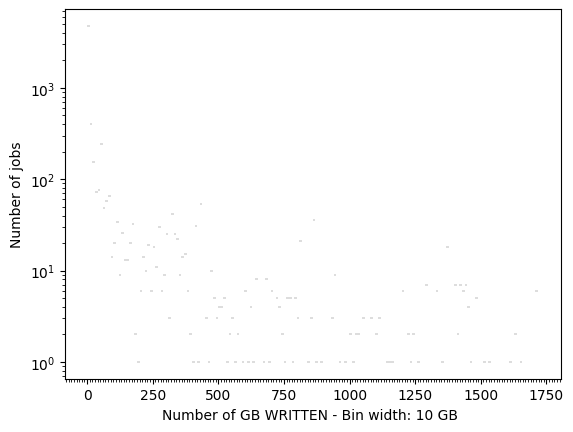

In [80]:
printmd("#### Number of bytes written")

max_written_bytes = grp_traces['TOTAL_BYTES_WRITTEN'].max()
quantile_threshold = np.quantile(grp_traces['TOTAL_BYTES_WRITTEN'], 0.95)
print(f"Quantile threshold= {quantile_threshold}")
bounded_bytes_written = grp_traces[grp_traces['TOTAL_BYTES_WRITTEN'] <= quantile_threshold]["TOTAL_BYTES_WRITTEN"]

mean_wb = bounded_bytes_written.mean()
median_wb = bounded_bytes_written.median()
std_wb  = bounded_bytes_written.std()
var_wb = bounded_bytes_written.var()

print(f"Mean number of RB : {mean_wb}")
print(f"Median number of RB : {median_wb}")
print(f"Std dev of number of RB : {std_wb}")
print(f"Var number of RB : {var_wb}")

# threshold = bounded_bytes_written.max()

# samples = 0
# dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_wb / np.sqrt(var_wb / (mean_wb*mean_wb) + 1)), 
#         np.sqrt(np.log((var_wb / (mean_wb*mean_wb)) + 1))
#     )
#     if value < threshold:
#         samples += 1
#         dist.append(value / 1_000_000_000)


binwidth = 10  # GB

g = sns.histplot(
    x=bounded_bytes_written / 1_000_000_000, 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, True]
)

# g = sns.histplot(
#     x=dist, 
#     binwidth=binwidth, 
#     discrete=False, 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Number of GB WRITTEN - Bin width: {binwidth} GB ")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### Interval between jobs

Mean interval between jobs : 4421.78259
Median interval between jobs : 590.0
Std dev interval between jobs : 11386.861192


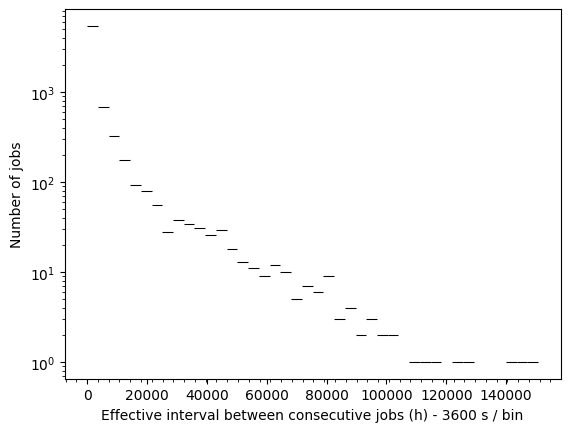

In [81]:
printmd("#### Interval between jobs")

max_sleep = grp_traces['SLEEP_BETWEEN_JOBS'].max()
sleep_df = grp_traces[grp_traces['SLEEP_BETWEEN_JOBS'] <= max_sleep * 0.9]

mean_interval = sleep_df['SLEEP_BETWEEN_JOBS'].mean().total_seconds()
median_interval = sleep_df['SLEEP_BETWEEN_JOBS'].median().total_seconds()
std_interval  = sleep_df['SLEEP_BETWEEN_JOBS'].std().total_seconds()
var_interval = sleep_df['SLEEP_BETWEEN_JOBS'].dt.total_seconds().var()

print(f"Mean interval between jobs : {mean_interval}")
print(f"Median interval between jobs : {median_interval}")
print(f"Std dev interval between jobs : {std_interval}")

# threshold = sleep_df['SLEEP_BETWEEN_JOBS'].max().total_seconds()
# print(threshold)

# samples = 0
# dist = []
# while samples != grp_traces.shape[0]:
#     value = np.random.lognormal(
#         np.log(mean_interval / np.sqrt(var_interval / (mean_interval*mean_interval) + 1)), 
#         np.sqrt(np.log((var_interval / (mean_interval*mean_interval)) + 1))
#     )
#     if value < threshold:
#         samples += 1
#         dist.append(value)


binwidth = 3600  # 1 hours

g = sns.histplot(
    x=(sleep_df['SLEEP_BETWEEN_JOBS'].dt.total_seconds()), 
    binwidth=binwidth, 
    discrete=False, 
    log_scale=[False, True]
)

# g2 = sns.histplot(
#     x=dist, 
#     binwidth=binwidth, 
#     discrete=False, 
#     log_scale=[False, True]
# )

g.set_xlabel(f"Effective interval between consecutive jobs (h) - {binwidth} s / bin")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

#### IO duration (cumulated)

Mean number of nodes : 12572.46899322891
Median number of nodes : 736.9638645
Std dev of number of nodes : 102595.34439198936
SVariance number of nodes : 10525804690.910904


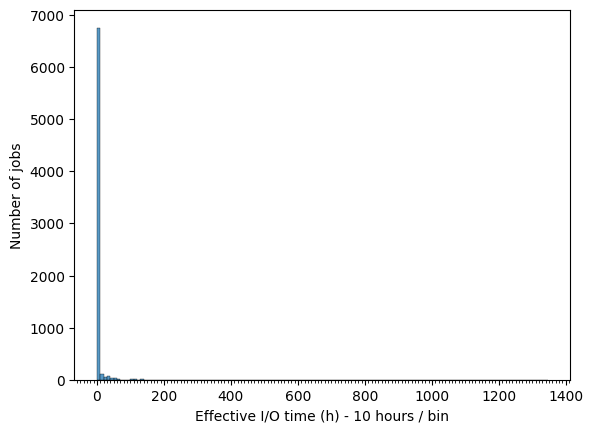

In [82]:
printmd("#### IO duration (cumulated)")

mean_runtime = grp_traces['TOTAL_IO_TIME'].mean()
median_runtime = grp_traces['TOTAL_IO_TIME'].median()
std_runtime  = grp_traces['TOTAL_IO_TIME'].std()
var_runtime = grp_traces['TOTAL_IO_TIME'].var()

print(f"Mean number of nodes : {mean_runtime}")
print(f"Median number of nodes : {median_runtime}")
print(f"Std dev of number of nodes : {std_runtime}")
print(f"SVariance number of nodes : {var_runtime}")

threshold = grp_traces['TOTAL_IO_TIME'].max()


binwidth = 10  # hours

g = sns.histplot(
    x=(grp_traces['TOTAL_IO_TIME'] / 3600), 
    binwidth=binwidth, 
    discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
    log_scale=[False, False]
)

g.set_xlabel(f"Effective I/O time (h) - {binwidth} hours / bin")
g.set_ylabel("Number of jobs")
g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

## Per-week I/O histograms

#### IO duration (per week)

1346.3924669925
[]


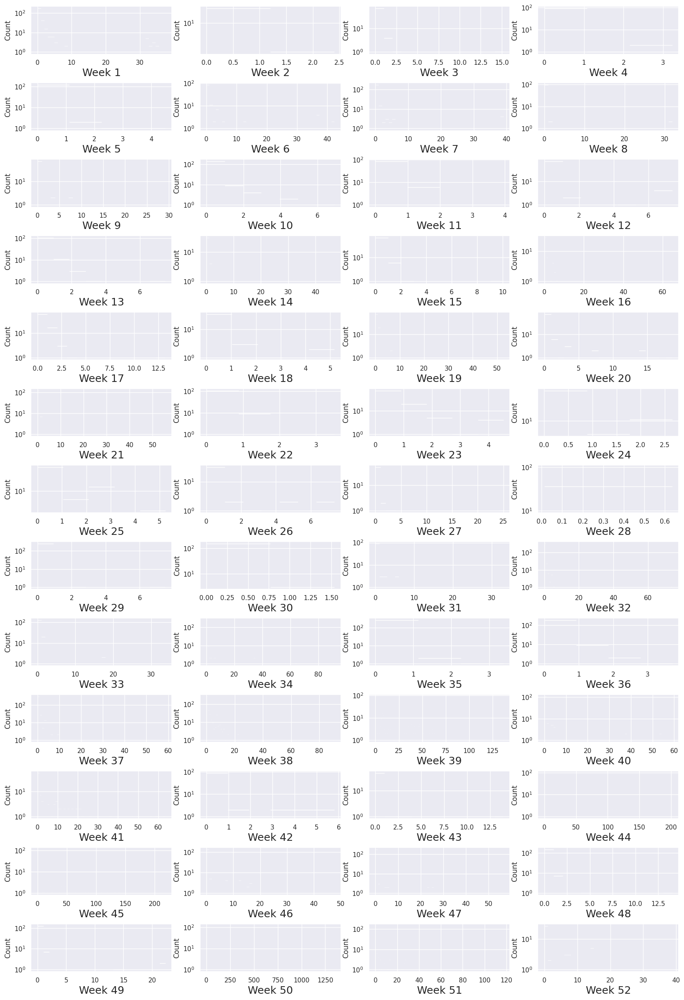

In [83]:
printmd("#### IO duration (per week)")
sns.set(rc={'figure.figsize':(20, 30)})

gridspec = {"hspace":0.6}
figure, axis = plt.subplots(13, 4, gridspec_kw=gridspec)
binwidth = 1  # in hours 

row = 0
col = 0
week_nb = 0

max_total_io_time_hours = 0

eliminated_weeks = []

for week in weeks:

    max_total_io_time_hours = max(week['TOTAL_IO_TIME'].max() / 3600, max_total_io_time_hours)
        
    g = sns.histplot(
        x=(week['TOTAL_IO_TIME'] / 3600), 
        binwidth=binwidth, 
        discrete=False,  # Our data is made of floating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, True],
        ax=axis[row, col],
        color="deepskyblue"
    )
    g.set_xlabel(f"Week {week_nb +1}", fontsize=18)
    
    #axis[row, col].set_xlim([0, 60000])
    #axis[row, col].set_ylim([1, 600])

    # g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    week_nb += 1

print(max_total_io_time_hours)
print(eliminated_weeks)
figure.savefig("io_time_weeks.png")

#### Number of bytes written (per week)

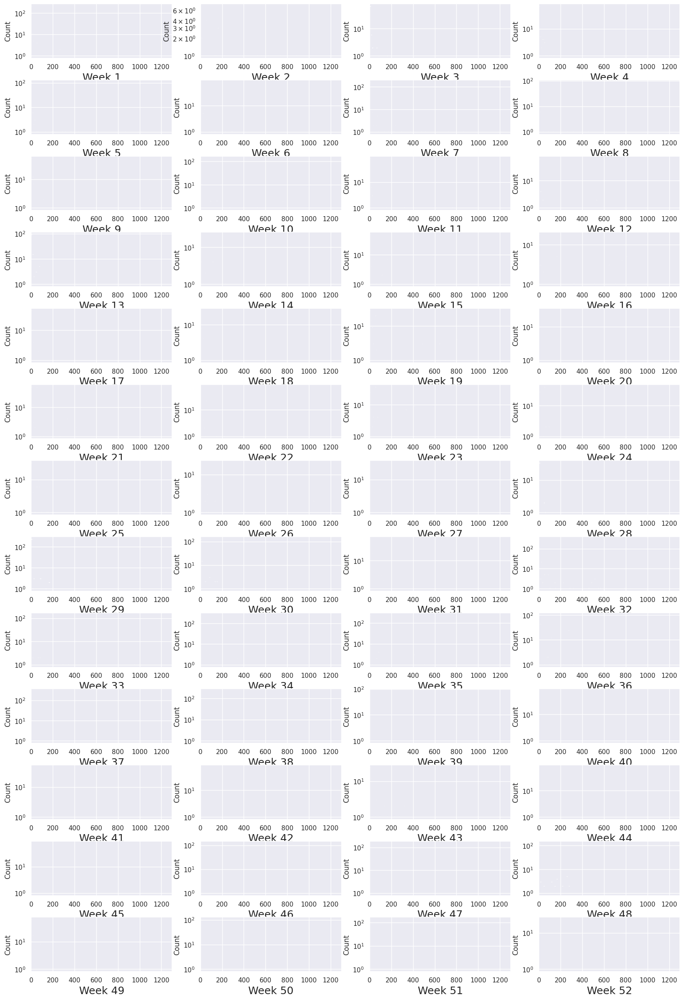

In [84]:
printmd("#### Number of bytes written (per week)")
sns.set(rc={'figure.figsize':(20, 30)})

gridspec = {"hspace":0.4}
figure, axis = plt.subplots(13, 4, gridspec_kw=gridspec)
binwidth = 10  # GB

row = 0
col = 0
week_nb = 0

max_total_written_gb = 0

eliminated_weeks = []

for week in weeks:

    binwidth = 10  # GB
    
    g = sns.histplot(
        x=week['TOTAL_BYTES_WRITTEN'] / 1_000_000_000, 
        binwidth=binwidth, 
        discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, True],
        ax=axis[row, col],
        color="deeppink"
    )
    g.set_xlabel(f"Week {week_nb +1}", fontsize=18)
    
    axis[row, col].set_xlim([0, 1300])

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    week_nb += 1

figure.savefig("io_writes_weeks.png")

#### Number of bytes read (per week)

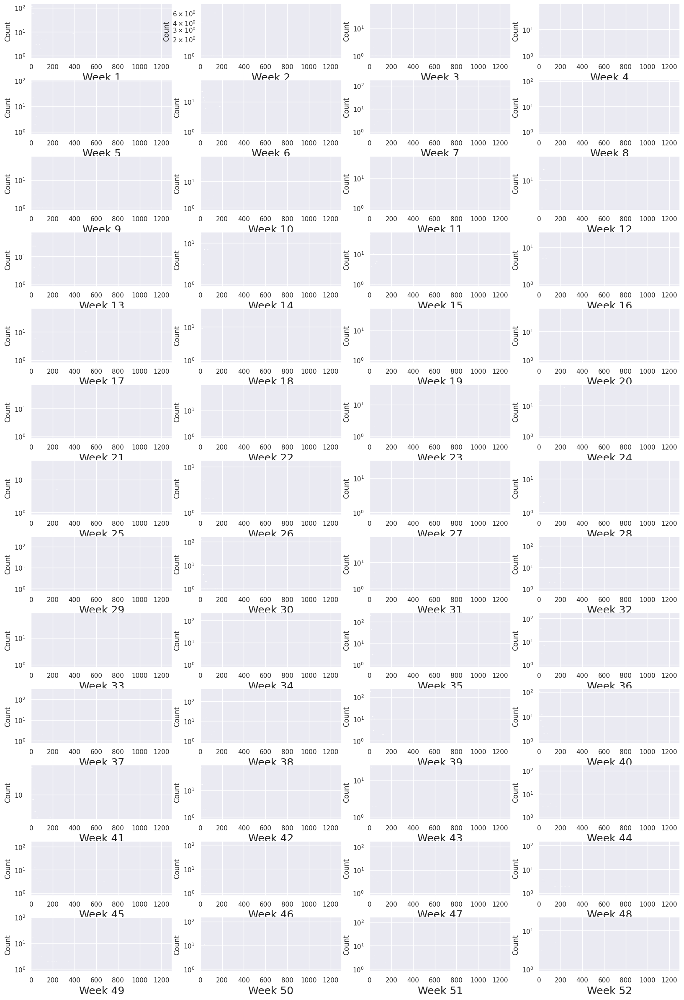

In [85]:
printmd("#### Number of bytes read (per week)")
sns.set(rc={'figure.figsize':(20, 30)})

gridspec = {"hspace":0.4}
figure, axis = plt.subplots(13, 4, gridspec_kw=gridspec)
binwidth = 10  # GB

row = 0
col = 0
week_nb = 0

max_total_written_gb = 0

eliminated_weeks = []

for week in weeks:

    binwidth = 10  # GB
    
    g = sns.histplot(
        x=week['TOTAL_BYTES_READ'] / 1_000_000_000, 
        binwidth=binwidth, 
        discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, True],
        ax=axis[row, col],
        color="mediumseagreen"
    )
    g.set_xlabel(f"Week {week_nb +1}", fontsize=18)
    
    axis[row, col].set_xlim([0, 1300])

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    week_nb += 1

figure.savefig("io_reads_weeks.png")

## Per-month histograms

#### IO duration (per month - stacked)

(0.0, 300.0)

/home/hazrael/.pyenv/versions/wstor/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


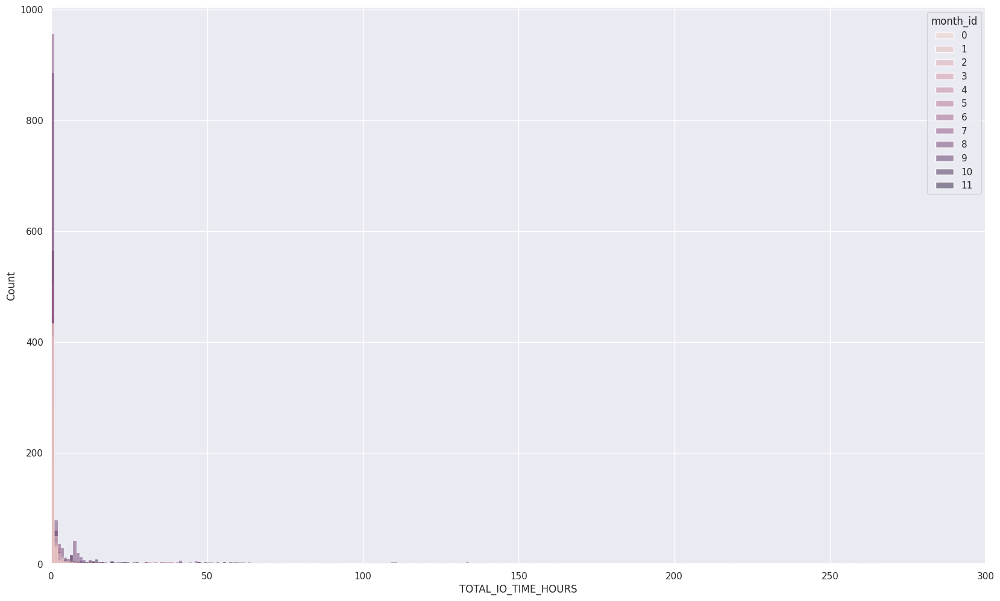

In [86]:
printmd("#### IO duration (per month - stacked)")
sns.set(rc={'figure.figsize':(20, 12)})

# gridspec = {"hspace": 0.6}
binwidth = 1  # in hours 

row = 0
col = 0
month_nb = 0

max_total_io_time_hours = 0




for month in months:
    month["month_id"] = month_nb
    month["TOTAL_IO_TIME_HOURS"] = month['TOTAL_IO_TIME'] / 3600
    month_nb += 1

df = pd.concat(months)


g = sns.histplot(
    x="TOTAL_IO_TIME_HOURS",
    hue="month_id",
    data=df,
    binwidth=1, 
)

g.set_xlim([0, 300])
# g.set(xscale='log', yscale='log')
# g.set(xlabel="Total I/O duration per job (s)", ylabel="Total I/O volume per job (Bytes)")


#figure.savefig("io_time_months.pdf")

In [87]:
printmd("#### IO duration (per month)")
sns.set(rc={'figure.figsize':(20, 12)})

# gridspec = {"hspace": 0.6}
figure, axis = plt.subplots
binwidth = 1  # in hours 

row = 0
col = 0
month_nb = 0

max_total_io_time_hours = 0


for month in months:

    print(f"Month contains {len(month)} jobs")

    max_total_io_time_hours = max(month['TOTAL_IO_TIME'].max() / 3600, max_total_io_time_hours)
    
    g = sns.histplot(
        x=(month['TOTAL_IO_TIME'] / 3600), 
        binwidth=binwidth, 
        discrete=False,  # Our data is made of floating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, False],
        ax=axis[row, col],
        color="deepskyblue"
    )
    g.set_xlabel(f"Month {month_nb +1}", fontsize=18)
    
    # axis[row, col].set_xlim([0, 60000])
    # axis[row, col].set_ylim([1, 1000])

    #g.axes.xaxis.set_minor_locator(MultipleLocator(binwidth))

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    month_nb += 1

print(max_total_io_time_hours)

figure.savefig("io_time_months.pdf")

#### IO duration (per month)

TypeError: cannot unpack non-iterable function object

In [ ]:
printmd("#### Number of bytes written (per month)")
sns.set(rc={'figure.figsize':(20, 12)})

gridspec = {"hspace":0.4}
figure, axis = plt.subplots(3, 4, gridspec_kw=gridspec)
binwidth = 10  # GB

row = 0
col = 0
month_nb = 0

binwidth = 10  # GB

for month in months:
    
    g = sns.histplot(
        x=month['TOTAL_BYTES_WRITTEN'] / 1_000_000_000, 
        binwidth=binwidth, 
        discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, False],
        ax=axis[row, col],
        color="deeppink"
    )
    g.set_xlabel(f"Month {month_nb +1}", fontsize=18)
    
    axis[row, col].set_xlim([0, 1300])

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    month_nb += 1

figure.savefig("io_writes_months.pdf")

In [ ]:
printmd("#### Number of bytes read (per month)")
sns.set(rc={'figure.figsize':(20, 12)})

gridspec = {"hspace":0.4}
figure, axis = plt.subplots(3, 4, gridspec_kw=gridspec)
binwidth = 10  # GB

row = 0
col = 0
month_nb = 0

binwidth = 10  # GB

for month in months:
    
    g = sns.histplot(
        x=month['TOTAL_BYTES_READ'] / 1_000_000_000, 
        binwidth=binwidth, 
        discrete=False,  # Our data is made loating point numbers representing hours (i.e. : 1h30 is 1.5) 
        log_scale=[False, False],
        ax=axis[row, col],
        color="mediumseagreen"
    )
    g.set_xlabel(f"Month {month_nb +1}", fontsize=18)
    
    axis[row, col].set_xlim([0, 1300])

    if col == 3:
        row += 1 
    col = (col + 1) % 4
    month_nb += 1

figure.savefig("io_reads_months.pdf")

## MONTH 5 & 6 DEBUG

Detailled case study

In [ ]:
month5 = months[4]
month5 = month5[month5["CATEGORY"] == 1]

In [ ]:
# Scatter plot of Total IO time to Total Bytes READ
g = sns.relplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                hue="CUMUL_IO_BW_MB", size="NODES_USED",
                sizes=(5, 150), palette=sns.color_palette("crest", as_cmap=True),
                data=month5)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total R/W duration per job (s)", ylabel="Total R/W bytes per job (Bytes)")
# g.set(xlim=(0.00001, 10000000000), ylim=(0.1, 1000000000000000))
g.despine(left=True, bottom=True)

sns.lineplot(x="x", y="y", data=line_75, legend=None, color="red")
sns.lineplot(x="x", y="y", data=line_25, legend=None, color="green")
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)

g.set(title=f"Month 5 - R/W")
plt.show()

In [ ]:
#month5 = month5[(month5["TOTAL_IO_VOLUME"] >= 10e10) & (month5["TOTAL_IO_VOLUME"] <= 6e11)] 
#print(month5["TOTAL_IO_VOLUME"].max())

month5 = month5[month5["cluster_label"] != 0]

### Scatter plot of Total IO time to Total Bytes READ
g = sns.relplot(x="TOTAL_IO_TIME", y="TOTAL_IO_VOLUME",
                data=month5)
g.set(xscale='log', yscale='log')
g.set(xlabel="Total R/W duration per job (s)", ylabel="Total R/W bytes per job (Bytes)")
# g.set(xlim=(0.00001, 10000000000), ylim=(0.1, 1000000000000000))
g.despine(left=True, bottom=True)

sns.lineplot(x="x", y="y", data=line_75, legend=None, color="red")
sns.lineplot(x="x", y="y", data=line_25, legend=None, color="green")
sns.lineplot(x="x", y="y", data=line_75_f, legend=None, color="#a01140", zorder=20, label="Q3 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)
sns.lineplot(x="x", y="y", data=line_25_f, legend=None, color="#2b5404", zorder=20, label="Q1 I/O BW - Filter", linestyle="-", linewidth=1, alpha=0.8)

g.set(title=f"Month 5 - R/W _ FILTERED")
plt.show()

In [ ]:
month5